In [1]:
import pandas as pd
import numpy as np
import statistics
import matplotlib.pyplot as plt
from matplotlib import figure
from sklearn.linear_model import LinearRegression as LR
from scipy.stats import norm
from functools import reduce 
import random
%matplotlib inline

In [2]:
def get_score(mdl,x,y):
    mdl.fit(x,y)
    return mdl.score(x,y)

In [3]:
def CreateScatter(df1, s1, alpha1, figsize, dpi, xlabel, xlabelsize, xticksize, ylabel, ylabelsize, yticksize,
                  title, titlefontsize, marker, scattercolor, x1=0, y1=0, df2=None, s2=None):
    '''
    Notes:
    -figsize must be in parenthesis. Ex: figsize=(6,6)
    -df1 should be points you don't want to stick out
    -df2 should be points you want to stick out
    '''
    plt.figure(figsize=figsize, dpi=dpi)
    
    # scatterplots from dataframe 1
    plt.scatter(x=df1.iloc[:,[0]],y=df1.iloc[:,[1]], 
            marker=marker, s=s1, alpha=alpha1, color=scattercolor)
    
    # text for points on scatterplot dataframe 1
    for i in range(len(df1.index)):
        plt.text(
        df1.iloc[i,0]+x1,
        df1.iloc[i,1]+y1,
        list(df1.index)[i],
        fontsize=9
        )
    
    # scatterplots from dataframe 2
    if df2 is not None:
        plt.scatter(x=df2.iloc[:,[0]],y=df2.iloc[:,[1]], 
                marker=marker, s=s2, color=scattercolor, edgecolor='black')
    

    plt.xlabel(xlabel=xlabel, fontsize=xlabelsize)
    plt.ylabel(ylabel=ylabel, fontsize=ylabelsize)
    plt.title(label=title, fontsize=titlefontsize, horizontalalignment='center', weight='bold')
    
    
    xticks = plt.xticks(fontsize=xticksize)
    yticks = plt.yticks(fontsize=yticksize)
    plt.grid(axis='both', ls='--', color='black', alpha=.25)
    plt.box()
    
    

In [4]:
def CreateBarH(df, figsize, title, titlefontsize, xticksize, yticksize, ytickrotate, 
               upperbarshiftup, lowerbarshiftdown, shiftupperbarleft, shiftlowerbarleft, textbarfontsize,
               textbarcolor, legend_labels, legend_order, legend_pos, legend_size, width=.7, color=None,):
    
    '''
    Notes:
    -futhermost column to the right is the upper bar, lower ones are to the left
    -figsize should be expressed in parenthesis. Ex: figsize = (6,6)
    -color should be expressed in brackets. Ex: color = ['black', 'red']
    -legend labels should be expressed in brackets. Ex: legend_labels = ["what", "is"]
    -legend position should be expressed in brackets. Ex: legend_pos = [.75, .6]
    -legend order should be expressed in brackets. Ex: legend_order = [1,0]
    '''
    
    df[::-1].plot.barh(figsize=figsize, width=width, color=color)

    plt.title(label=title, fontsize=titlefontsize, weight='bold', horizontalalignment='center')
    
    # text for upper bar
    for i in range(len(df[::-1].index)):
        plt.text(df[::-1].iloc[i,1]-shiftupperbarleft,
                i+upperbarshiftup,
                round(df[::-1].iloc[i,1],1), 
                fontsize=textbarfontsize, color=textbarcolor, horizontalalignment='center', weight='bold')
    
    # text for lower bar
    for i in range(len(df[::-1].index)):
        plt.text(df[::-1].iloc[i,0]-shiftlowerbarleft,
                i-lowerbarshiftdown,
                round(df[::-1].iloc[i,0],1), 
                fontsize=textbarfontsize, color=textbarcolor, horizontalalignment='center', weight='bold')
        
    plt.ylabel('')
    
    plt.box()
    xticks = plt.xticks(fontsize=xticksize)
    yticks = plt.yticks(fontsize=yticksize, rotation=ytickrotate)
    
    handles, labels = plt.gca().get_legend_handles_labels()
    labels = legend_labels

    order = legend_order

    plt.legend([handles[i] for i in order], [labels[i] for i in order], bbox_to_anchor=legend_pos,
               prop={'size': legend_size})

In [5]:
# call catch and shoot data
catch22 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2022 Catch & Shoot')
catch22.set_index('PLAYER', inplace=True)
catch21 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2021 Catch & Shoot')
catch21.set_index('PLAYER', inplace=True)
catch20 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2020 Catch & Shoot')
catch20.set_index('PLAYER', inplace=True)
catch19 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2019 Catch & Shoot')
catch19.set_index('PLAYER', inplace=True)
catch18 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2018 Catch & Shoot')
catch18.set_index('PLAYER', inplace=True)
catch17 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2017 Catch & Shoot')
catch17.set_index('PLAYER', inplace=True)
catch16 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2016 Catch & Shoot')
catch16.set_index('PLAYER', inplace=True)
catch15 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2015 Catch & Shoot')
catch15.set_index('PLAYER', inplace=True)
catch14 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2014 Catch & Shoot')
catch14.set_index('PLAYER', inplace=True)

In [6]:
allCATCH = [catch22, catch21, catch20, catch19, catch18, catch17, catch16, catch15, catch14]

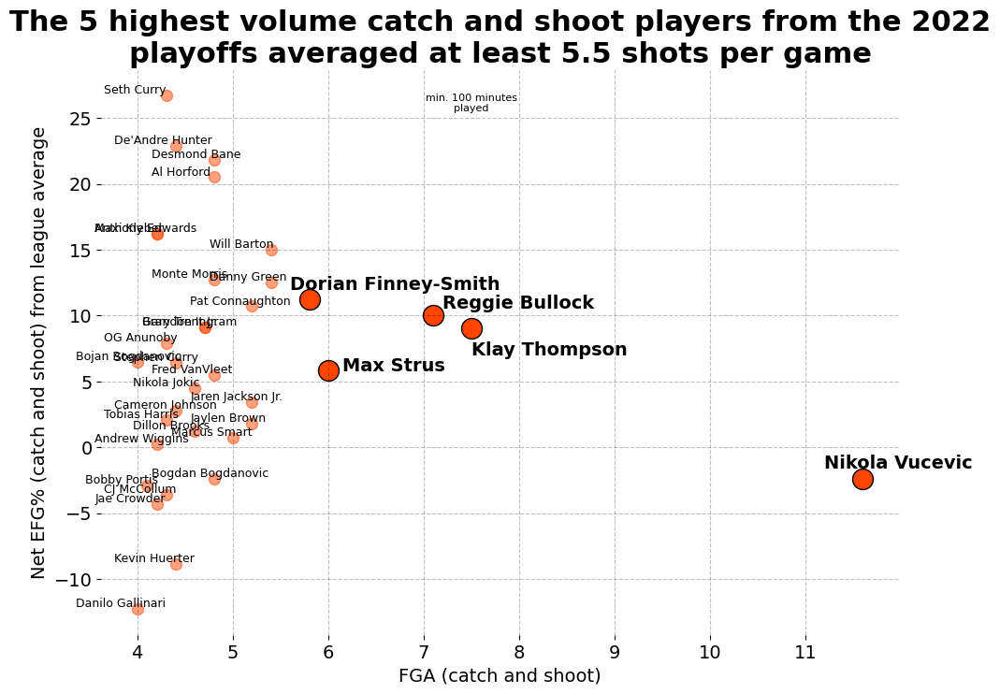

In [43]:
df1 = catch22[catch22['FGA (C & S)'] >= 4][['FGA (C & S)', 'Net EFG% (C & S) from league average']].sort_values('FGA (C & S)', ascending=False)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 5.5]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 5.5]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 5.5]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (catch and shoot)': x, 'Net EFG% (catch and shoot)':y
})
df2.set_index('PLAYER', inplace=True)

df1.shape
CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), xlabel='FGA (catch and shoot)', xlabelsize=14, xticksize=14,
             ylabel='Net EFG% (catch and shoot) from league average', ylabelsize=14, yticksize=14, title = 
'''The 5 highest volume catch and shoot players from the 2022
playoffs averaged at least 5.5 shots per game''', titlefontsize=22, marker='o', scattercolor='orangered', 
              dpi=100, df2=df2, s2=250, x1=-.65, y1=.15
             )

plt.text(11.6-.4, -2.3877005347594+.8, 'Nikola Vucevic', fontsize=14, weight='bold')
plt.text(7.5, 9.0122994652406-2, 'Klay Thompson', fontsize=14, weight='bold')
plt.text(7.1+.1, 10.0122994652406+.55, 'Reggie Bullock', fontsize=14, weight='bold')
plt.text(6.0+.15, 5.8122994652406, 'Max Strus', fontsize=14, weight='bold')
plt.text(5.8-.2, 11.2122994652406+.75, 'Dorian Finney-Smith', fontsize=14, weight='bold')

plt.text(7.5, 25.5, '''min. 100 minutes
played''', fontsize=8, horizontalalignment='center')
#plt.savefig('scat highest volume catch and shoot players for 2022.pdf',bbox_inches='tight')
plt.show()

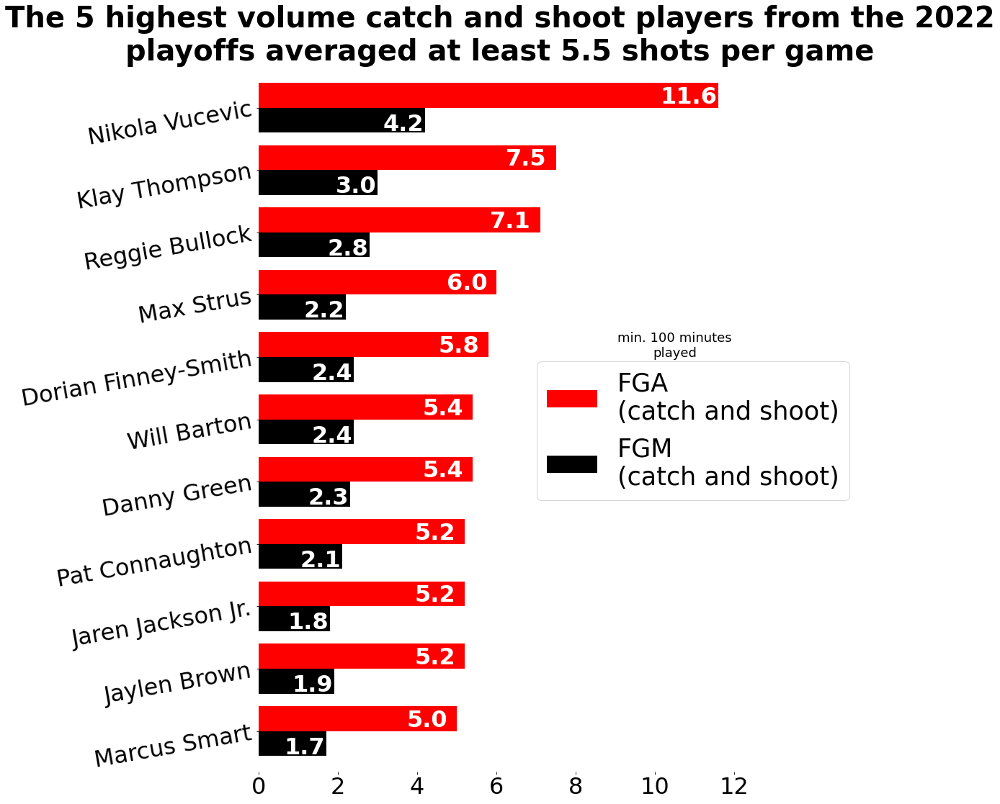

In [73]:
df1 = catch22[catch22['FGA (C & S)'] >= 4.5][['FGM (C & S)', 'FGA (C & S)']].sort_values('FGA (C & S)', ascending=False)

df1 = df1.head(11)

CreateBarH(df1, figsize=(12,18), title = 
'''The 5 highest volume catch and shoot players from the 2022
playoffs averaged at least 5.5 shots per game''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.07, lowerbarshiftdown=.37,
           shiftupperbarleft=.75, shiftlowerbarleft=.55, textbarcolor='white', textbarfontsize=32, legend_labels = 
['''FGM
(catch and shoot)''', '''FGA
(catch and shoot)'''], legend_order=[1,0], legend_pos=[.55,.6], width=.8, color=['black', 'red'], legend_size=35
          
          
          )
plt.text(10.5, 6, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar highest volume catch and shoot players from 2022.pdf',bbox_inches='tight')
plt.show()

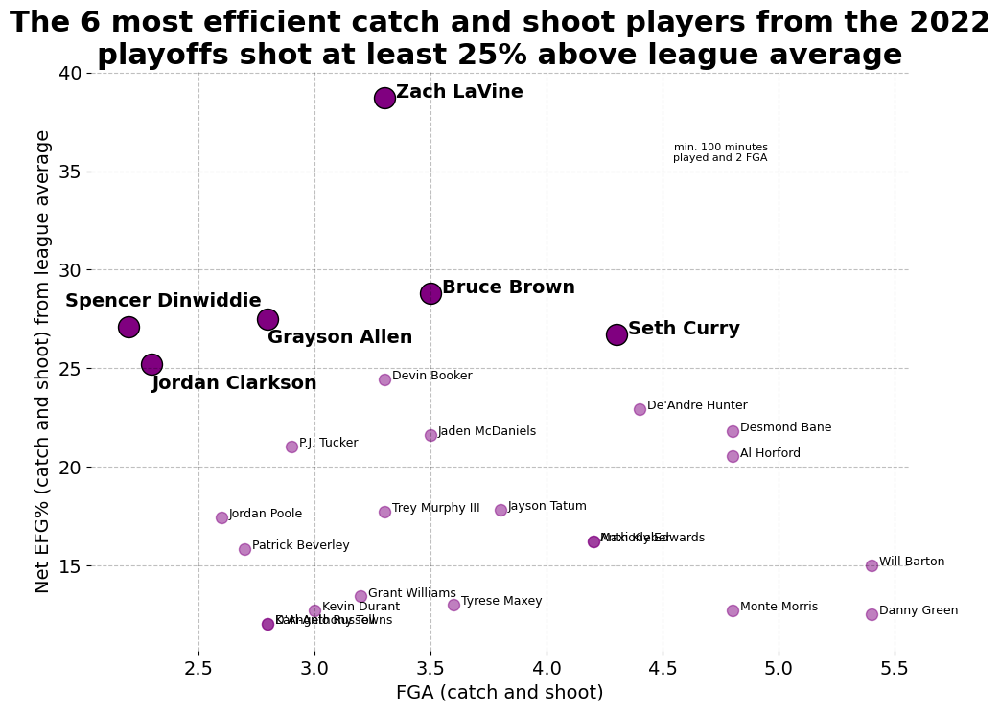

In [125]:
df1 = catch22[(catch22['FGA (C & S)'] >= 2) & (catch22['Net EFG% (C & S) from league average'] >= 12)][['FGA (C & S)', 'Net EFG% (C & S) from league average']].sort_values('Net EFG% (C & S) from league average', ascending=False)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,1] >= 25]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,1] >= 25]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,1] >= 25]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (catch and shoot)': x, 'Net EFG% (catch and shoot)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (catch and shoot)', xlabelsize=14, xticksize=14,
              ylabel='Net EFG% (catch and shoot) from league average', ylabelsize=14, yticksize=14, title = 
'''The 6 most efficient catch and shoot players from the 2022
playoffs shot at least 25% above league average''', titlefontsize=22, marker='o', scattercolor='purple', 
              df2=df2, s2=250, x1=.033
             
             )

plt.text(3.3+.05, 38.7122994652406, 'Zach LaVine', fontsize=14, weight='bold')
plt.text(3.5+.05, 28.8122994652406, 'Bruce Brown', fontsize=14, weight='bold')
plt.text(2.8, 27.5122994652406-1.25, 'Grayson Allen', fontsize=14, weight='bold')
plt.text(2.2-.275, 27.1122994652406+1, 'Spencer Dinwiddie', fontsize=14, weight='bold')
plt.text(4.3+.05, 26.7122994652406, 'Seth Curry', fontsize=14, weight='bold')
plt.text(2.3, 25.2122994652406-1.25, 'Jordan Clarkson', fontsize=14, weight='bold')

plt.text(4.75, 35.5, '''min. 100 minutes
played and 2 FGA''', fontsize=8, horizontalalignment='center')
#plt.savefig('scat most efficient catch and shoot players for 2022.pdf',bbox_inches='tight')
plt.show()

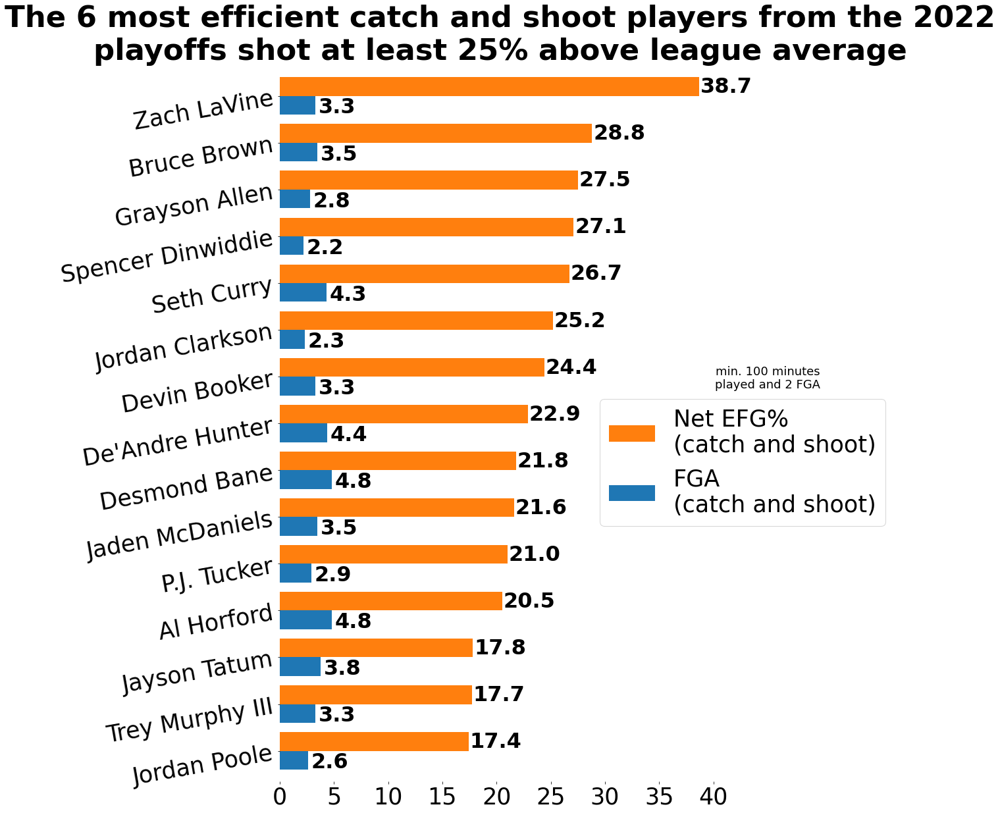

In [128]:
df = catch22[(catch22['FGA (C & S)'] >= 2) & (catch22['Net EFG% (C & S) from league average'] >= 12)][['FGA (C & S)', 'Net EFG% (C & S) from league average']].sort_values('Net EFG% (C & S) from league average', ascending=False)
df1= df.head(15)
CreateBarH(df1, figsize=(12,20), title=
'''The 6 most efficient catch and shoot players from the 2022
playoffs shot at least 25% above league average''', titlefontsize=45, xticksize=35, yticksize=35, ytickrotate=10, upperbarshiftup=.07, lowerbarshiftdown=.37,
           shiftupperbarleft=-2.5, shiftlowerbarleft=-2, textbarfontsize=32, textbarcolor='black', legend_labels= 
['''FGA
(catch and shoot)''', '''Net EFG%
(catch and shoot)'''], legend_order=[1,0], legend_pos=[.7, .55], legend_size=35, width=.8
          
          
          )
plt.text(45, 7.75, '''min. 100 minutes
played and 2 FGA''', ha='center', fontsize=18)
#plt.savefig('bar most efficient catch and shoot players from 2022.pdf',bbox_inches='tight')
plt.show()

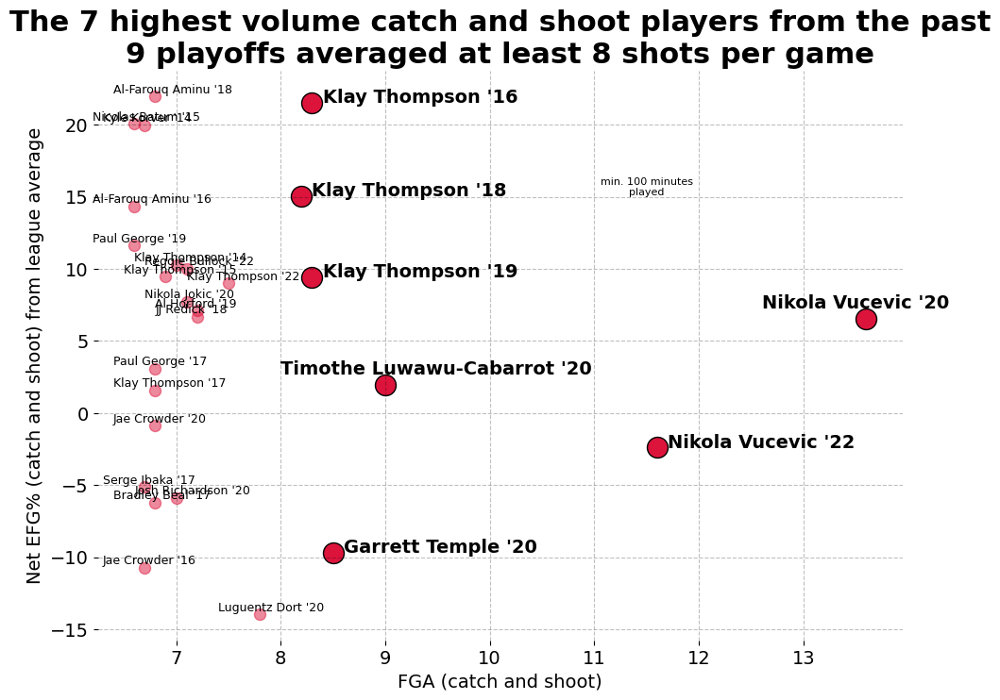

In [165]:
x = 2022
lst = []
for df in allCATCH:
    variable = df[(df['FGA (C & S)'] >= 6.5)][['FGA (C & S)', 'Net EFG% (C & S) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1
new_catch = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_catch)
df1 = new.sort_values('FGA (C & S)', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 8]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 8]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 8]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (catch and shoot)': x, 'Net EFG% (catch and shoot)':y
})
df2.set_index('PLAYER', inplace=True)


CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (catch and shoot)', xlabelsize=14, xticksize=14,
              ylabel='Net EFG% (catch and shoot) from league average', ylabelsize=14, yticksize=14, title = 
'''The 7 highest volume catch and shoot players from the past
9 playoffs averaged at least 8 shots per game''', titlefontsize=22, marker='o', scattercolor='crimson', 
              y1=.25, x1=-.4 ,df2=df2, s2=250
              
             )

plt.text(13.6-1, 6.5322751322752+.75, "Nikola Vucevic '20", fontsize=14, weight='bold')
plt.text(11.6+.1, -2.3877005347594, "Nikola Vucevic '22", fontsize=14, weight='bold')
plt.text(9.0-1, 1.9322751322752+.75, "Timothe Luwawu-Cabarrot '20", fontsize=14, weight='bold')
plt.text(8.5+.1, -9.6677248677248, "Garrett Temple '20", fontsize=14, weight='bold')
plt.text(8.3+.1, 21.5540816326531, "Klay Thompson '16", fontsize=14, weight='bold')
plt.text(8.3+.1, 9.4142105263158, "Klay Thompson '19", fontsize=14, weight='bold')
plt.text(8.2+.1, 15.0747191011236, "Klay Thompson '18", fontsize=14, weight='bold')
plt.text(11.5, 15.1, '''min. 100 minutes
played''', fontsize=8, ha='center')
#plt.savefig('scat highest volume catch and shoot players past 9.pdf',bbox_inches='tight')
plt.show()

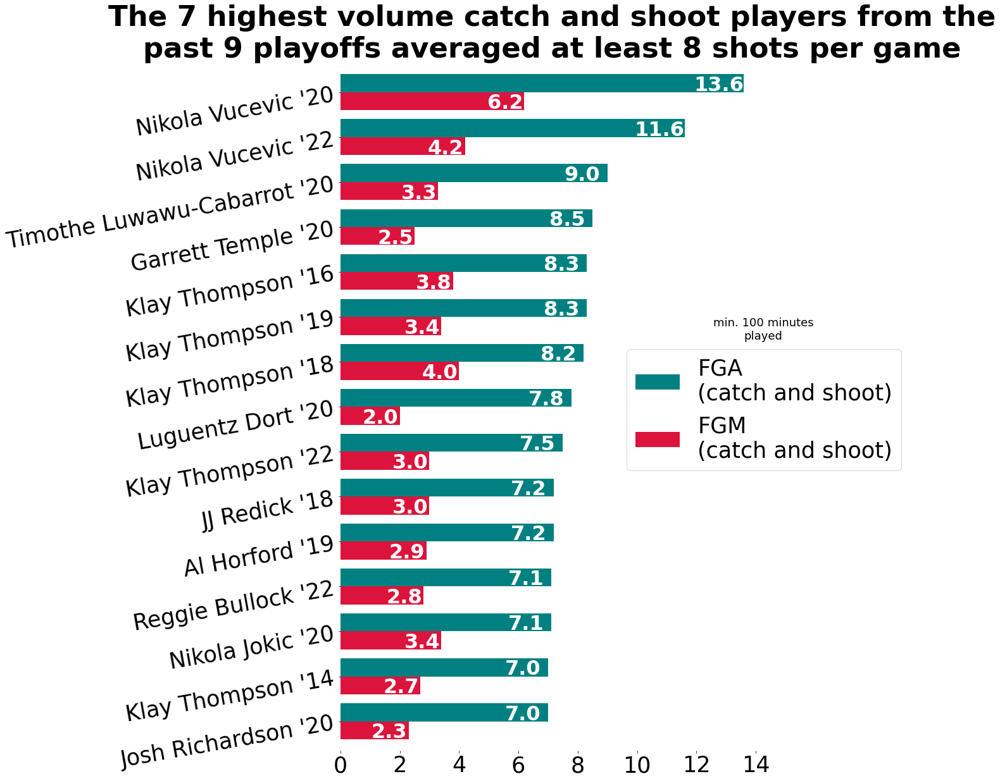

In [185]:
x = 2022
lst = []
for df in allCATCH:
    variable = df[(df['FGA (C & S)'] >= 6.5)][['FGM (C & S)', 'FGA (C & S)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1
new_catch = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_catch)
df1 = new.sort_values('FGA (C & S)', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,20), title= 
'''The 7 highest volume catch and shoot players from the
past 9 playoffs averaged at least 8 shots per game''', titlefontsize=45, xticksize=35, yticksize=35, ytickrotate=10, 
           upperbarshiftup=.035, lowerbarshiftdown=.37,
           shiftupperbarleft=.85, shiftlowerbarleft=.65, textbarcolor='white', textbarfontsize=32, legend_labels= 
['''FGM
(catch and shoot)''', '''FGA
(catch and shoot)'''], legend_order=[1,0], legend_size=35, legend_pos=[.65,.6], width=.8, color=['crimson', 'teal']
          
          )
plt.text(14.25, 8.5, '''min. 100 minutes
played''', ha='center', fontsize=18)
#plt.savefig('bar highest volume catch and shoot players past 9.pdf', bbox_inches='tight')
plt.show()

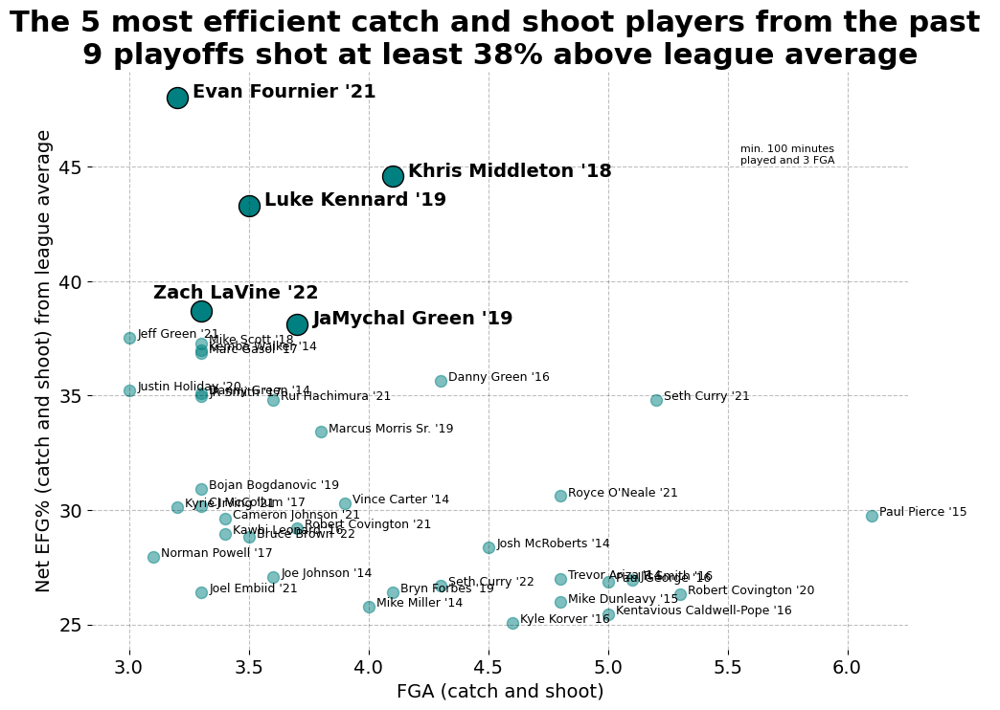

In [242]:
x = 2022
lst = []
for df in allCATCH:
    variable = df[(df['Net EFG% (C & S) from league average']>=25) & (df['FGA (C & S)'] >= 3)][['FGA (C & S)', 'Net EFG% (C & S) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1
new_catch = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_catch)
df1 = new.sort_values('Net EFG% (C & S) from league average', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,1] >= 38]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,1] >= 38]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,1] >= 38]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (catch and shoot)': x, 'Net EFG% (catch and shoot)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), xlabel='FGA (catch and shoot)', xlabelsize=14, xticksize=14,
             ylabel='Net EFG% (catch and shoot) from league average', ylabelsize=14, yticksize=14, title = 
'''The 5 most efficient catch and shoot players from the past 
9 playoffs shot at least 38% above league average''', titlefontsize=22, marker='o', scattercolor='teal', dpi=100, 
              df2=df2, s2=250, x1=.035
             )

plt.text(3.2+.065, 48.0144329896907, "Evan Fournier '21", fontsize=14, weight='bold')
plt.text(4.1+.065, 44.5747191011236, "Khris Middleton '18", fontsize=14, weight='bold')
plt.text(3.5+.065, 43.3142105263158, "Luke Kennard '19", fontsize=14, weight='bold')
plt.text(3.3-.2, 38.7122994652406+.55, "Zach LaVine '22", fontsize=14, weight='bold')
plt.text(3.7+.065, 38.1142105263158, "JaMychal Green '19", fontsize=14, weight='bold')
plt.text(5.75, 45.15, '''min. 100 minutes
played and 3 FGA''', ha='center', fontsize=8)
#plt.savefig('scat most efficient catch and shoot players past 9.pdf',bbox_inches='tight')
plt.show()

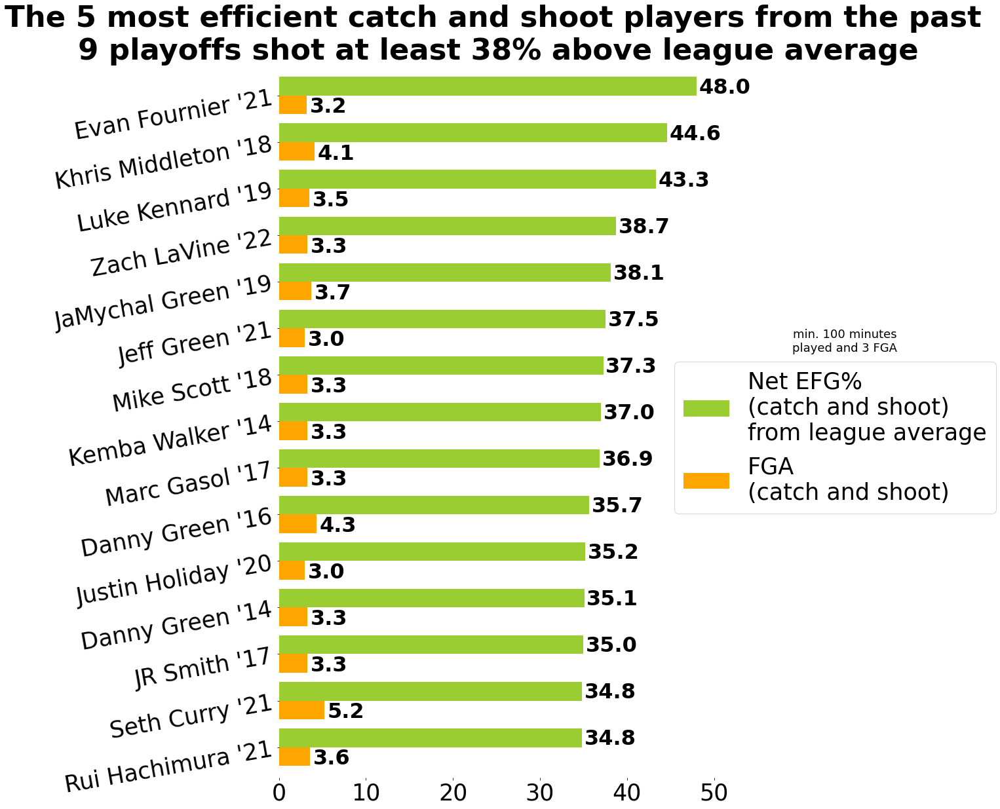

In [241]:
x = 2022
lst = []
for df in allCATCH:
    variable = df[(df['Net EFG% (C & S) from league average']>=25) & (df['FGA (C & S)'] >= 3)][['FGA (C & S)', 'Net EFG% (C & S) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1
new_catch = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_catch)
df1 = new.sort_values('Net EFG% (C & S) from league average', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,20), title=
'''The 5 most efficient catch and shoot players from the past 
9 playoffs shot at least 38% above league average''', titlefontsize=45, xticksize=35, yticksize=35, 
           upperbarshiftup=.05, lowerbarshiftdown=.37, shiftupperbarleft=-3.25,
          shiftlowerbarleft=-2.5, textbarcolor='black', textbarfontsize=32, ytickrotate=10, legend_labels= 
['''FGA
(catch and shoot)''', '''Net EFG%
(catch and shoot)
from league average'''], legend_order=[1,0], legend_size=35, legend_pos=[.875,.6], color=['orange', 'yellowgreen'],
          width=.8)
plt.text(65, 8.5, '''min. 100 minutes
played and 3 FGA''', ha='center', fontsize=18)
#plt.savefig('Most efficient catch and shoot players past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

In [243]:
# call pull up data
pulls22 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2022 Pull Ups')
pulls22.set_index('PLAYER', inplace=True)
pulls21 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2021 Pull Ups')
pulls21.set_index('PLAYER', inplace=True)
pulls20 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2020 Pull Ups')
pulls20.set_index('PLAYER', inplace=True)
pulls19 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2019 Pull Ups')
pulls19.set_index('PLAYER', inplace=True)
pulls18 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2018 Pull Ups')
pulls18.set_index('PLAYER', inplace=True)
pulls17 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2017 Pull Ups')
pulls17.set_index('PLAYER', inplace=True)
pulls16 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2016 Pull Ups')
pulls16.set_index('PLAYER', inplace=True)
pulls15 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2015 Pull Ups')
pulls15.set_index('PLAYER', inplace=True)
pulls14 = pd.read_excel('nbaVolume&Efficiency.xlsx', sheet_name='Playoffs 2014 Pull Ups')
pulls14.set_index('PLAYER', inplace=True)

In [245]:
allPULLS = [pulls22, pulls21, pulls20, pulls19, pulls18, pulls17, pulls16, pulls15, pulls14]

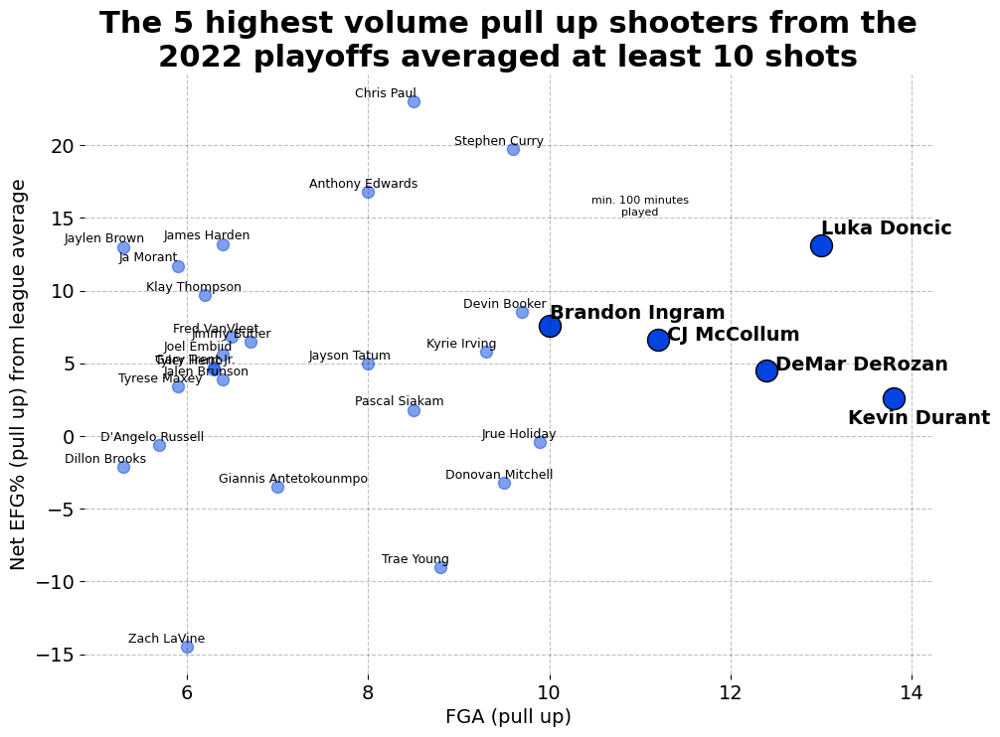

In [270]:
df1 = pulls22[(pulls22['FGA (Pull Up)']>=5)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from league average']].sort_values('FGA (Pull Up)', ascending=False)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 10]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 10]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 10]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (pull ups)': x, 'Net EFG% (pull up)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (pull up)', xlabelsize=14, xticksize=14,
              ylabel='Net EFG% (pull up) from league average', ylabelsize=14, yticksize=14, title = 
'''The 5 highest volume pull up shooters from the
2022 playoffs averaged at least 10 shots''', titlefontsize=22, marker='o', scattercolor='xkcd:blue', 
              x1=-.65,y1=.3, df2=df2, s2=250
             
             )

plt.text(11, 15.2, '''min. 100 minutes
played''', fontsize=8, horizontalalignment='center')

plt.text(13.8-.5, 2.6028735632184-1.75, 'Kevin Durant', fontsize=14, weight='bold')
plt.text(13.0, 13.1028735632184+.75, 'Luka Doncic', fontsize=14, weight='bold')
plt.text(12.4+.1, 4.5028735632184, 'DeMar DeRozan', fontsize=14, weight='bold')
plt.text(11.2+.1, 6.6028735632184, 'CJ McCollum', fontsize=14, weight='bold')
plt.text(10.0, 7.6028735632184+.5, 'Brandon Ingram', fontsize=14, weight='bold')

#plt.savefig('scat highest volume pull up shooter 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

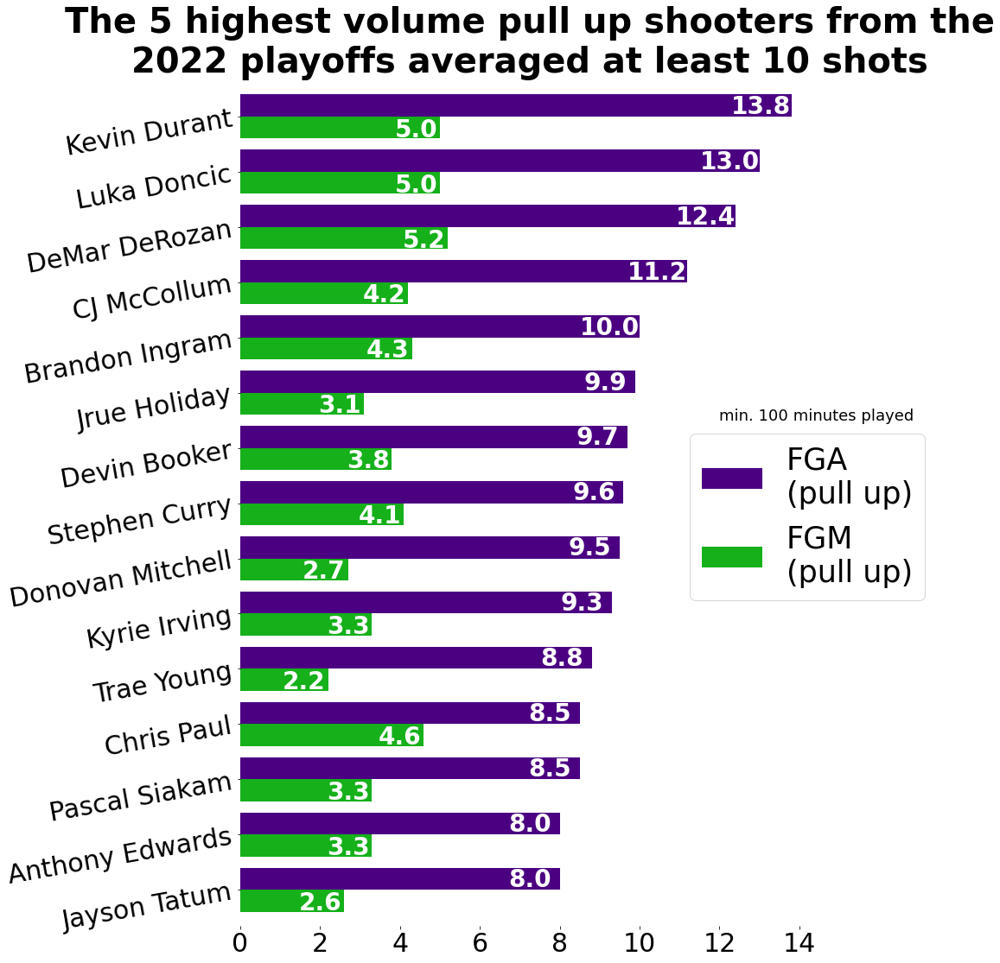

In [282]:
df1 = pulls22[(pulls22['FGA (Pull Up)']>=8)][['FGM (Pull Up)', 'FGA (Pull Up)']].sort_values('FGA (Pull Up)', ascending=False)
CreateBarH(df1, figsize=(12,18), title = 
'''The 5 highest volume pull up shooters from the
2022 playoffs averaged at least 10 shots''', titlefontsize=40, xticksize=30, yticksize=30, ytickrotate=10, 
           upperbarshiftup=.05, lowerbarshiftdown=.37,
           shiftupperbarleft=.75, shiftlowerbarleft=.6, textbarfontsize=28, textbarcolor='white', legend_labels= 
['''FGM
(pull up)''', '''FGA
(pull up)'''], legend_order=[1,0], legend_pos=[.75,.6], legend_size=35, width=.8, color=['xkcd:green', 'indigo']
          )
plt.text(12, 8.5, 'min. 100 minutes played', fontsize=18, color='black')
#plt.savefig('bar highest volume pull up shooters from 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

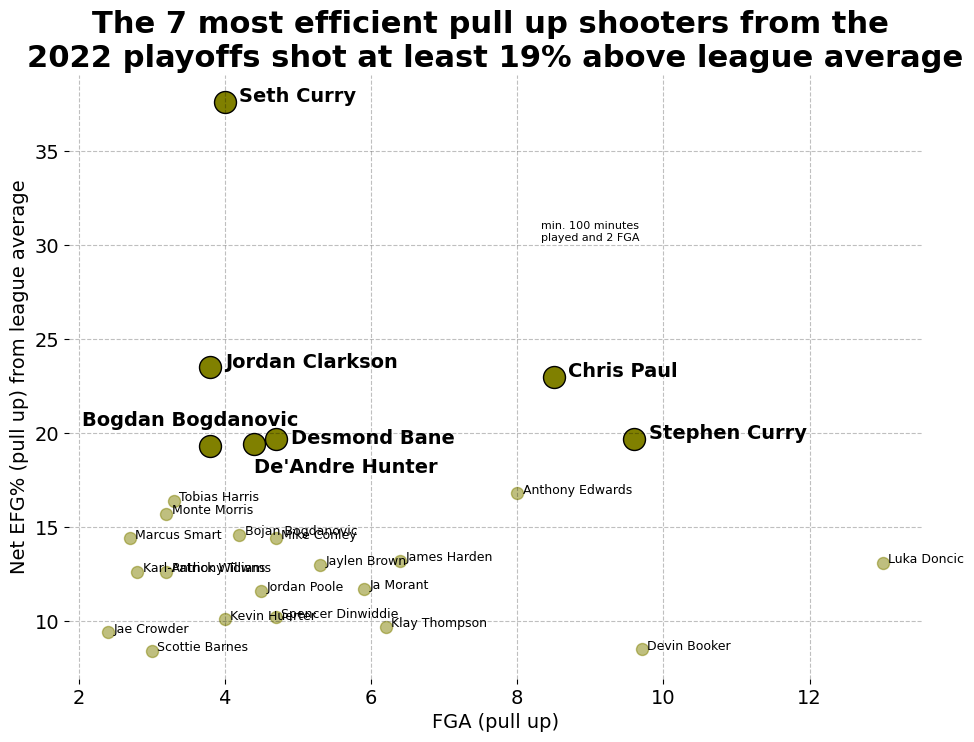

In [322]:
df1 = pulls22[(pulls22['FGA (Pull Up)']>=2) & (pulls22['Net EFG% (Pull Up) from league average']>=8)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from league average']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,1] >= 19]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,1] >= 19]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,1] >= 19]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (pull ups)': x, 'Net EFG% (pull up)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (pull up)', 
              ylabel='Net EFG% (pull up) from league average', ylabelsize=14, yticksize=14, title = 
'''The 7 most efficient pull up shooters from the 
2022 playoffs shot at least 19% above league average''', titlefontsize=22, marker='o', scattercolor='olive', xlabelsize=14, 
              xticksize=14, x1=.075, df2=df2, s2=250
             )

plt.text(9, 30.25, '''min. 100 minutes
played and 2 FGA''', fontsize=8, color='black', horizontalalignment='center')

plt.text(4.0+.2, 37.6028735632184, 'Seth Curry', fontsize=14, weight='bold')
plt.text(3.8+.2, 23.5028735632184, 'Jordan Clarkson', fontsize=14, weight='bold')
plt.text(8.5+.2, 23.0028735632184, 'Chris Paul', fontsize=14, weight='bold')
plt.text(4.7+.2, 19.7028735632184-.25, 'Desmond Bane', fontsize=14, weight='bold')
plt.text(9.6+.2, 19.7028735632184, 'Stephen Curry', fontsize=14, weight='bold')
plt.text(4.4, 19.4028735632184-1.5, "De'Andre Hunter", fontsize=14, weight='bold')
plt.text(3.8-1.75, 19.3028735632184+1.1, 'Bogdan Bogdanovic', fontsize=14, weight='bold')
#plt.savefig('scat most efficient pull up shooters 2022.pdf', bbox_inches='tight')
plt.show()

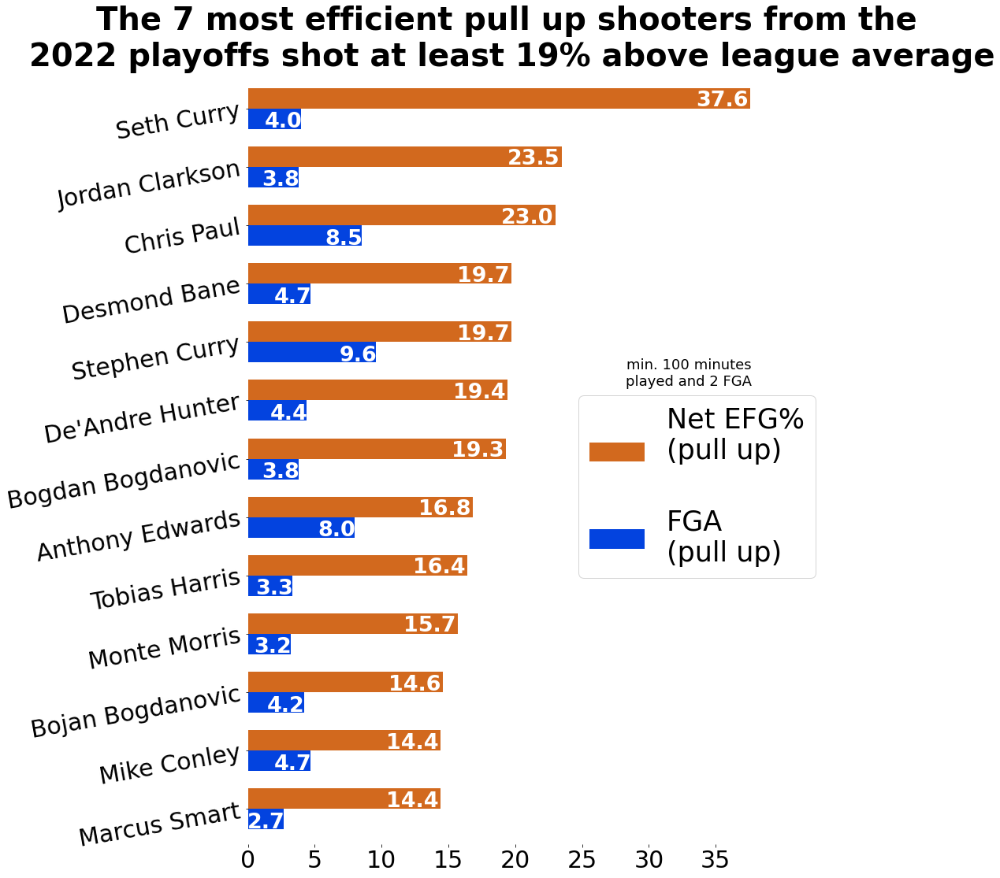

In [352]:
df = pulls22[(pulls22['FGA (Pull Up)']>=2) & (pulls22['Net EFG% (Pull Up) from league average']>=13.5)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from league average']]
CreateBarH(df, figsize=(12,18), title=
'''The 7 most efficient pull up shooters from the 
2022 playoffs shot at least 19% above league average''', titlefontsize=40, xticksize=30, yticksize=30, 
           ytickrotate=10, upperbarshiftup=.035, lowerbarshiftdown=.33,
           shiftupperbarleft=2.1, shiftlowerbarleft=1.35, textbarfontsize=27, textbarcolor='white', legend_labels= 
['''FGA
(pull up)''', '''Net EFG%
(pull up)
'''], legend_order=[1,0], legend_pos=[.6,.6], legend_size=35, width=.7, color=
['xkcd:blue', 'chocolate']
          )
plt.text(33, 7.25, '''min. 100 minutes
played and 2 FGA''', fontsize=18, color='black', horizontalalignment='center')
#plt.savefig('bar most efficient pull up shooters from 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

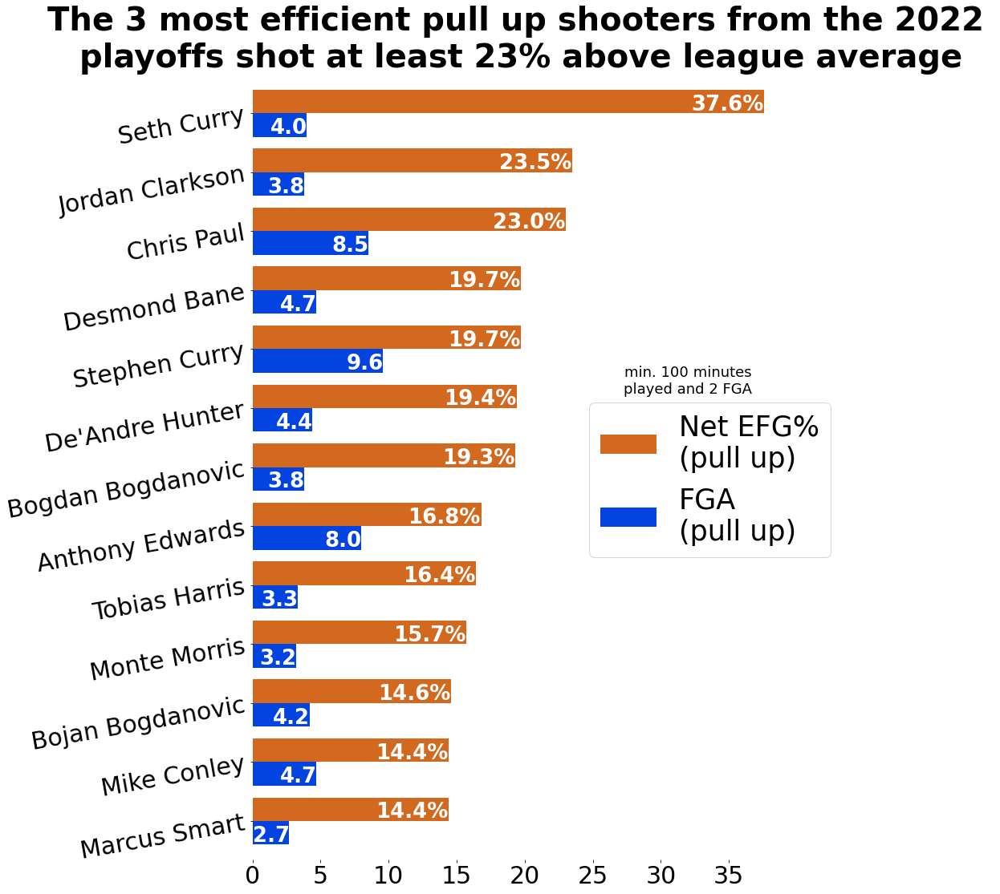

In [403]:
df = pulls22[(pulls22['FGA (Pull Up)']>=2) & (pulls22['Net EFG% (Pull Up) from league average']>=14)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from league average']]

df[::-1].plot.barh(figsize=(12,18), width=.8, color=['xkcd:blue', 'chocolate'])

plt.title('''The 3 most efficient pull up shooters from the 2022 
playoffs shot at least 23% above league average''', fontsize=40, weight='bold', horizontalalignment='center')

plt.text(32, 7.25, '''min. 100 minutes
played and 2 FGA''', fontsize=18, color='black', horizontalalignment='center')


for i in range(len(df[::-1].index)):
    plt.text(df[::-1].iloc[i,1]-2.7,
            i+.05,
            str(round(df[::-1].iloc[i,1],1))+ '%', 
            fontsize=26, color='white', horizontalalignment='center', weight='bold')
    
for i in range(len(df[::-1].index)):
    plt.text(df[::-1].iloc[i,0]-1.325,
            i-.35,
            df[::-1].iloc[i,0], 
            fontsize=26, color='white', horizontalalignment='center', weight='bold')

plt.ylabel('')

plt.box()
yticks = plt.yticks(fontsize=30, rotation=10)
xticks = plt.xticks(fontsize=30)

handles, labels = plt.gca().get_legend_handles_labels()
labels = ['''FGA
(pull up)''', '''Net EFG%
(pull up)''']

order = [1,0]

plt.legend([handles[i] for i in order], [labels[i] for i in order], bbox_to_anchor=[.6,.6],prop={'size': 35})

#plt.savefig('bar most efficient pull up shooters from 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

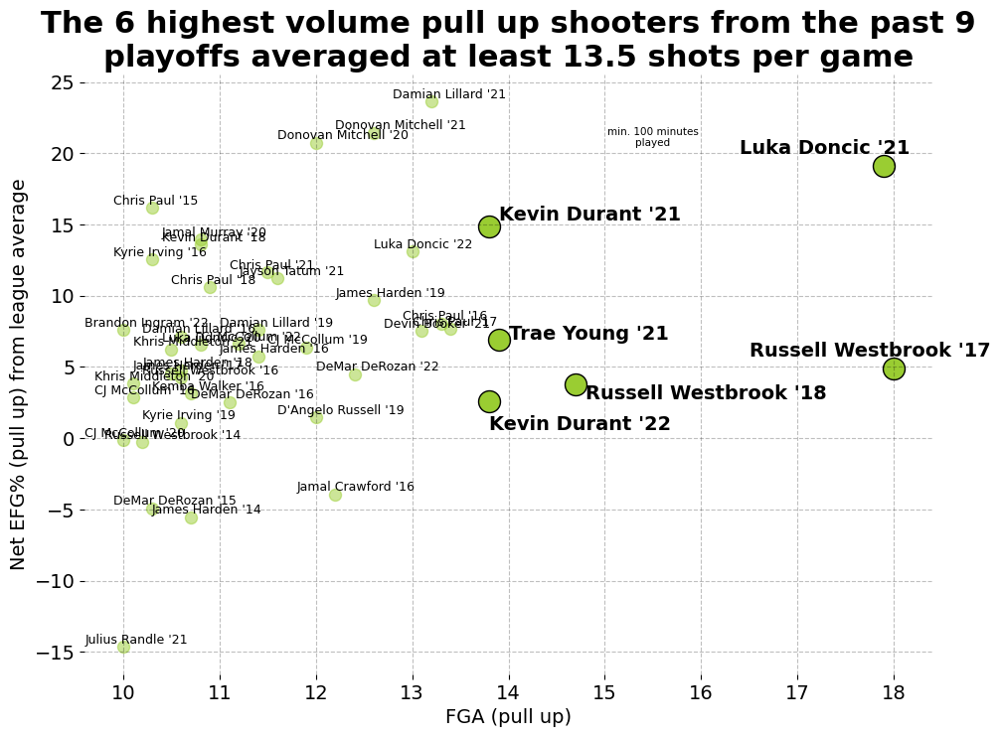

In [383]:
x = 2022
lst = []
for df in allPULLS:
    variable = df[(df['FGA (Pull Up)'] >= 10)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1
new_pulls = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_pulls)
df1 = new.sort_values('FGA (Pull Up)', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 13.5]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 13.5]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 13.5]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (catch and shoot)': x, 'Net EFG% (catch and shoot)':y
})
df2.set_index('PLAYER', inplace=True)
CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (pull up)', xlabelsize=14, xticksize=14,
              ylabel='Net EFG% (pull up) from league average', ylabelsize=14, yticksize=14, title = 
'''The 6 highest volume pull up shooters from the past 9
playoffs averaged at least 13.5 shots per game''', titlefontsize=22, marker='o', scattercolor='yellowgreen', 
              df2=df2, s2=250, x1=-.4, y1=.25
             )

plt.text(18.0-1.5, 4.8774566473988+.85, "Russell Westbrook '17", fontsize=14, weight='bold')
plt.text(17.9-1.5, 19.1441340782123+.85, "Luka Doncic '21", fontsize=14, weight='bold')
plt.text(14.7+.1, 3.78-1, "Russell Westbrook '18", fontsize=14, weight='bold')
plt.text(13.9+.1, 6.9441340782123, "Trae Young '21", fontsize=14, weight='bold')
plt.text(13.8+.1, 14.8441340782123+.45, "Kevin Durant '21", fontsize=14, weight='bold')
plt.text(13.8, 2.6028735632184-2, "Kevin Durant '22", fontsize=14, weight='bold')

plt.text(15.5, 20.5, '''min. 100 minutes
played''', fontsize=7.5, horizontalalignment='center')

plt.savefig('scat highest volume pull up shooters past 9.pdf',bbox_inches='tight')
plt.show()

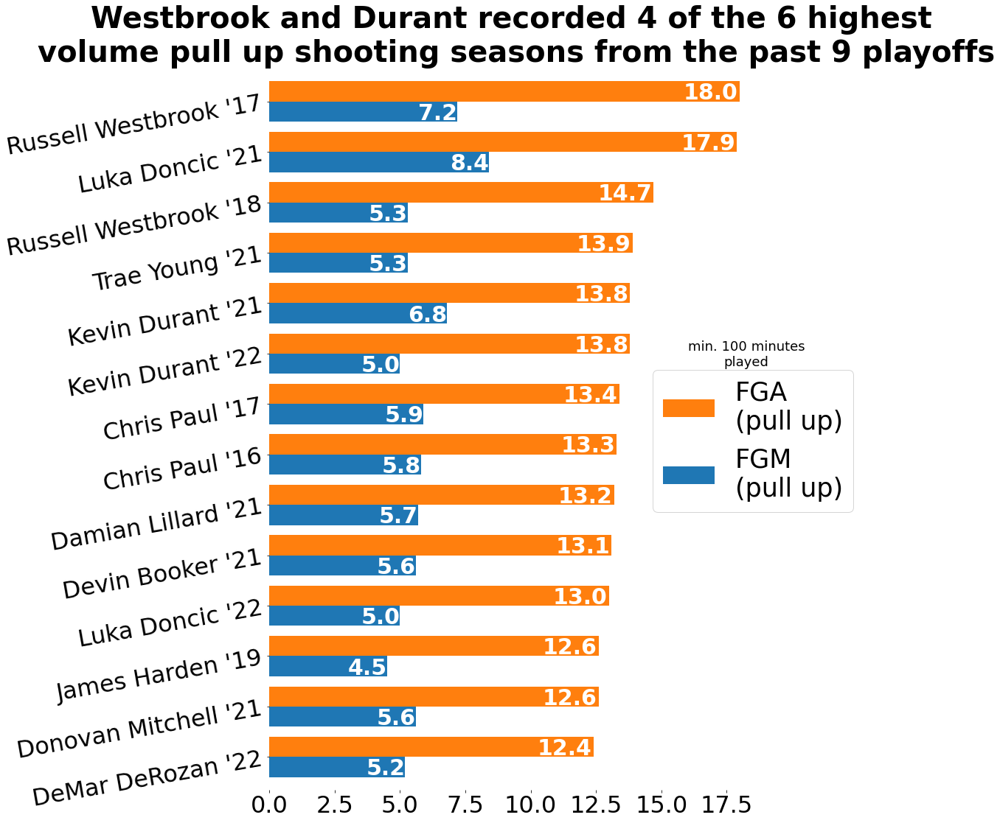

In [414]:
x = 2022
lst = []
for df in allPULLS:
    variable = df[(df['FGA (Pull Up)'] >= 10)][['FGM (Pull Up)', 'FGA (Pull Up)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1
new_pulls = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_pulls)
df1 = new.sort_values('FGA (Pull Up)', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(14)

CreateBarH(df1, figsize=(12,18), title=
'''Westbrook and Durant recorded 4 of the 6 highest 
volume pull up shooting seasons from the past 9 playoffs''', titlefontsize=40, xticksize=32, yticksize=32, 
           ytickrotate=10, upperbarshiftup=.035, lowerbarshiftdown=.365,
           shiftupperbarleft=1.1, shiftlowerbarleft=.75, textbarfontsize=30, textbarcolor='white', legend_labels = 
['''FGM
(pull up)''', '''FGA
(pull up)'''], legend_order=[1,0], legend_pos=[.75, .6], legend_size=35, width=.8
          )
plt.text(18.25, 7.75, '''min. 100 minutes
played''', fontsize=18, ha='center')

#plt.savefig('bar highest volume pull up shooters past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

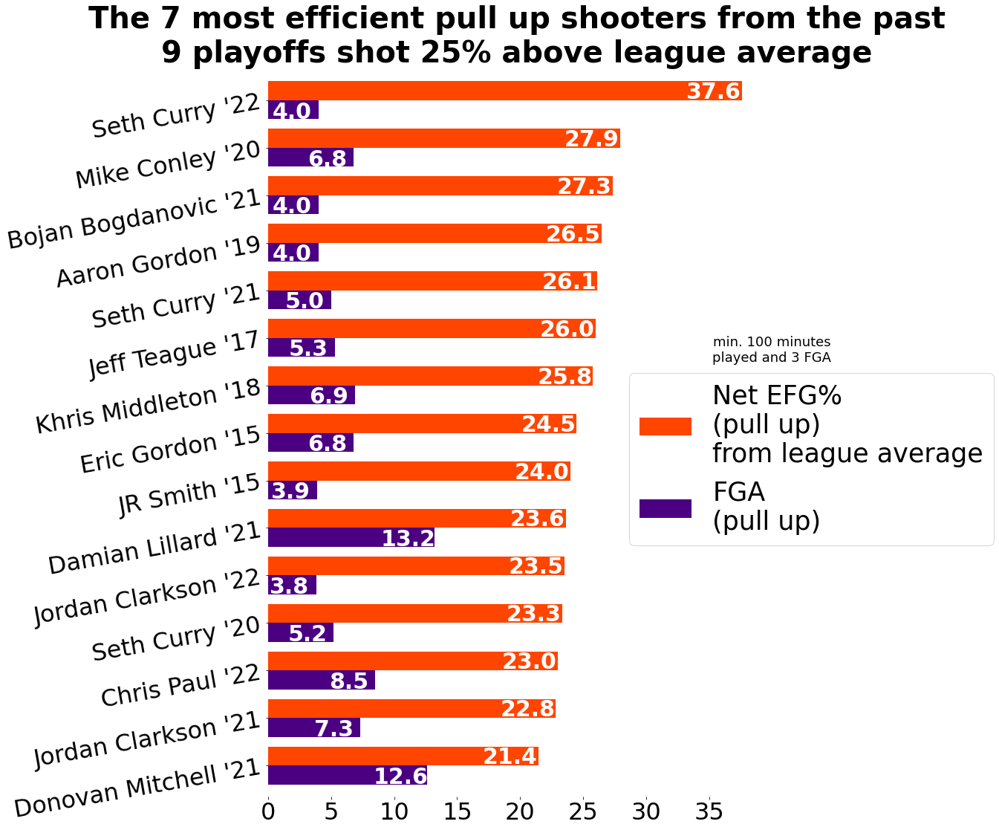

In [471]:
x = 2022
lst = []
for df in allPULLS:
    variable = df[(df['Net EFG% (Pull Up) from league average']>=18) & (df['FGA (Pull Up)'] >= 3)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1
new_pulls = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_pulls)
df1 = new.sort_values('Net EFG% (Pull Up) from league average', ascending=False)
df1.set_index('PLAYER',inplace=True)
df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title=
'''The 7 most efficient pull up shooters from the past
9 playoffs shot 25% above league average''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.0325, lowerbarshiftdown=.385,
           shiftupperbarleft=2.25, shiftlowerbarleft=2.1, textbarfontsize=30, textbarcolor='white',legend_labels=
['''FGA
(pull up)''','''Net EFG%
(pull up)
from league average'''], legend_order=[1,0], legend_pos=[.7,.6], legend_size=35, width=.8, color=['indigo', 'orangered']
          )
plt.text(40, 8.5, '''min. 100 minutes
played and 3 FGA''', fontsize=18, ha='center')

#plt.savefig('bar most efficient pull up shooters past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

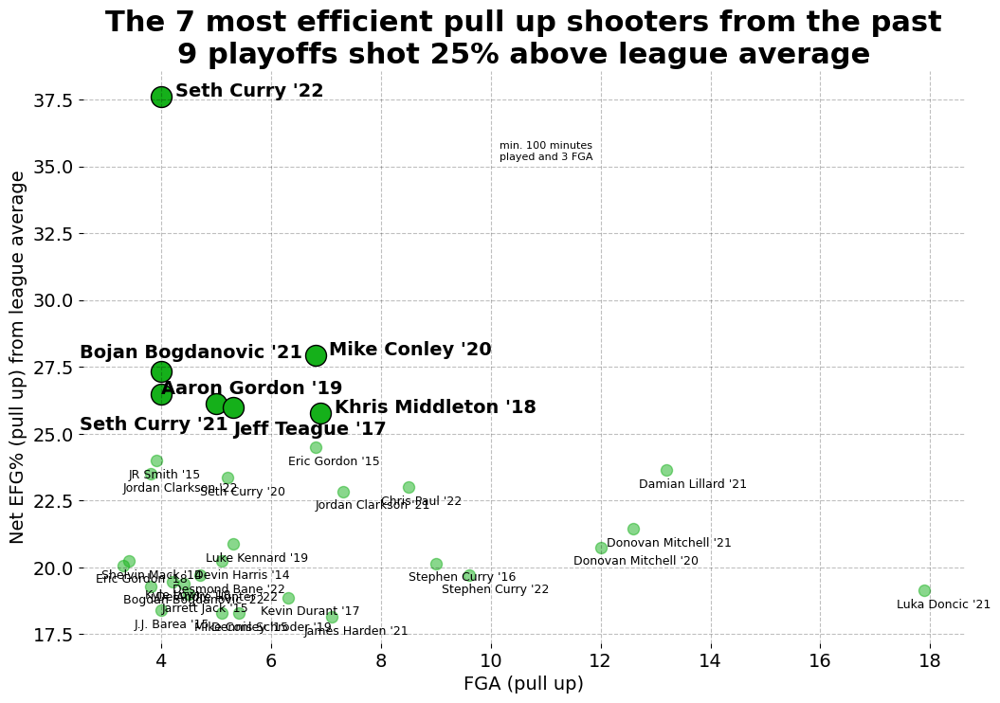

In [469]:
x = 2022
lst = []
for df in allPULLS:
    variable = df[(df['Net EFG% (Pull Up) from league average'] >= 18) & (df['FGA (Pull Up)'] >= 3)][['FGA (Pull Up)', 'Net EFG% (Pull Up) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1
new_pulls = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_pulls)
df1 = new.sort_values('Net EFG% (Pull Up) from league average', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,1] >= 25]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,1] >= 25]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,1] >= 25]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (catch and shoot)': x, 'Net EFG% (catch and shoot)':y
})
df2.set_index('PLAYER', inplace=True)
CreateScatter(df1, s1=75, alpha1=.5, figsize=(12,8), dpi=100, xlabel='FGA (pull up)', xlabelsize=14, xticksize=14,
              ylabel='Net EFG% (pull up) from league average', ylabelsize=14, yticksize=14, title = 
'''The 7 most efficient pull up shooters from the past
9 playoffs shot 25% above league average''', titlefontsize=22, marker='o', scattercolor='xkcd:green', 
              df2=df2, s2=250, x1=-.5, y1=-.65
             )

plt.text(4.0+.25, 37.6028735632184, "Seth Curry '22", fontsize=14, weight='bold')
plt.text(6.8+.25, 27.9459770114942, "Mike Conley '20", fontsize=14, weight='bold')
plt.text(4.0-1.5, 27.3441340782123+.5, "Bojan Bogdanovic '21", fontsize=14, weight='bold')
plt.text(4.0, 26.48, "Aaron Gordon '19", fontsize=14, weight='bold')
plt.text(5.0-2.5, 26.1441340782123-1, "Seth Curry '21", fontsize=14, weight='bold')
plt.text(5.3, 25.9774566473988-1, "Jeff Teague '17", fontsize=14, weight='bold')
plt.text(6.9+.25, 25.78, "Khris Middleton '18", fontsize=14, weight='bold')

plt.text(11, 35.25, '''min. 100 minutes
played and 3 FGA''', fontsize=8, horizontalalignment='center')
#plt.savefig('scat most efficient pull up shooters past 9 playoffs.pdf', bbox_inches='tight')

plt.show()

In [5]:
# call Drives data
Drives22 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DRIVES 2021-22')
Drives22.set_index('PLAYER', inplace=True)
Drives21 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DRIVES 2020-21')
Drives21.set_index('PLAYER', inplace=True)
Drives20 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DRIVES 2019-20')
Drives20.set_index('PLAYER', inplace=True)
Drives19 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DRIVES 2018-19')
Drives19.set_index('PLAYER', inplace=True)
Drives18 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DRIVES 2017-18')
Drives18.set_index('PLAYER', inplace=True)
Drives17 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DRIVES 2016-17')
Drives17.set_index('PLAYER', inplace=True)
Drives16 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DRIVES 2015-16')
Drives16.set_index('PLAYER', inplace=True)
Drives15 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DRIVES 2014-15')
Drives15.set_index('PLAYER', inplace=True)
Drives14 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DRIVES 2013-14')
Drives14.set_index('PLAYER', inplace=True)

In [6]:
allDRIVES = [Drives22, Drives21, Drives20, Drives19, Drives18, Drives17, Drives16, Drives15, Drives14]

In [10]:
for df in allDRIVES:
    df['MP'] = df['GP'] * df['MIN']
    df['Net FG% (Drives) from league average'] = df['FG% (Drives)'] - df['FG% (Drives)'].mean()

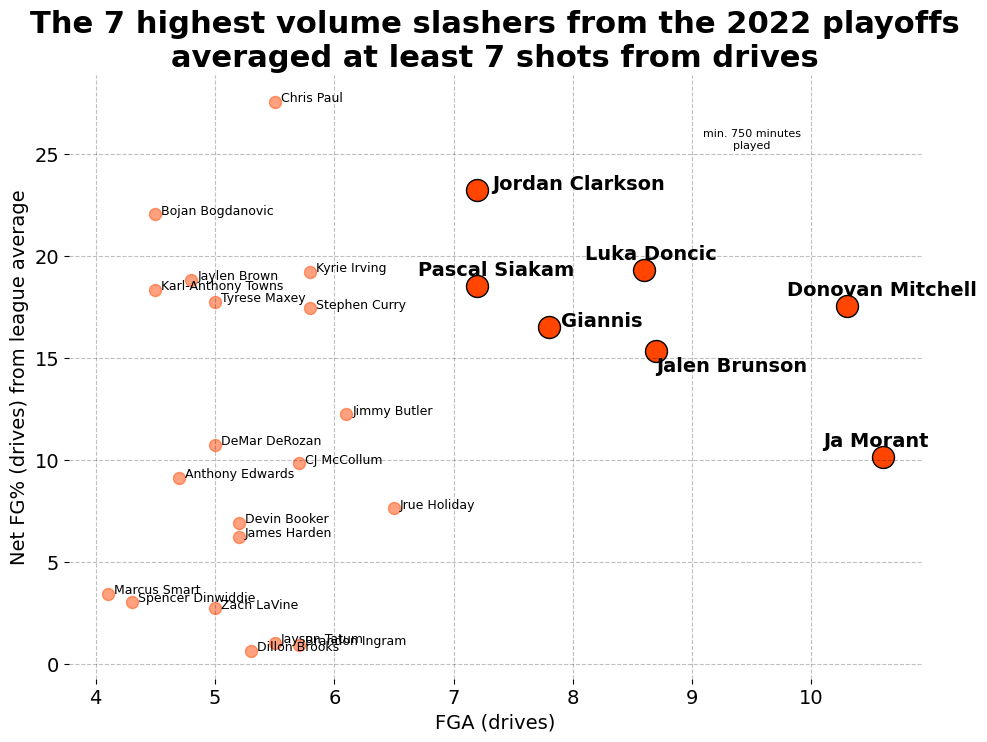

In [40]:
df1 = Drives22[(Drives22['FGA (Drives)']>=4) & (Drives22['MP']>=100)][['FGA (Drives)', 'Net FG% (Drives) from league average']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 7]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 7]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 7]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (drives)': x, 'Net EFG% (drives)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (drives)', xlabelsize=14, xticksize=14,
              ylabel='Net FG% (drives) from league average', ylabelsize=14, yticksize=14, title = 
'''The 7 highest volume slashers from the 2022 playoffs
averaged at least 7 shots from drives''', titlefontsize=22, marker='o', scattercolor='orangered', 
              df2=df2, s2=250, x1=.05
             )


plt.text(10.3-.5, 17.532718894009193+.5, 'Donovan Mitchell', fontsize=14, weight='bold')
plt.text(7.8+.1, 16.532718894009193, 'Giannis', fontsize=14, weight='bold')
plt.text(10.6-.5, 10.132718894009194+.5, 'Ja Morant', fontsize=14, weight='bold')
plt.text(8.7, 15.332718894009197-1, 'Jalen Brunson', fontsize=14, weight='bold')
plt.text(7.2+.125, 23.232718894009196, 'Jordan Clarkson', fontsize=14, weight='bold')
plt.text(8.6-.5, 19.332718894009197+.5, 'Luka Doncic', fontsize=14, weight='bold')
plt.text(7.2-.5, 18.532718894009193+.5, 'Pascal Siakam', fontsize=14, weight='bold')
plt.text(9.5, 25.25, '''min. 750 minutes
played''', ha='center', fontsize=8)

#plt.savefig('scat highest volume slashers 2022 playoffs.pdf', bbox_inches='tight')

plt.show()

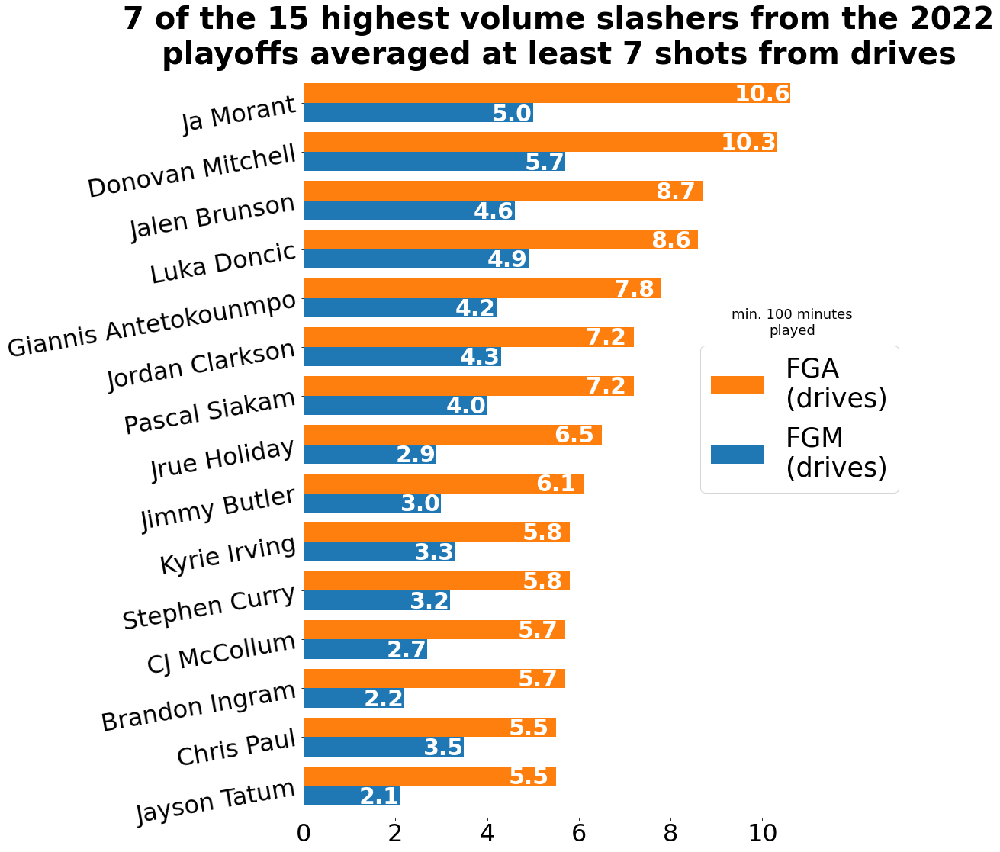

In [220]:
df1 = Drives22[(Drives22['FGA (Drives)']>=4) & (Drives22['MP']>=100)][['FGM (Drives)', 'FGA (Drives)']].sort_values('FGA (Drives)', ascending=False)
df1 = df1.head(15)

CreateBarH(df=df1, figsize=(12, 18), title = 
'''7 of the 15 highest volume slashers from the 2022
playoffs averaged at least 7 shots from drives''', titlefontsize=40, xticksize=32, ytickrotate=10, upperbarshiftup=.035,
           lowerbarshiftdown=.37, shiftlowerbarleft=.45,
           shiftupperbarleft=.6, yticksize=32, textbarfontsize=30, textbarcolor='white', legend_labels= 
['''FGM
(drives)''', '''FGA
(drives)'''], legend_order=[1,0], legend_pos=[.75,.65], legend_size=35, width=.8
             )
plt.text(10.65, 9.25, '''min. 100 minutes
played''', ha='center', fontsize=18)
#plt.savefig('bar highest volume slashers from 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

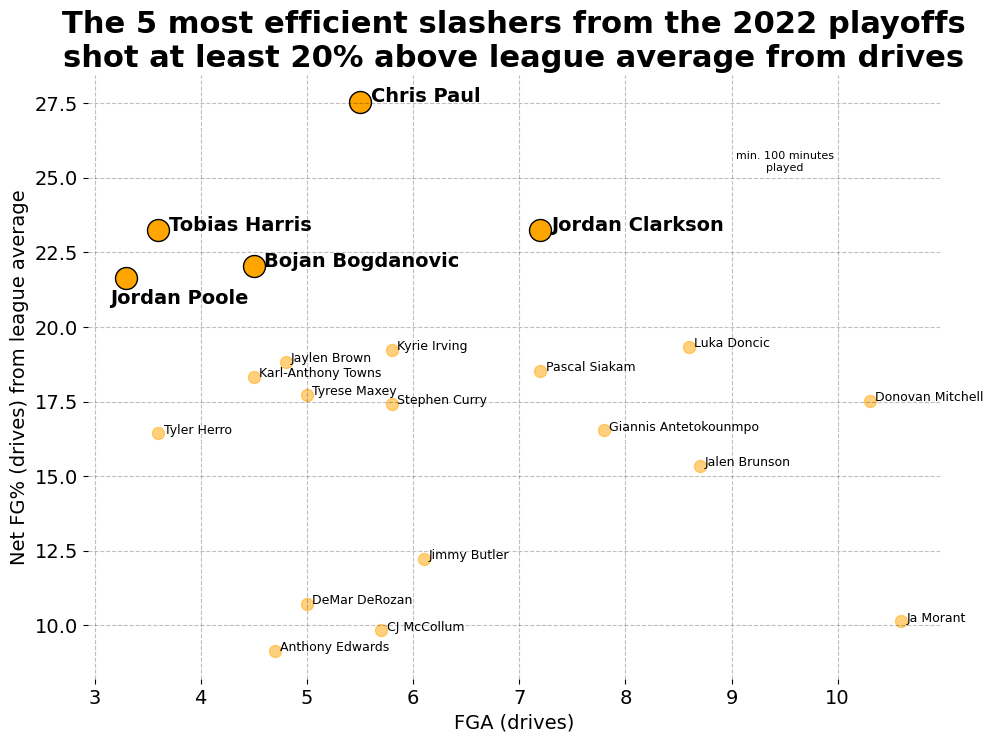

In [92]:
df1 = Drives22[(Drives22['Net FG% (Drives) from league average']>=9) & (Drives22['FGA (Drives)']>=3) & (Drives22['MP']>=100)][['FGA (Drives)', 'Net FG% (Drives) from league average']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,1] >= 20]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,1] >= 20]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,1] >= 20]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (drives)': x, 'Net EFG% (drives)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (drives)', xlabelsize=14, xticksize=14,
              ylabel='Net FG% (drives) from league average', ylabelsize=14, yticksize=14, title = 
'''The 5 most efficient slashers from the 2022 playoffs
shot at least 20% above league average from drives''', titlefontsize=22, marker='o', scattercolor='orange', 
              s2=250, df2=df2, x1=.05
        
             )

plt.text(9.5, 25.25, '''min. 100 minutes
played''', ha='center', fontsize=8)
plt.text(4.5+.1, 22.032718894009193, 'Bojan Bogdanovic', fontsize=14, weight='bold')
plt.text(5.5+.1, 27.532718894009193, 'Chris Paul', fontsize=14, weight='bold')
plt.text(7.2+.1, 23.232718894009196, 'Jordan Clarkson', fontsize=14, weight='bold')
plt.text(3.3-.15, 21.632718894009194-.85, 'Jordan Poole', fontsize=14, weight='bold')
plt.text(3.6+.1, 23.232718894009196, 'Tobias Harris', fontsize=14, weight='bold')

#plt.savefig('scat most efficient slashers 2022 playoffs.pdf', bbox_inches='tight')

plt.show()

In [223]:
Drives22[(Drives22['Net FG% (Drives) from league average']>=9) & (Drives22['FGA (Drives)']>=4) & (Drives22['MP']>=100)][['FGA (Drives)', 'Net FG% (Drives) from league average']].sort_values('Net FG% (Drives) from league average', ascending=False)

,FGA (Drives),Net FG% (Drives) from league average
PLAYER,,
Chris Paul,5.5,27.532719
Jordan Clarkson,7.2,23.232719
Bojan Bogdanovic,4.5,22.032719
Luka Doncic,8.6,19.332719
Kyrie Irving,5.8,19.232719
Jaylen Brown,4.8,18.832719
Pascal Siakam,7.2,18.532719
Karl-Anthony Towns,4.5,18.332719
Tyrese Maxey,5.0,17.732719


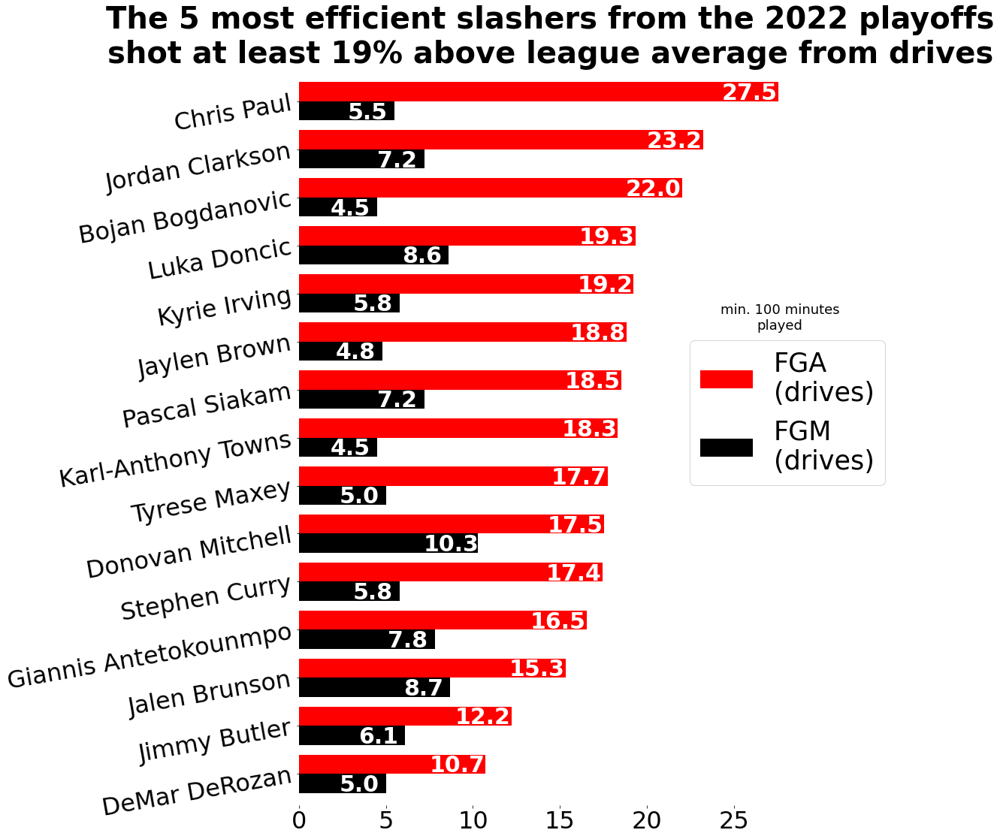

In [306]:
df1 = Drives22[(Drives22['Net FG% (Drives) from league average']>=9) & (Drives22['FGA (Drives)']>=4) & (Drives22['MP']>=100)][['FGA (Drives)', 'Net FG% (Drives) from league average']].sort_values('Net FG% (Drives) from league average', ascending=False)
df1 = df1.head(15)

CreateBarH(df=df1, figsize=(12, 18), title = 
'''The 5 most efficient slashers from the 2022 playoffs
shot at least 19% above league average from drives''', titlefontsize=40, xticksize=32, ytickrotate=10, 
           upperbarshiftup=.03,
           lowerbarshiftdown=.37, shiftlowerbarleft=1.55,
           shiftupperbarleft=1.65, yticksize=32, textbarfontsize=30, textbarcolor='white', legend_labels= 
['''FGM
(drives)''', '''FGA
(drives)'''], legend_order=[1,0], legend_pos=[.75,.65], legend_size=35, width=.8, color=['black', 'red']
             )
plt.text(27.65, 9.25, '''min. 100 minutes
played''', ha='center', fontsize=18)
#plt.savefig('bar most efficient slashers from 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

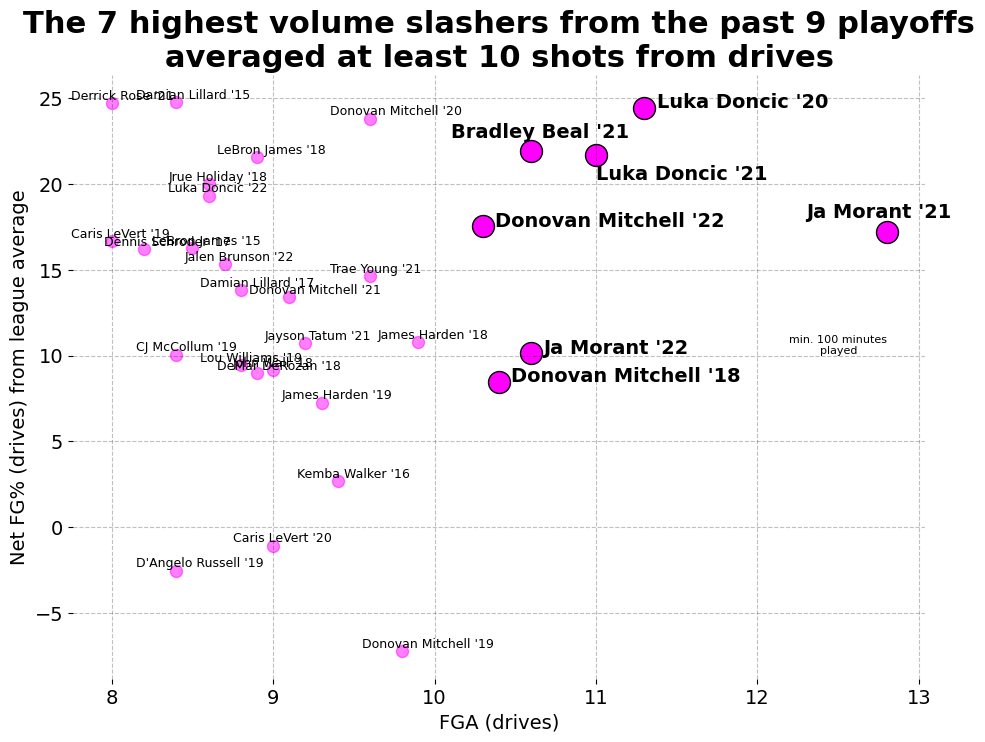

In [160]:
x = 2022
lst = []
for df in allDRIVES:
    variable = df[(df['MP']>=100) & (df['FGA (Drives)']>=8)][['FGA (Drives)', 'Net FG% (Drives) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_drives = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_drives)
df1 = new.sort_values('FGA (Drives)', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 10]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 10]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 10]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (drives)': x, 'Net EFG% (drives)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (drives)', xlabelsize=14, xticksize=14,
ylabel='Net FG% (drives) from league average', ylabelsize=14, yticksize=14, title = 
'''The 7 highest volume slashers from the past 9 playoffs
averaged at least 10 shots from drives''', titlefontsize=22, marker='o', scattercolor='fuchsia', df2=df2, s2=250, 
              x1=-.25, y1=.2
             )

plt.text(12.8-.5, 17.224267782426764+.8, "Ja Morant '21", fontsize=14, weight='bold')
plt.text(11.3+.075, 24.42027649769586, "Luka Doncic '20", fontsize=14, weight='bold')
plt.text(11.0, 21.724267782426764-1.5, "Luka Doncic '21", fontsize=14, weight='bold')
plt.text(10.6-.5, 21.924267782426767+.8, "Bradley Beal '21", fontsize=14, weight='bold')
plt.text(10.6+.075, 10.132718894009194, "Ja Morant '22", fontsize=14, weight='bold')
plt.text(10.4+.075, 8.477142857142852, "Donovan Mitchell '18", fontsize=14, weight='bold')
plt.text(10.3+.075, 17.532718894009193, "Donovan Mitchell '22", fontsize=14, weight='bold')
plt.text(12.5, 10.1, '''min. 100 minutes
played''', ha='center', fontsize=8)
#plt.savefig('scat highest volume slashers past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

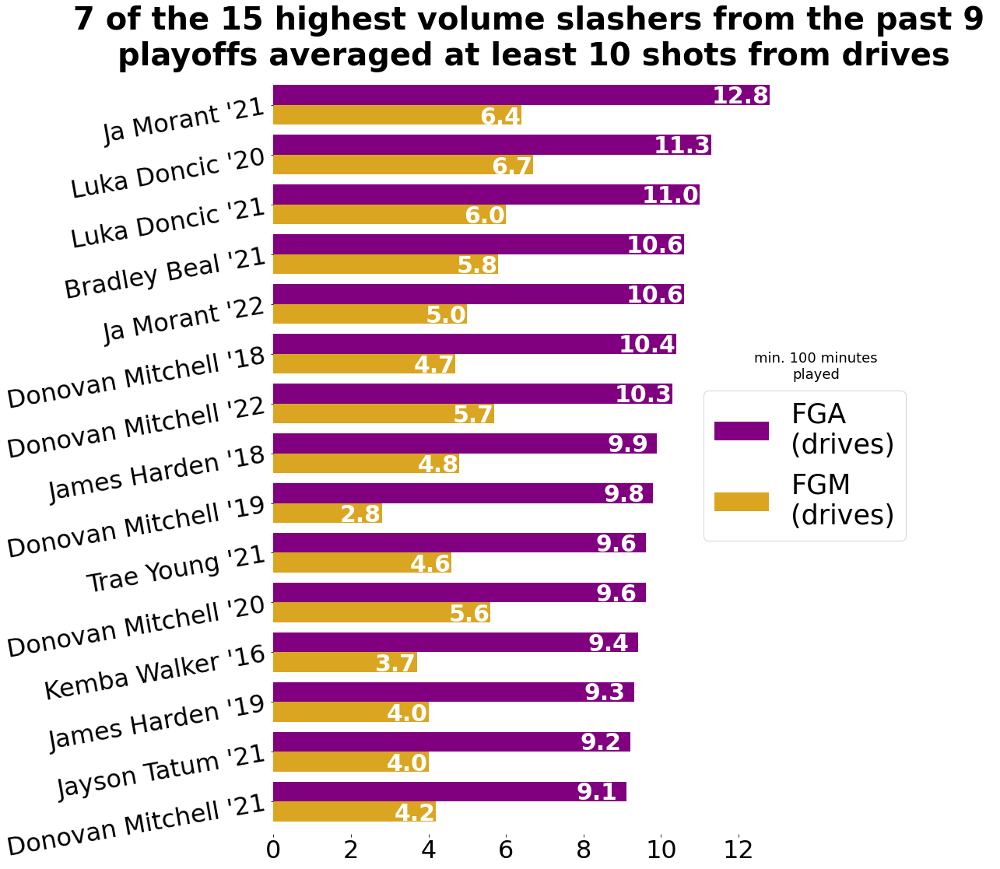

In [268]:
x = 2022
lst = []
for df in allDRIVES:
    variable = df[(df['MP']>=100) & (df['FGA (Drives)']>=8)][['FGM (Drives)', 'FGA (Drives)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_drives = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_drives)
df1 = new.sort_values('FGA (Drives)', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)
CreateBarH(df1, figsize=(12,18), title=
'''7 of the 15 highest volume slashers from the past 9 
playoffs averaged at least 10 shots from drives''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.385,
           shiftupperbarleft=.75, shiftlowerbarleft=.55 , textbarcolor='white', textbarfontsize=30, legend_labels= 
['''FGM
(drives)''', '''FGA
(drives)'''], legend_order=[1,0], legend_pos=[.8,.6], legend_size=35, color=['goldenrod', 'purple'], width=.8
          )
plt.text(14, 8.5, '''min. 100 minutes
played''', ha='center', fontsize=18)
#plt.savefig('bar highest volume slashers from past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

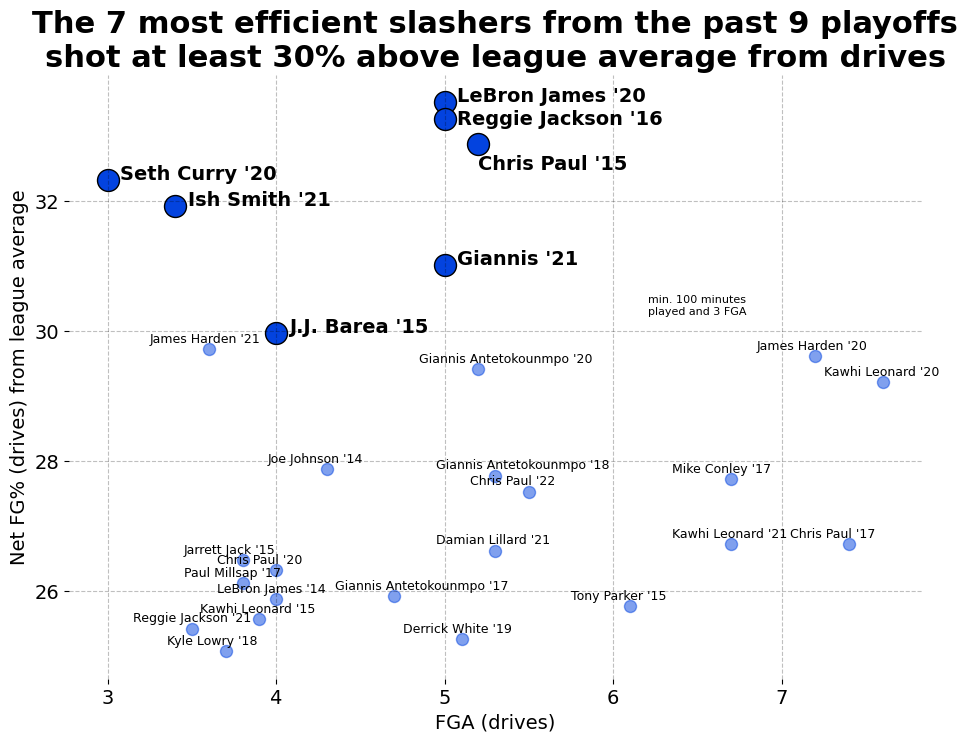

In [302]:
x = 2022
lst = []
for df in allDRIVES:
    variable = df[(df['Net FG% (Drives) from league average']>=25) & (df['MP']>=100) & (df['FGA (Drives)']>=3)][['FGA (Drives)', 'Net FG% (Drives) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_drives = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_drives)
df1 = new.sort_values('Net FG% (Drives) from league average', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,1] >= 29.9]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,1] >= 29.9]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,1] >= 29.9]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (drives)': x, 'Net EFG% (drives)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1=df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (drives)', xlabelsize=14, xticksize=14,
              ylabel='Net FG% (drives) from league average', ylabelsize=14, yticksize=14, title = 
'''The 7 most efficient slashers from the past 9 playoffs
shot at least 30% above league average from drives''', titlefontsize=22, marker='o', scattercolor='xkcd:blue', 
              df2=df2, s2=250, y1=.1, x1=-.35
             )


plt.text(5.0+.075, 33.52027649769587, "LeBron James '20", fontsize=14, weight='bold')
plt.text(5.0+.075, 33.26744186046511-.1, "Reggie Jackson '16", fontsize=14, weight='bold')
plt.text(5.2, 32.87596153846153-.4, "Chris Paul '15", fontsize=14, weight='bold')
plt.text(3.0+.075, 32.320276497695865, "Seth Curry '20", fontsize=14, weight='bold')
plt.text(3.4+.075, 31.924267782426767, "Ish Smith '21", fontsize=14, weight='bold')
plt.text(5.0+.075, 31.02426778242676, "Giannis '21", fontsize=14, weight='bold')
plt.text(6.5, 30.25, '''min. 100 minutes
played and 3 FGA''', ha='center', fontsize=8)
plt.text(4.0+.075, 29.975961538461533, "J.J. Barea '15", fontsize=14, weight='bold')
        
    
#plt.savefig('scat most efficient slashers past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

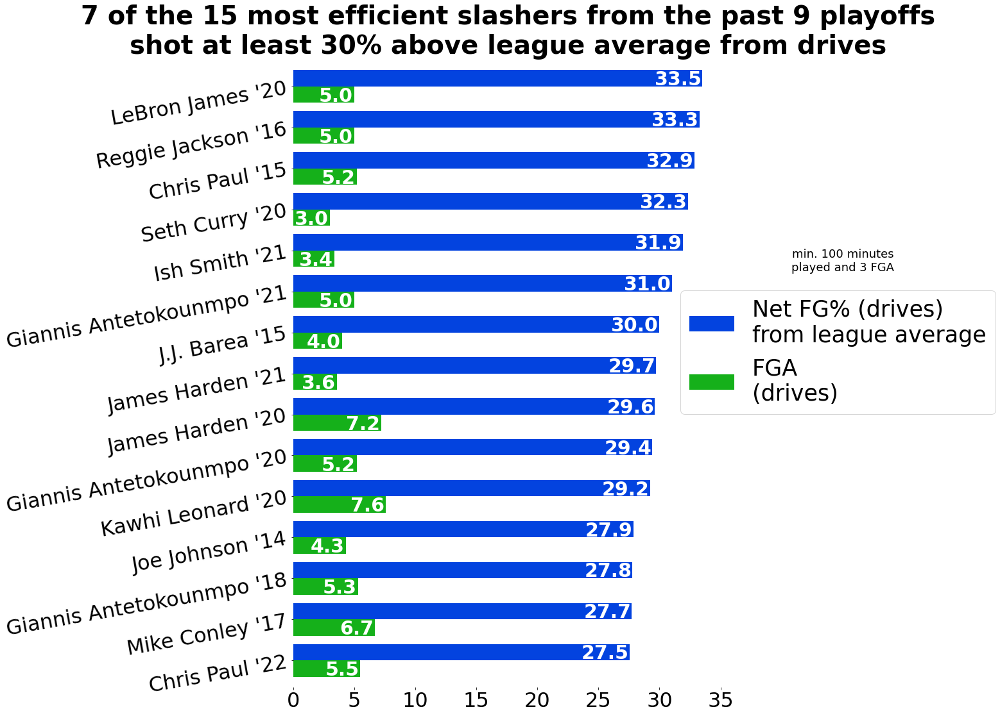

In [304]:
x = 2022
lst = []
for df in allDRIVES:
    variable = df[(df['Net FG% (Drives) from league average']>=25) & (df['MP']>=100) & (df['FGA (Drives)']>=3)][['FGA (Drives)', 'Net FG% (Drives) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_drives = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_drives)
df1 = new.sort_values('Net FG% (Drives) from league average', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)
CreateBarH(df1, figsize=(12,18), title=
'''7 of the 15 most efficient slashers from the past 9 playoffs
shot at least 30% above league average from drives''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.375,
           shiftupperbarleft=2, shiftlowerbarleft=1.5 , textbarcolor='white', textbarfontsize=30, legend_labels= 
['''FGA
(drives)''', '''Net FG% (drives)
from league average'''], legend_order=[1,0], legend_pos=[.875,.65], legend_size=35, color=['xkcd:green', 'xkcd:blue'], 
           width=.8
          )
plt.text(45, 9.5, '''min. 100 minutes
played and 3 FGA''', ha='center', fontsize=18)
#plt.savefig('bar most efficient slashers from past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

In [5]:
restricted22 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2021-22')
restricted21 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2020-21')
restricted20 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2019-20')
restricted19 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2018-19')
restricted18 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2017-18')
restricted17 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2016-17')
restricted16 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2015-16')
restricted15 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2014-15')
restricted14 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2013-14')
restricted13 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2012-13')
restricted12 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2011-12')
restricted11 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2010-11')
restricted10 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2009-10')
restricted09 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2008-09')
restricted08 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2007-08')
restricted07 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2006-07')
restricted06 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2005-06')
restricted05 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2004-05')
restricted04 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2003-04')
restricted03 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2002-03')
restricted02 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2001-02')
restricted01 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 2000-01')
restricted00 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 1999-00')
restricted99 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 1998-99')
restricted98 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Shooting 1997-98')

In [6]:
allRESTRICTED = [restricted22, restricted21, restricted20, restricted19, restricted18, restricted17, restricted16,
                restricted15, restricted14, restricted13, restricted12, restricted11, restricted10, restricted09,
                restricted08, restricted07, restricted06, restricted05, restricted04, restricted03, restricted02,
                restricted01, restricted00, restricted99, restricted98]

In [7]:
for df in allRESTRICTED:
    df['FG% (Restricted Area)'].replace('-', np.NAN, inplace=True)
    df.dropna(inplace=True)
    df.set_index('PLAYER', inplace=True)
    df['FG% (Restricted Area)'].astype(float)
    df['MP'] = df['GP'] * df['MIN']
    df['Net FG% (restricted area) from league average'] = df['FG% (Restricted Area)'] - df['FG% (Restricted Area)'].mean()

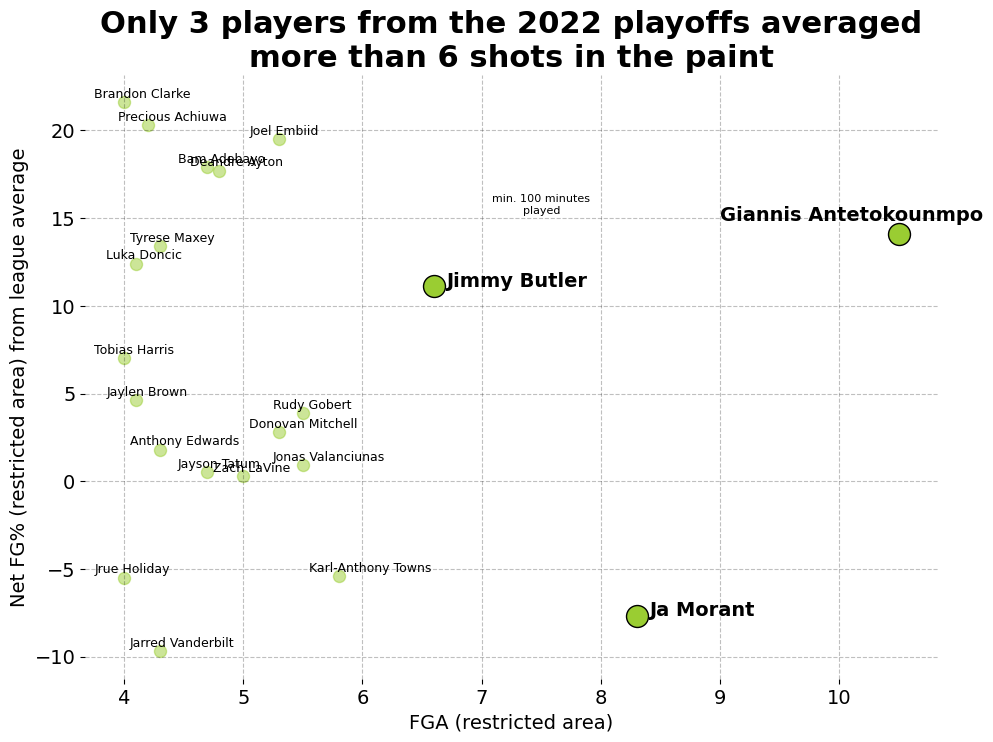

In [44]:
df1 = restricted22[(restricted22['FGA (Restricted Area)']>=4) 
                   & (restricted22['MP']>=100)][['FGA (Restricted Area)', 'Net FG% (restricted area) from league average']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 6]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 6]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 6]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (restricted area)': x, 'Net EFG% (restricted area)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (restricted area)', 
              ylabel='Net FG% (restricted area) from league average', ylabelsize=14, yticksize=14, title=
'''Only 3 players from the 2022 playoffs averaged
more than 6 shots in the paint''', titlefontsize=22, marker='o', 
              scattercolor='yellowgreen', xlabelsize=14, xticksize=14, df2=df2, s2=250, x1=-.25,y1=.25
             )


plt.text(10.5-1.5, 14.109677419354846+.75, 'Giannis Antetokounmpo', fontsize=14, weight='bold')
plt.text(8.3+.1, -7.690322580645152, 'Ja Morant', fontsize=14, weight='bold')
plt.text(6.6+.1, 11.109677419354846, 'Jimmy Butler', fontsize=14, weight='bold')

plt.text(7.5, 15.25, '''min. 100 minutes
played''', fontsize=8, ha='center')

#plt.savefig('scat highest volume inside scorers from the 2022 playoffs.pdf', bbox_inches = 'tight')
plt.show()

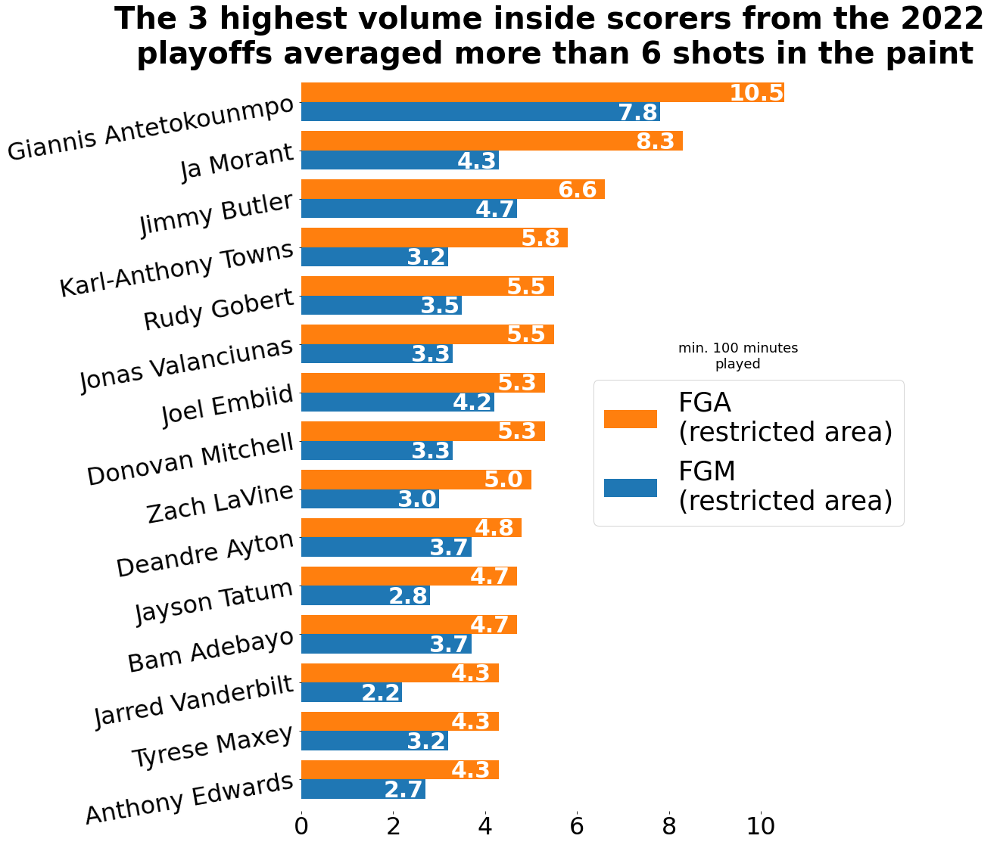

In [202]:
df1 = restricted22[(restricted22['FGA (Restricted Area)']>=4) 
& (restricted22['MP']>=100)][['FGM (Restricted Area)', 'FGA (Restricted Area)']].sort_values('FGA (Restricted Area)', ascending=False)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title= 
'''The 3 highest volume inside scorers from the 2022 
playoffs averaged more than 6 shots in the paint''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.035, lowerbarshiftdown=.37,
           shiftlowerbarleft=.475, shiftupperbarleft=.6, textbarfontsize=30, textbarcolor='white', legend_labels= 
['''FGM
(restricted area)''', '''FGA
(restricted area)'''], legend_order=[1,0], legend_pos=[.55, .6], legend_size=35, width=.8
          
          )
plt.text(9.5, 8.5, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar highest volume inside scorers from the 2022 playoffs.pdf', bbox_inches = 'tight')
plt.show()

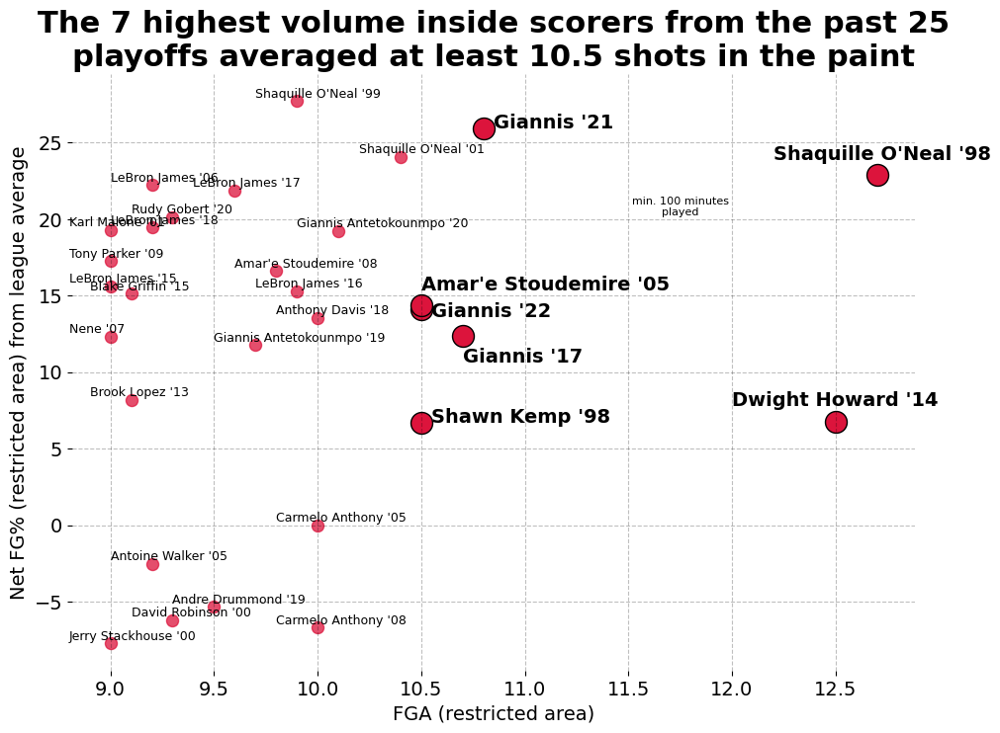

In [138]:
x = 2022
lst = []
for df in allRESTRICTED:
    variable = df[(df['MP']>=100) & (df['FGA (Restricted Area)']>=9)][['FGA (Restricted Area)', 'Net FG% (restricted area) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_restricted = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_restricted)
df1 = new.sort_values('FGA (Restricted Area)', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 10.5]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 10.5]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 10.5]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (restricted area)': x, 'Net EFG% (restricted area)':y
})
df2.set_index('PLAYER', inplace=True)
CreateScatter(df1, s1=75, alpha1=.75, figsize=(11,8), dpi=100, xlabel='FGA (restricted area)', xlabelsize=14,
              xticksize=14, ylabel='Net FG% (restricted area) from league average', ylabelsize=14, yticksize=14,
              title = 
'''The 7 highest volume inside scorers from the past 25
playoffs averaged at least 10.5 shots in the paint''', titlefontsize=22, marker='o', scattercolor='crimson', 
              df2=df2, s2=250, x1=-.2, y1=.25
             )

plt.text(12.7-.5, 22.906315789473673+1, "Shaquille O'Neal '98", fontsize=14, weight='bold')
plt.text(12.5-.5, 6.768316831683137+1, "Dwight Howard '14", fontsize=14, weight='bold')
plt.text(10.8+.05, 25.921008403361327, "Giannis '21", fontsize=14, weight='bold')
plt.text(10.7, 12.358139534883726-1.75, "Giannis '17", fontsize=14, weight='bold')
plt.text(10.5, 14.362765957446804+1, "Amar'e Stoudemire '05", fontsize=14, weight='bold')
plt.text(10.5+.05, 14.109677419354846-.5, "Giannis '22", fontsize=14, weight='bold')
plt.text(10.5+.05, 6.706315789473678, "Shawn Kemp '98", fontsize=14, weight='bold')
plt.text(11.75, 20.25, '''min. 100 minutes
played''', ha='center', fontsize=8)

#plt.savefig('scat highest volume inside scorers past 25 playoffs.pdf', bbox_inches='tight')
plt.show()

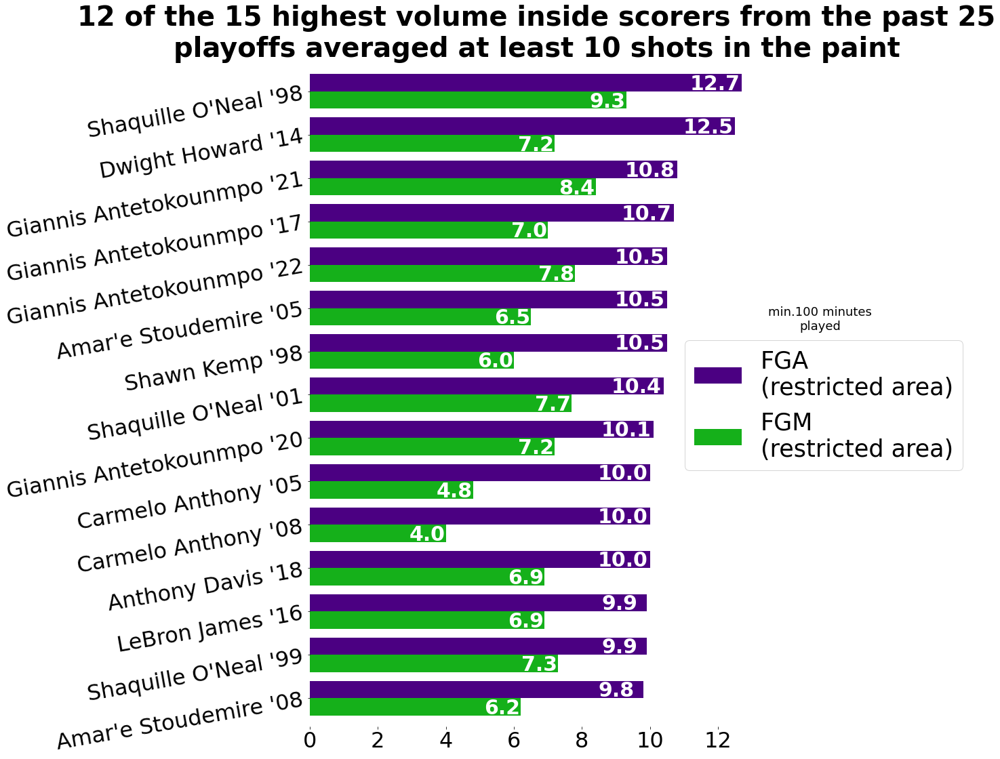

In [222]:
x = 2022
lst = []
for df in allRESTRICTED:
    variable = df[(df['MP']>=100) & (df['FGA (Restricted Area)']>=9)][['FGM (Restricted Area)', 'FGA (Restricted Area)']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_restricted = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_restricted)
df1 = new.sort_values('FGA (Restricted Area)', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title=
'''12 of the 15 highest volume inside scorers from the past 25
playoffs averaged at least 10 shots in the paint''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.035, lowerbarshiftdown=.37, shiftlowerbarleft=.55, 
           shiftupperbarleft=.8, textbarfontsize=30,
           textbarcolor='white', legend_labels=
['''FGM
(restricted area)''', '''FGA
(restricted area)'''], legend_order=[1,0], legend_pos=[.8, .6], legend_size=35, width=.8, color=['xkcd:green',
                                                                                                 'indigo']
           
          )
plt.text(15, 8.5, '''min.100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar highest volume inside scorers past 25 playoffs.pdf', bbox_inches='tight')
plt.show()

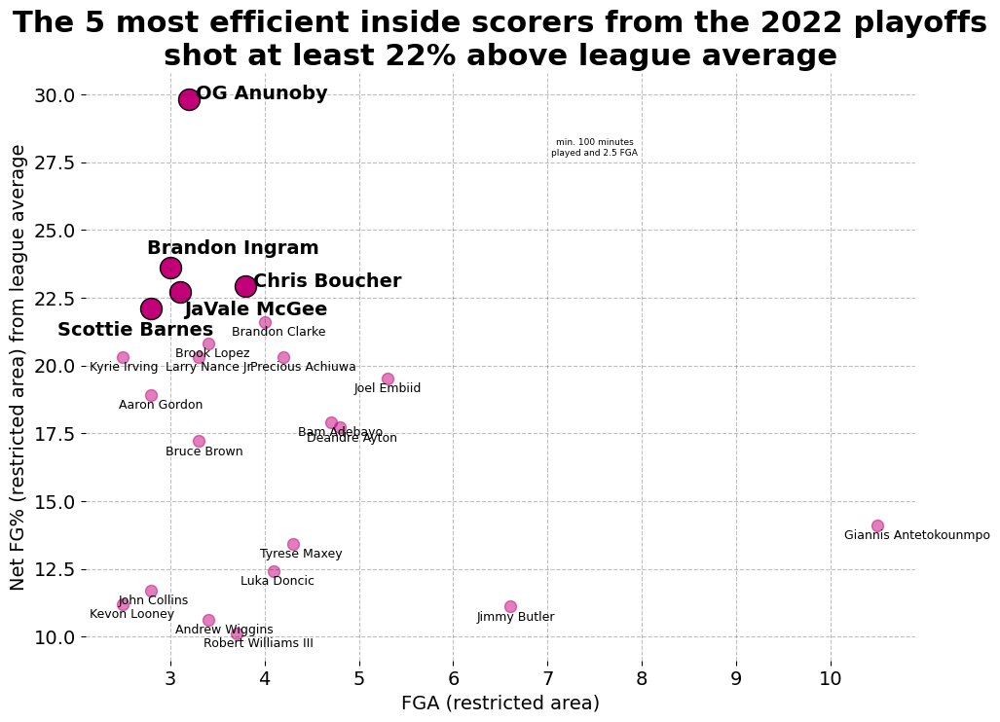

In [136]:
df1 = restricted22[(restricted22['Net FG% (restricted area) from league average']>=10) 
                   & (restricted22['FGA (Restricted Area)']>=2.5) 
                   & (restricted22['MP']>=100)][['FGA (Restricted Area)', 'Net FG% (restricted area) from league average']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,1] >= 22]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,1] >= 22]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,1] >= 22]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (restricted area)': x, 'Net EFG% (restricted area)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (restricted area)', xlabelsize=14,
              xticksize=14, ylabel='Net FG% (restricted area) from league average', yticksize=14, title = 
'''The 5 most efficient inside scorers from the 2022 playoffs
shot at least 22% above league average''', titlefontsize=22, scattercolor='xkcd:magenta', 
              ylabelsize=14, marker='o',y1=-.5, x1=-.35, df2=df2, s2=250
             )

plt.text(3.0-.25, 23.609677419354846+.5, 'Brandon Ingram', fontsize=14, weight='bold')
plt.text(3.8+.075, 22.909677419354843, 'Chris Boucher', fontsize=14, weight='bold')
plt.text(3.1+.05, 22.709677419354854-.85, 'JaVale McGee', fontsize=14, weight='bold')
plt.text(3.2+.075, 29.80967741935485, 'OG Anunoby', fontsize=14, weight='bold')
plt.text(2.8-1, 22.109677419354846-1, 'Scottie Barnes', fontsize=14, weight='bold')

plt.text(7.5, 27.75, '''min. 100 minutes
played and 2.5 FGA''', fontsize=6.5, ha='center')

#plt.savefig('scat most efficient inside scorers from the 2022 playoffs.pdf', bbox_inches = 'tight')
#plt.show()

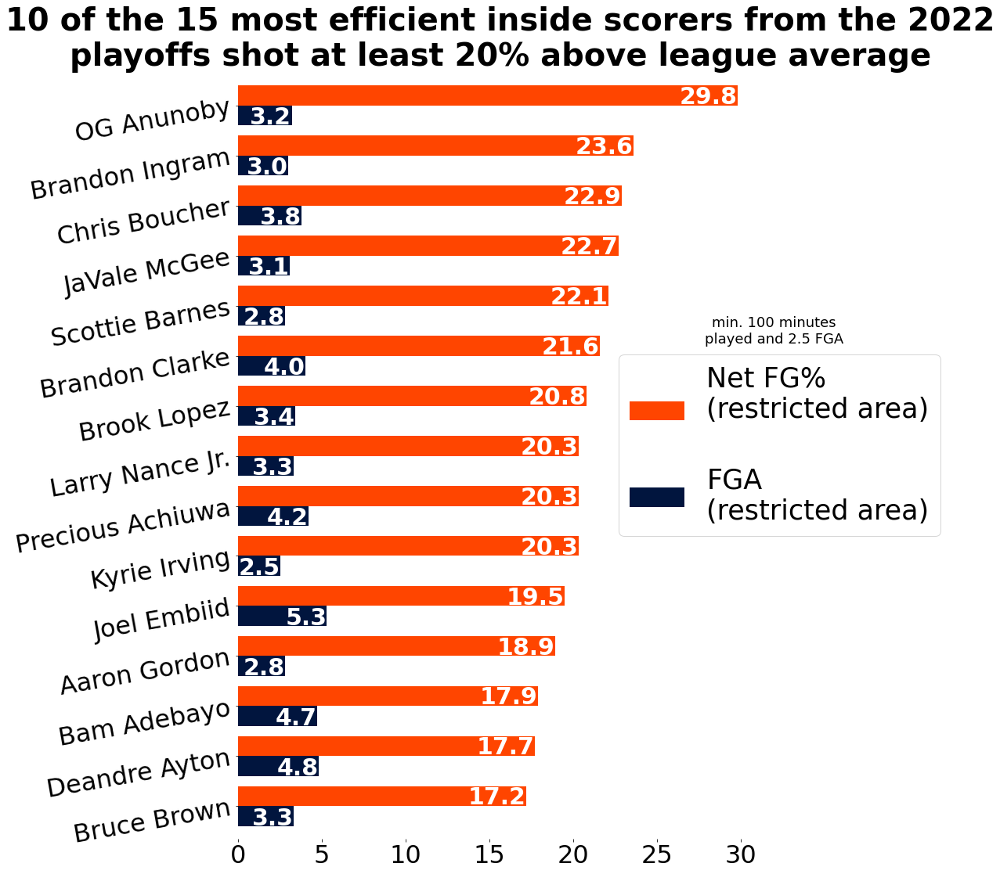

In [265]:
df1 = restricted22[(restricted22['Net FG% (restricted area) from league average']>=10) 
                   & (restricted22['FGA (Restricted Area)']>=2.5) 
                   & (restricted22['MP']>=100)][['FGA (Restricted Area)', 'Net FG% (restricted area) from league average']].sort_values('Net FG% (restricted area) from league average', ascending=False)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title = 
'''10 of the 15 most efficient inside scorers from the 2022
playoffs shot at least 20% above league average''', titlefontsize=40, xticksize=32, yticksize=32, 
           ytickrotate=10, upperbarshiftup=.03,
           lowerbarshiftdown=.38, shiftupperbarleft=1.75, shiftlowerbarleft=1.25, textbarfontsize=30, textbarcolor='white',
           legend_labels= 
['''FGA
(restricted area)''', '''Net FG%
(restricted area)
'''], legend_order=[1,0], legend_size=35, legend_pos=[.7,.65], width=.8, color=['xkcd:navy', 'orangered']
          )
plt.text(32, 9.25, '''min. 100 minutes
played and 2.5 FGA''', ha='center', fontsize=18)

#plt.savefig('bar most efficient inside scorers from the 2022 playoffs.pdf', bbox_inches = 'tight')
plt.show()

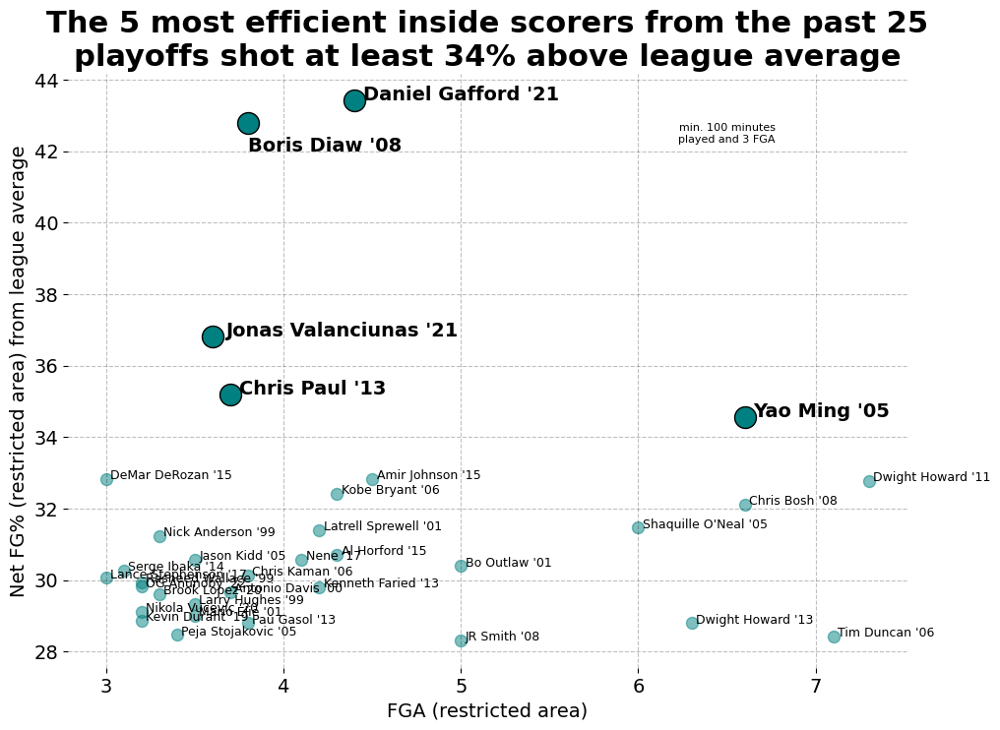

In [264]:
x = 2022
lst = []
for df in allRESTRICTED:
    variable = df[(df['MP']>=100) & (df['Net FG% (restricted area) from league average']>=28)&
                  (df['FGA (Restricted Area)']>=3)][['FGA (Restricted Area)', 'Net FG% (restricted area) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_restricted = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_restricted)
df1 = new.sort_values('Net FG% (restricted area) from league average', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,1] >= 34]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,1] >= 34]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,1] >= 34]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'FGA (restricted area)': x, 'Net EFG% (restricted area)':y
})
df2.set_index('PLAYER', inplace=True)
CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='FGA (restricted area)', xlabelsize=14,
              xticksize=14, ylabel='Net FG% (restricted area) from league average', ylabelsize=14, yticksize=14,
              title = 
'''The 5 most efficient inside scorers from the past 25
playoffs shot at least 34% above league average''', titlefontsize=22, marker='o', scattercolor='teal', df2=df2,
              s2=250, x1=.025
             )
plt.text(4.4+.05, 43.42100840336133, "Daniel Gafford '21", fontsize=14, weight='bold')
plt.text(3.8, 42.79950495049504-.8, "Boris Diaw '08", fontsize=14, weight='bold')
plt.text(3.6+.075, 36.82100840336133, "Jonas Valanciunas '21", fontsize=14, weight='bold')
plt.text(3.7+.05, 35.18995215311006, "Chris Paul '13", fontsize=14, weight='bold')
plt.text(6.6+.05, 34.5627659574468, "Yao Ming '05", fontsize=14, weight='bold')
plt.text(6.5, 42.25, '''min. 100 minutes
played and 3 FGA''', ha='center', fontsize=8)

#plt.savefig('scat most efficient inside scorers from the past 25 playoffs.pdf', bbox_inches='tight')
plt.show()

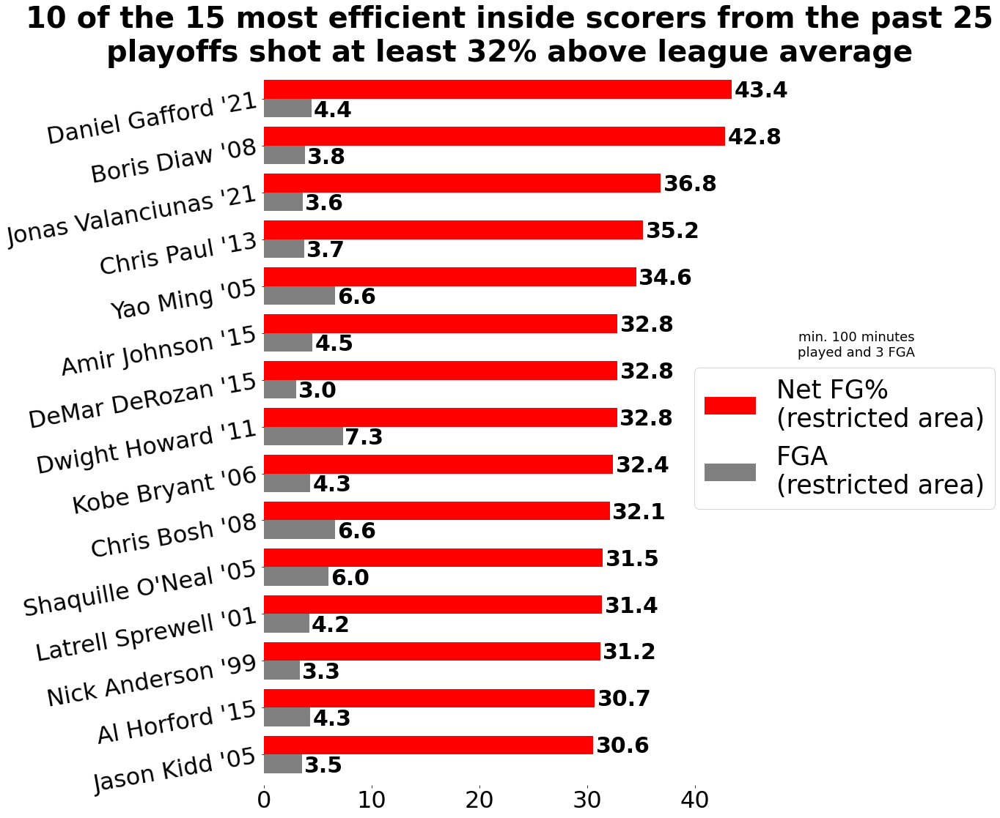

In [263]:
x = 2022
lst = []
for df in allRESTRICTED:
    variable = df[(df['MP']>=100) & (df['Net FG% (restricted area) from league average']>=28)&
                  (df['FGA (Restricted Area)']>=3)][['FGA (Restricted Area)', 'Net FG% (restricted area) from league average']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_restricted = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_restricted)
df1 = new.sort_values('Net FG% (restricted area) from league average', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title = 
'''10 of the 15 most efficient inside scorers from the past 25
playoffs shot at least 32% above league average''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.385,
           shiftlowerbarleft=-2 ,shiftupperbarleft=-2.75, textbarfontsize=30, textbarcolor='black', legend_labels= 
['''FGA
(restricted area)''', '''Net FG%
(restricted area)'''], legend_order=[1,0], legend_pos=[.85, .6], legend_size=35, width=.8, color=['grey','red']
          )

plt.text(55, 8.5, '''min. 100 minutes
played and 3 FGA''', fontsize=18, ha='center')
#plt.savefig('bar most efficient inside scorers from the past 25 playoffs.pdf', bbox_inches='tight')
plt.show()

In [5]:
# call defense data
Defense22 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DEFENSE 2021-22')
Defense22.set_index('PLAYER', inplace=True)
Defense21 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DEFENSE 2020-21')
Defense21.set_index('PLAYER', inplace=True)
Defense20 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DEFENSE 2019-20')
Defense20.set_index('PLAYER', inplace=True)
Defense19 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DEFENSE 2018-19')
Defense19.set_index('PLAYER', inplace=True)
Defense18 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DEFENSE 2017-18')
Defense18.set_index('PLAYER', inplace=True)
Defense17 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DEFENSE 2016-17')
Defense17.set_index('PLAYER', inplace=True)
Defense16 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DEFENSE 2015-16')
Defense16.set_index('PLAYER', inplace=True)
Defense15 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DEFENSE 2014-15')
Defense15.set_index('PLAYER', inplace=True)
Defense14 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='DEFENSE 2013-14')
Defense14.set_index('PLAYER', inplace=True)

In [6]:
allDEFENSE = [Defense22, Defense21, Defense20, Defense19, Defense18, Defense17, Defense16,
                Defense15, Defense14]

In [7]:
for df in allDEFENSE:
    df['DFGA'].replace('-', np.NAN, inplace=True)
    df.dropna(inplace=True)
    df['DFGA'].astype(float)
    df['MP'] = df['GP'] * df['MIN']

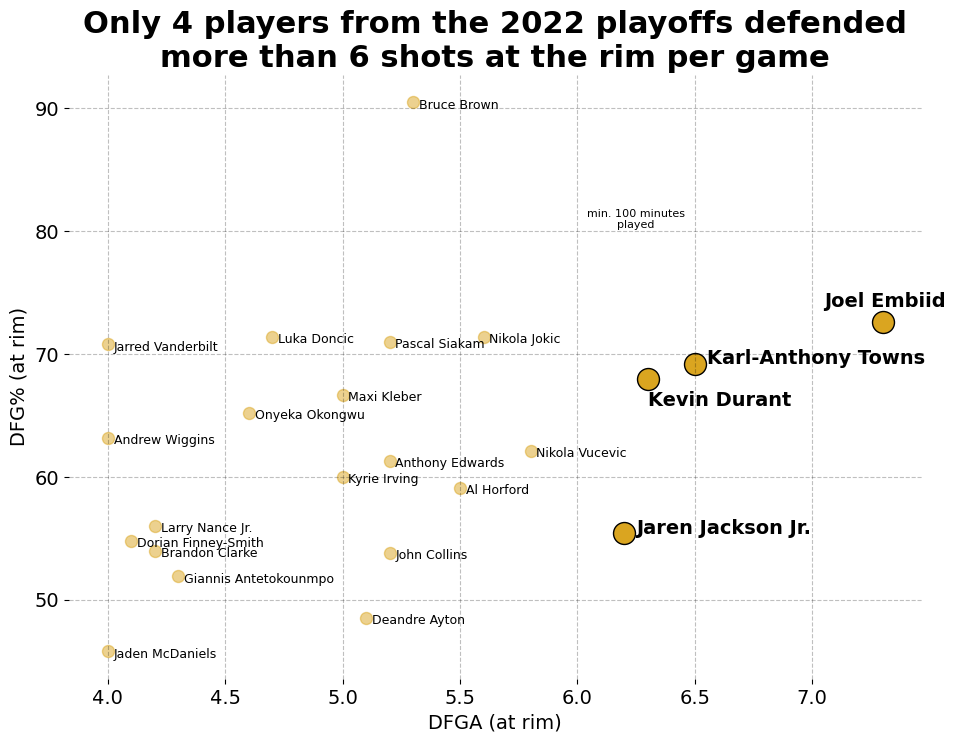

In [307]:
df1 = Defense22[(Defense22['DFGA']>=4) & (Defense22['MP']>=100)][['DFGA', 'DFG%']]

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 6]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 6]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 6]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'DFGA (at rim)': x, 'DFG% (at rim)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='DFGA (at rim)', ylabel='DFG% (at rim)',
              ylabelsize=14, yticksize=14, title = 
'''Only 4 players from the 2022 playoffs defended
more than 6 shots at the rim per game''', titlefontsize=22, marker='o', scattercolor='goldenrod', 
              xlabelsize=14, xticksize=14, x1=.025, df2=df2, s2=250, y1=-.5
             )

plt.text(6.2+.05, 55.4, 'Jaren Jackson Jr.', fontsize=14, weight='bold')
plt.text(7.3-.25, 72.6+1.25, 'Joel Embiid', fontsize=14, weight='bold')
plt.text(6.5+.05, 69.2, 'Karl-Anthony Towns', fontsize=14, weight='bold')
plt.text(6.3, 68.0-2.25, 'Kevin Durant', fontsize=14, weight='bold')
plt.text(6.25, 80.25, '''min. 100 minutes
played''', ha='center', fontsize=8)

#plt.savefig('scat highest volume rim protectors 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

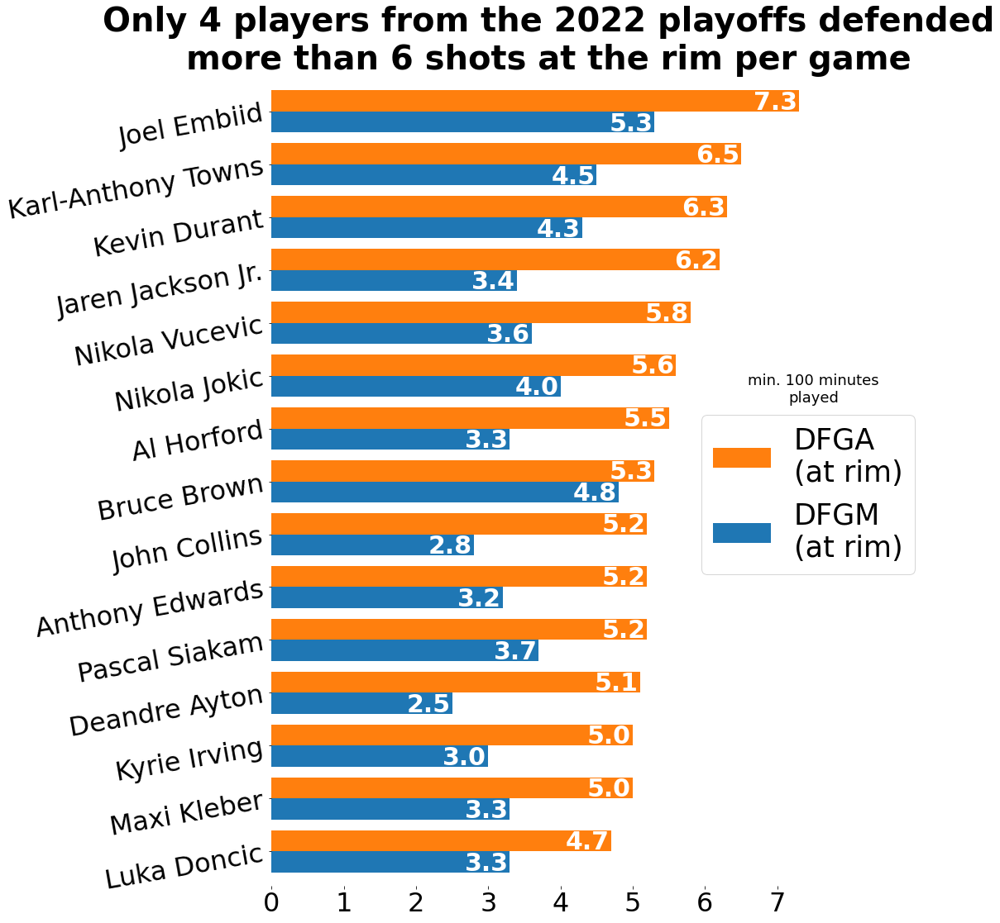

In [30]:
df1 = Defense22[(Defense22['DFGA']>=4) & (Defense22['MP']>=100)][['DFGM', 'DFGA']].sort_values('DFGA', ascending=False)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title = 
'''Only 4 players from the 2022 playoffs defended
more than 6 shots at the rim per game''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.035, lowerbarshiftdown=.37, shiftupperbarleft=.325, shiftlowerbarleft=.325, textbarcolor='white',
           textbarfontsize=30, legend_labels= 
['''DFGM
(at rim)''', '''DFGA
(at rim)'''], legend_order=[1,0], legend_pos=[.75, .6], legend_size=35, width=.8
          
          )
plt.text(7.5, 8.5, '''min. 100 minutes
played''', fontsize=18, ha='center')

#plt.savefig('bar highest volume rim protectors 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

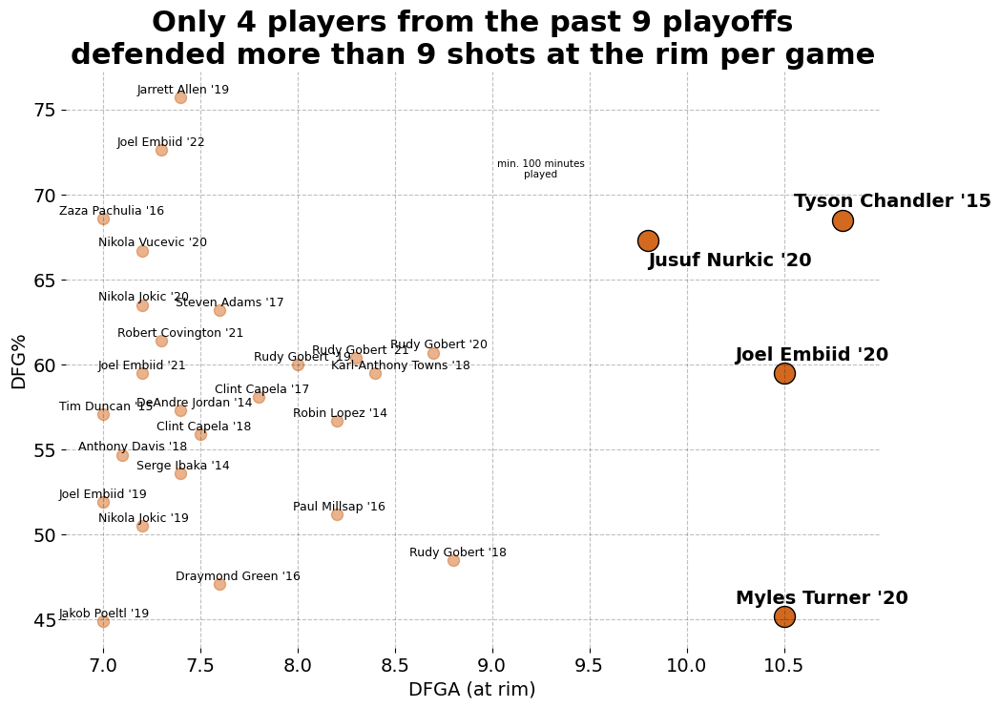

In [336]:
x = 2022
lst = []
for df in allDEFENSE:
    variable = df[(df['MP']>=100) & (df['DFGA']>=7)][['DFGA', 'DFG%']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_defense = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defense)
df1 = new.sort_values('DFGA', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 9.5]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 9.5]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 9.5]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'DFGA': x, 'DFG%':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='DFGA (at rim)', xlabelsize=14, xticksize=14,
              ylabel='DFG%', ylabelsize=14, yticksize=14, title = 
'''Only 4 players from the past 9 playoffs
defended more than 9 shots at the rim per game''', titlefontsize=22, marker='o', scattercolor='chocolate',
              x1=-.225, y1=.25, df2=df2, s2=250
             )

plt.text(10.8-.25, 68.5+.75, "Tyson Chandler '15", fontsize=14, weight='bold')
plt.text(10.5-.25, 59.5+.75, "Joel Embiid '20", fontsize=14, weight='bold')
plt.text(10.5-.25, 45.2+.75, "Myles Turner '20", fontsize=14, weight='bold')
plt.text(9.8, 67.3-1.5, "Jusuf Nurkic '20", fontsize=14, weight='bold')
plt.text(9.25, 71, '''min. 100 minutes
played''', ha='center', fontsize=7.5)

#plt.savefig('scat highest volume rim protectors past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

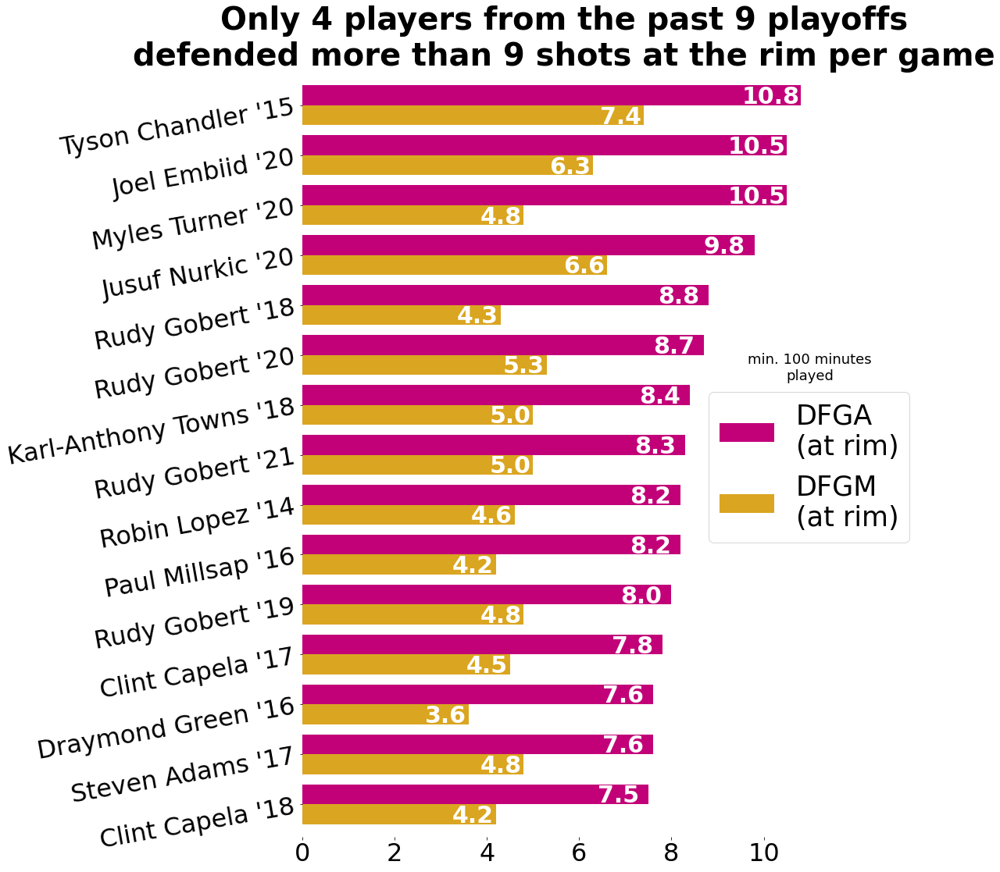

In [43]:
x = 2022
lst = []
for df in allDEFENSE:
    variable = df[(df['MP']>=100) & (df['DFGA']>=7)][['DFGM', 'DFGA']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_defense = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defense)
df1 = new.sort_values('DFGA', ascending=False)
df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title= 
'''Only 4 players from the past 9 playoffs
defended more than 9 shots at the rim per game''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.37, shiftupperbarleft=.65, shiftlowerbarleft=.5, textbarfontsize=30,
           textbarcolor='white', legend_labels= 
['''DFGM
(at rim)''', '''DFGA
(at rim)'''], legend_order=[1,0], legend_pos=[.75,.6], legend_size=35, width=.8, color=['goldenrod', 'xkcd:magenta']
           
          )

plt.text(11, 8.5, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('bar highest volume rim protectors past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

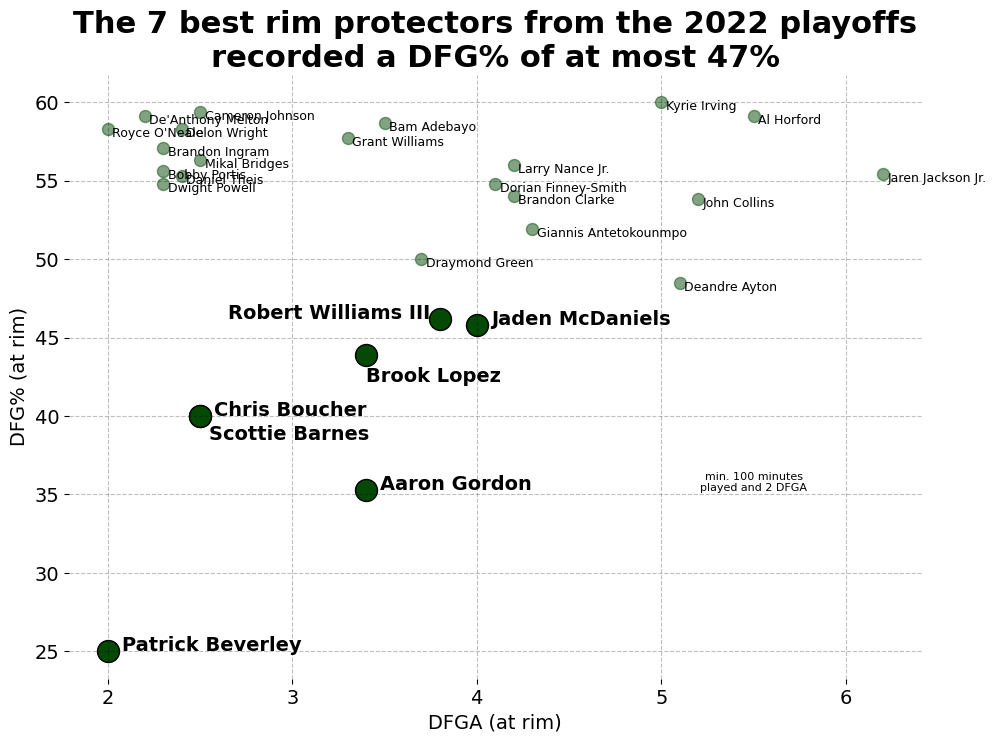

In [418]:
df = Defense22[(Defense22['DFG%'] <=60) & (Defense22['DFGA']>=2) & (Defense22['MP']>=100)][['DFGA', 'DFG%']]
df1 = df.sort_values('DFG%', ascending=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,1] <= 47]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,1] <= 47]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,1] <= 47]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'DFGA (at rim)': x, 'DFG% (at rim)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='DFGA (at rim)', ylabel='DFG% (at rim)',
              ylabelsize=14, yticksize=14, title = 
'''The 7 best rim protectors from the 2022 playoffs
recorded a DFG% of at most 47%''', titlefontsize=22, marker='o', scattercolor='xkcd:darkgreen', 
              xlabelsize=14, xticksize=14, x1=.025, y1=-.5, df2=df2, s2=250
             )
plt.text(2.0+.075, 25.0, 'Patrick Beverley', fontsize=14, weight='bold')
plt.text(3.4+.075, 35.3, 'Aaron Gordon', fontsize=14, weight='bold')
plt.text(2.5+.075, 40.0, 'Chris Boucher', fontsize=14, weight='bold')
plt.text(2.5+.05, 40.0-1.5, 'Scottie Barnes', fontsize=14, weight='bold')
plt.text(3.4, 43.9-1.75, 'Brook Lopez', fontsize=14, weight='bold')
plt.text(4.0+.075, 45.8, 'Jaden McDaniels', fontsize=14, weight='bold')
plt.text(3.8-1.15, 46.2, 'Robert Williams III', fontsize=14, weight='bold')
plt.text(5.5, 35.2, '''min. 100 minutes
played and 2 DFGA''', ha='center', fontsize=8)

#plt.savefig('scat best rim protectors 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

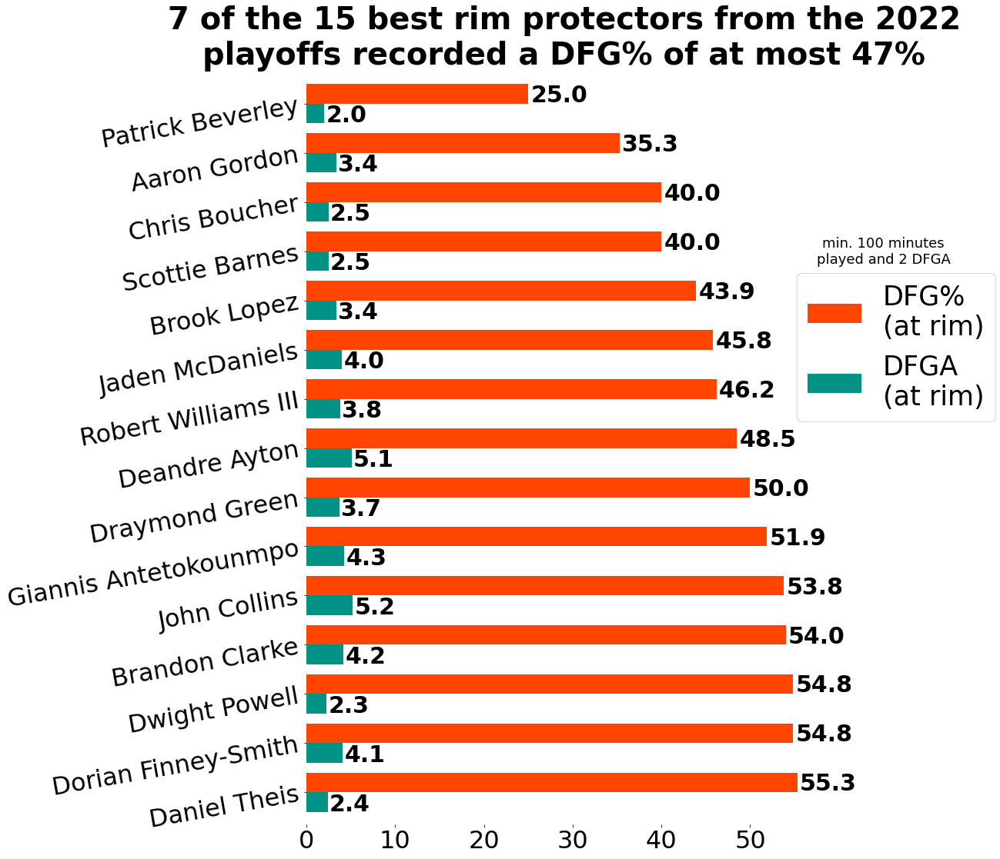

In [82]:
df = Defense22[(Defense22['DFG%'] <=60) & (Defense22['DFGA']>=2) & (Defense22['MP']>=100)][['DFGA', 'DFG%']]
df1 = df.sort_values('DFG%', ascending=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title=
'''7 of the 15 best rim protectors from the 2022
playoffs recorded a DFG% of at most 47%''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.38, shiftupperbarleft=-3.5, shiftlowerbarleft=-2.5, textbarfontsize=30,
           textbarcolor='black', legend_labels= 
['''DFGA
(at rim)''', '''DFG%
(at rim)'''], legend_order=[1,0], legend_pos=[.925,.75], legend_size=35, width=.8, color=['xkcd:teal', 'orangered']
          
          )
plt.text(65, 10.75, '''min. 100 minutes
played and 2 DFGA''', ha='center', fontsize=18)

#plt.savefig('bar best rim protectors 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

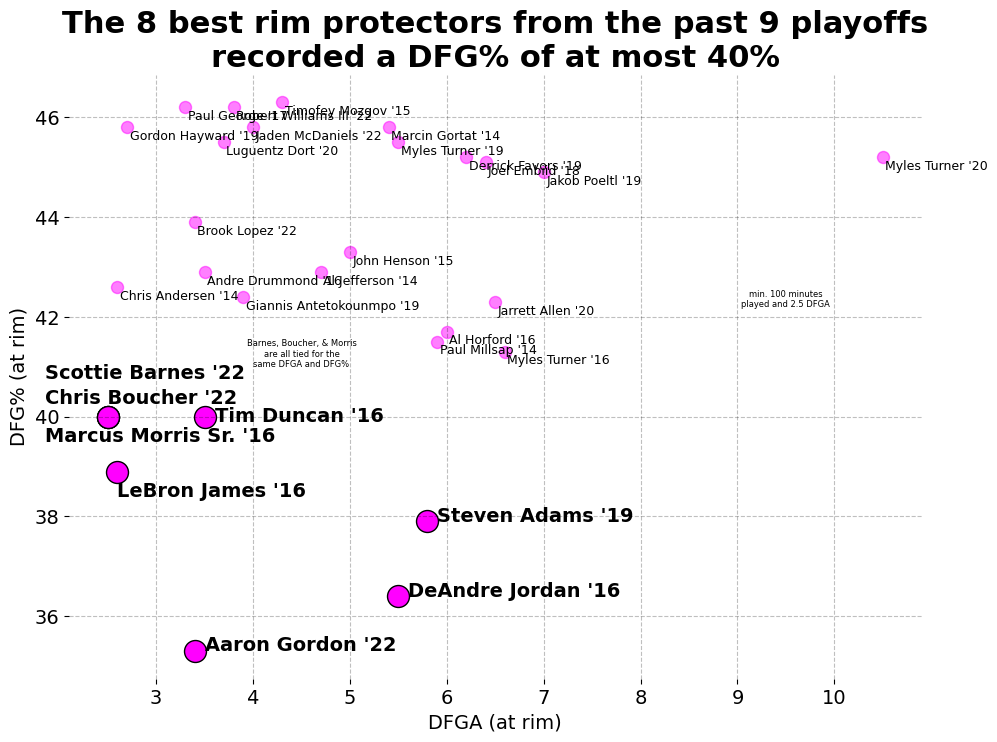

In [448]:
x = 2022
lst = []
for df in allDEFENSE:
    variable = df[(df['DFG%']<=47) & (df['MP']>=100) & (df['DFGA']>=2.5)][['DFGA', 'DFG%']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_defense = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defense)
df1 = new.sort_values('DFG%', ascending=True)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,1] <= 40]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,1] <= 40]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,1] <= 40]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'DFGA (at rim)': x, 'DFG% (at rim)':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='DFGA (at rim)', ylabel='DFG% (at rim)',
              ylabelsize=14, yticksize=14, title = 
'''The 8 best rim protectors from the past 9 playoffs
recorded a DFG% of at most 40%''', titlefontsize=22, marker='o', scattercolor='fuchsia', 
              xlabelsize=14, xticksize=14, x1=.025, y1=-.25, df2=df2, s2=250
             )

plt.text(9.5, 42.2, '''min. 100 minutes
played and 2.5 DFGA''', ha='center', fontsize=6)

plt.text(4.5, 41, '''Barnes, Boucher, & Morris
are all tied for the
same DFGA and DFG%''', ha='center', fontsize=6)

plt.text(3.4+.1, 35.3, "Aaron Gordon '22", fontsize=14, weight='bold')
plt.text(5.5+.1, 36.4, "DeAndre Jordan '16", fontsize=14, weight='bold')
plt.text(5.8+.1, 37.9, "Steven Adams '19", fontsize=14, weight='bold')
plt.text(2.6, 38.9-.5, "LeBron James '16", fontsize=14, weight='bold')
plt.text(3.5+.11, 40.0-.1, "Tim Duncan '16", fontsize=14, weight='bold')
plt.text(2.5-.65, 40.0-.5, "Marcus Morris Sr. '16", fontsize=14, weight='bold')
plt.text(2.5-.65, 40.0+.75, "Scottie Barnes '22", fontsize=14, weight='bold')
plt.text(2.5-.65, 40.0+.25, "Chris Boucher '22", fontsize=14, weight='bold')

#plt.savefig('scat best rim protectors past .pdf', bbox_inches='tight')
plt.show()

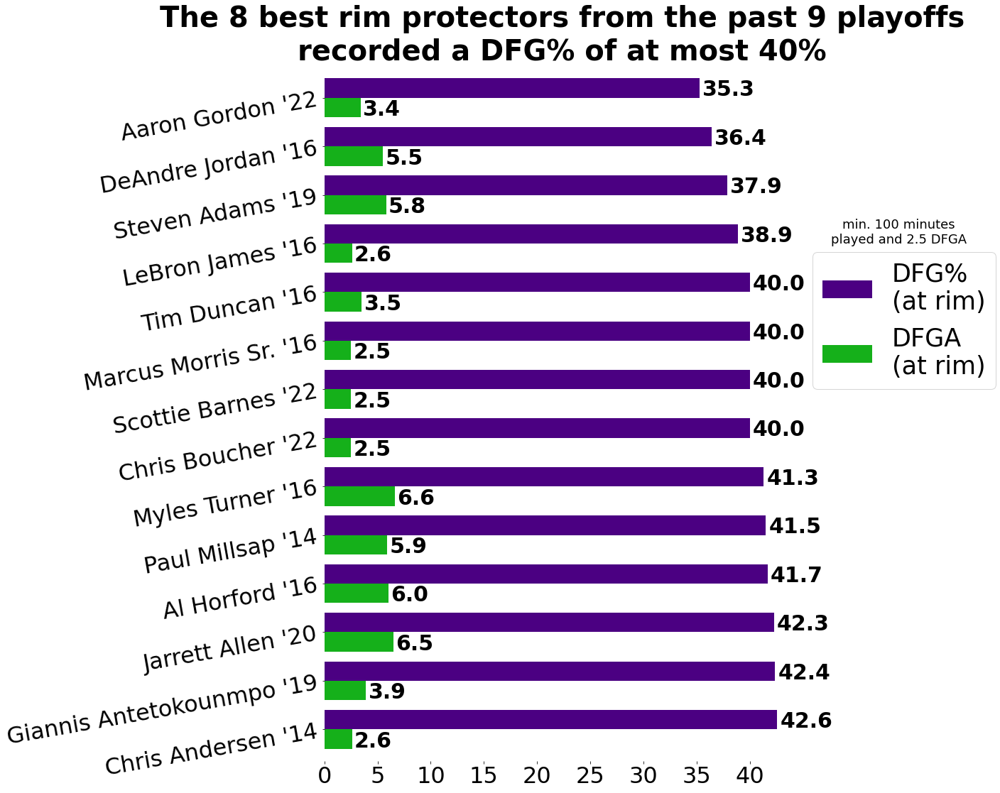

In [80]:
x = 2022
lst = []
for df in allDEFENSE:
    variable = df[(df['DFG%']<=47) & (df['MP']>=100) & (df['DFGA']>=2.5)][['DFGA', 'DFG%']].reset_index()
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_defense = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_defense)
df1 = new.sort_values('DFG%', ascending=True)
df1.set_index('PLAYER',inplace=True)
df1 = df1.head(14)

CreateBarH(df1, figsize=(12,18), title=
'''The 8 best rim protectors from the past 9 playoffs
recorded a DFG% of at most 40%''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.035, lowerbarshiftdown=.37, shiftupperbarleft=-2.75, shiftlowerbarleft=-2, 
           textbarfontsize=30,
           textbarcolor='black', legend_labels= 
['''DFGA
(at rim)''', '''DFG%
(at rim)'''], legend_order=[1,0], legend_pos=[1,.75], legend_size=35, width=.8, color=['xkcd:green', 'indigo']
          
          )
plt.text(54, 10, '''min. 100 minutes
played and 2.5 DFGA''', fontsize=18, ha='center')

#plt.savefig('bar best rim protectors past .pdf', bbox_inches='tight')
plt.show()

In [160]:
advanced22 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2021-22')
advanced21 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2020-21')
advanced20 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2019-20')
advanced19 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2018-19')
advanced18 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2017-18')
advanced17 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2016-17')
advanced16 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2015-16')
advanced15 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2014-15')
advanced14 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2013-14')
advanced13 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2012-13')
advanced12 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2011-12')
advanced11 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2010-11')
advanced10 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2009-10')
advanced09 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2008-09')
advanced08 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2007-08')
advanced07 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2006-07')
advanced06 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2005-06')
advanced05 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2004-05')
advanced04 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2003-04')
advanced03 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2002-03')
advanced02 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2001-02')
advanced01 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 2000-01')
advanced00 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 1999-00')
advanced99 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 1998-99')
advanced98 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='Advanced 1997-98')


In [161]:
allADVANCED = [advanced22, advanced21, advanced20, advanced19, advanced18, advanced17, advanced16, advanced15,
              advanced14, advanced13, advanced12, advanced11, advanced10, advanced09, advanced08, advanced07,
              advanced06, advanced05, advanced04, advanced03, advanced02, advanced01, advanced00, advanced99,
              advanced98]

In [163]:
for df in allADVANCED:
    df['ORB%'].replace('-', np.NAN, inplace=True)
    df['DRB%'].replace('-', np.NAN, inplace=True)
    df['TRB%'].replace('-', np.NAN, inplace=True)
    df['ORB%'].replace('-', np.NAN, inplace=True)
    df['DRB%'].replace('-', np.NAN, inplace=True)
    df['TRB%'].replace('-', np.NAN, inplace=True)
    df.dropna(inplace=True)
    df['''Net ORB% from league average'''] = df['ORB%'] - df['ORB%'].mean()
    df['''Net DRB% from league average'''] = df['DRB%'] - df['DRB%'].mean()

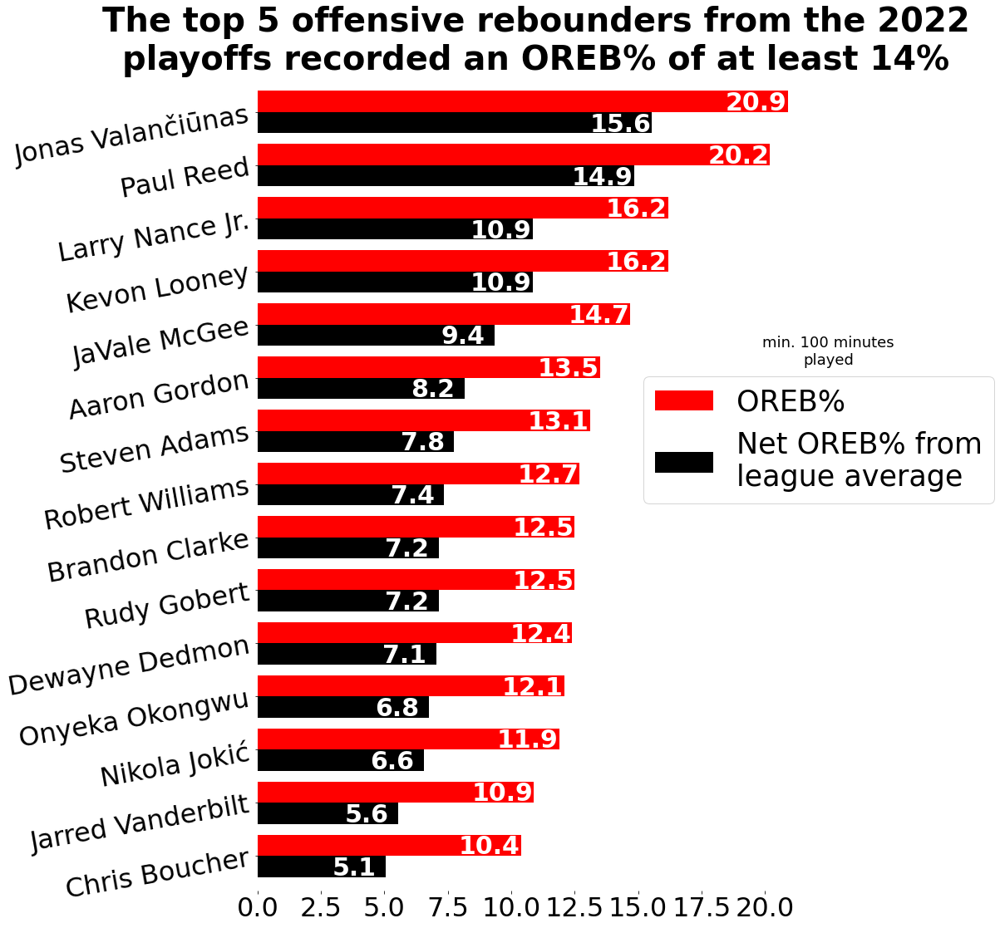

In [164]:
df1 = advanced22[(advanced22['MP']>=100) 
& (advanced22['ORB%']>=8)][['PLAYER','Net ORB% from league average', 'ORB%']].sort_values('ORB%', ascending=False)

df1 = df1.set_index('PLAYER').head(15)
CreateBarH(df1, figsize=(12,18), title=
'''The top 5 offensive rebounders from the 2022
playoffs recorded an OREB% of at least 14%''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.37, shiftupperbarleft=1.25, shiftlowerbarleft=1.25, 
           textbarfontsize=30, textbarcolor='white', legend_labels= 
['''Net OREB% from
league average''', '''OREB%'''], legend_order=[1,0], legend_pos=[1.35,.65], legend_size=35, width=.8, color=['black', 'red']
          )

plt.text(22.5, 9.25, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('best offensive rebounders 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

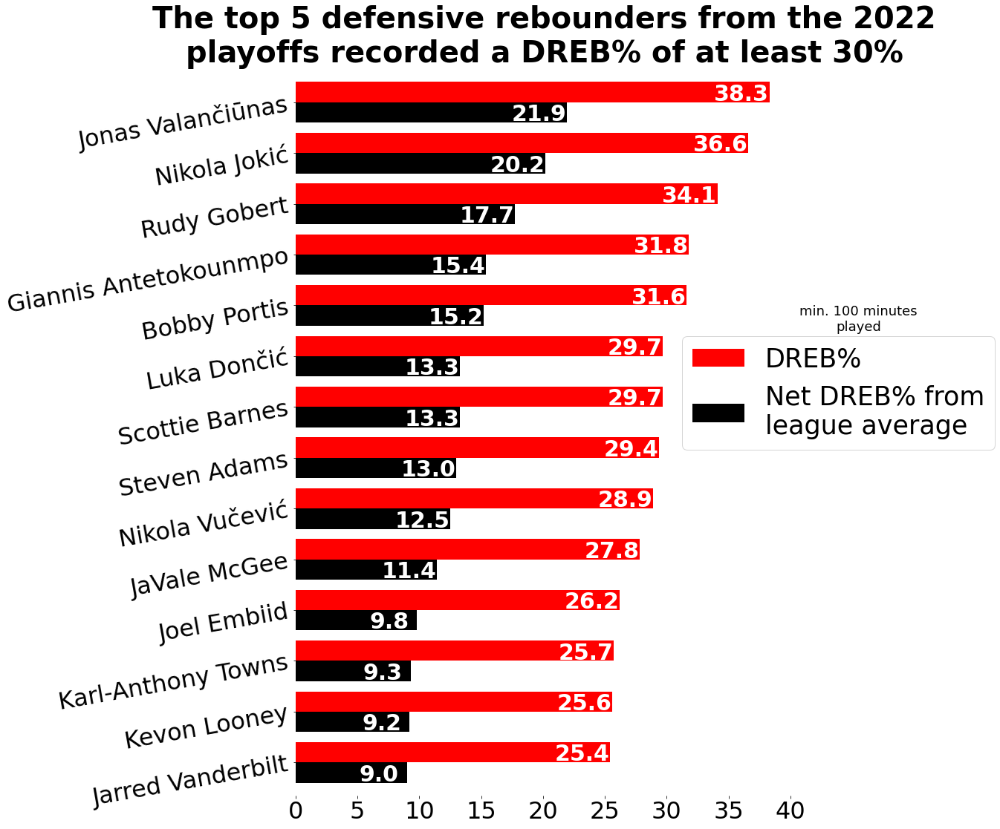

In [165]:
df1 = advanced22[(advanced22['MP']>=100) 
& (advanced22['DRB%']>=20)][['PLAYER','Net DRB% from league average', 'DRB%']].sort_values('DRB%', ascending=False)

df1 = df1.set_index('PLAYER').head(14)

CreateBarH(df1, figsize=(12,18), title=
'''The top 5 defensive rebounders from the 2022
playoffs recorded a DREB% of at least 30%''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.37, shiftupperbarleft=2.25, shiftlowerbarleft=2.25, 
           textbarfontsize=30, textbarcolor='white', legend_labels= 
['''Net DREB% from
league average''', '''DREB%'''], legend_order=[1,0], legend_pos=[.75,.65], legend_size=35, width=.8, 
           color=['black', 'red']
          )

plt.text(45.5, 8.5, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('best defensive rebounders 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

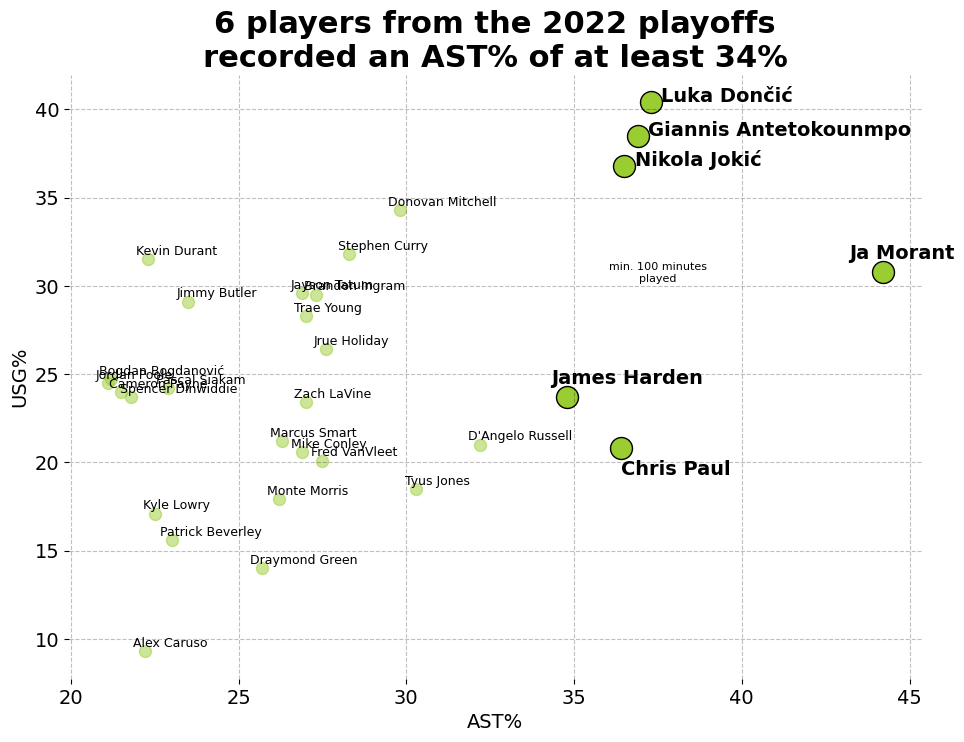

In [261]:
df1 = advanced22[(advanced22['MP']>=100) 
& (advanced22['AST%']>=21)][['PLAYER', 'AST%', 'USG%']].sort_values('AST%', ascending=False)

df1.set_index('PLAYER', inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 34]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 34]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 34]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'AST%': x, 'USG%':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='AST%', xlabelsize=14, xticksize=14,
              ylabel='USG%', ylabelsize=14, yticksize=14, title=
'''6 players from the 2022 playoffs
recorded an AST% of at least 34%''', titlefontsize=22, marker='o', scattercolor='yellowgreen',x1=-.35, 
              y1=.25, df2=df2, s2=250
             )
plt.text(44.2-1, 30.8+.75, 'Ja Morant', fontsize=14, weight='bold')
plt.text(37.3+.3, 40.4, 'Luka Dončić', fontsize=14, weight='bold')
plt.text(36.9+.3, 38.5, 'Giannis Antetokounmpo', fontsize=14, weight='bold')
plt.text(36.5+.3, 36.8, 'Nikola Jokić', fontsize=14, weight='bold')
plt.text(36.4, 20.8-1.5, 'Chris Paul', fontsize=14, weight='bold')
plt.text(34.8-.5, 23.7+.75, 'James Harden', fontsize=14, weight='bold')
plt.text(37.5, 30.25, '''min. 100 minutes
played''', fontsize=8, ha='center')

#plt.savefig('highest AST% 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

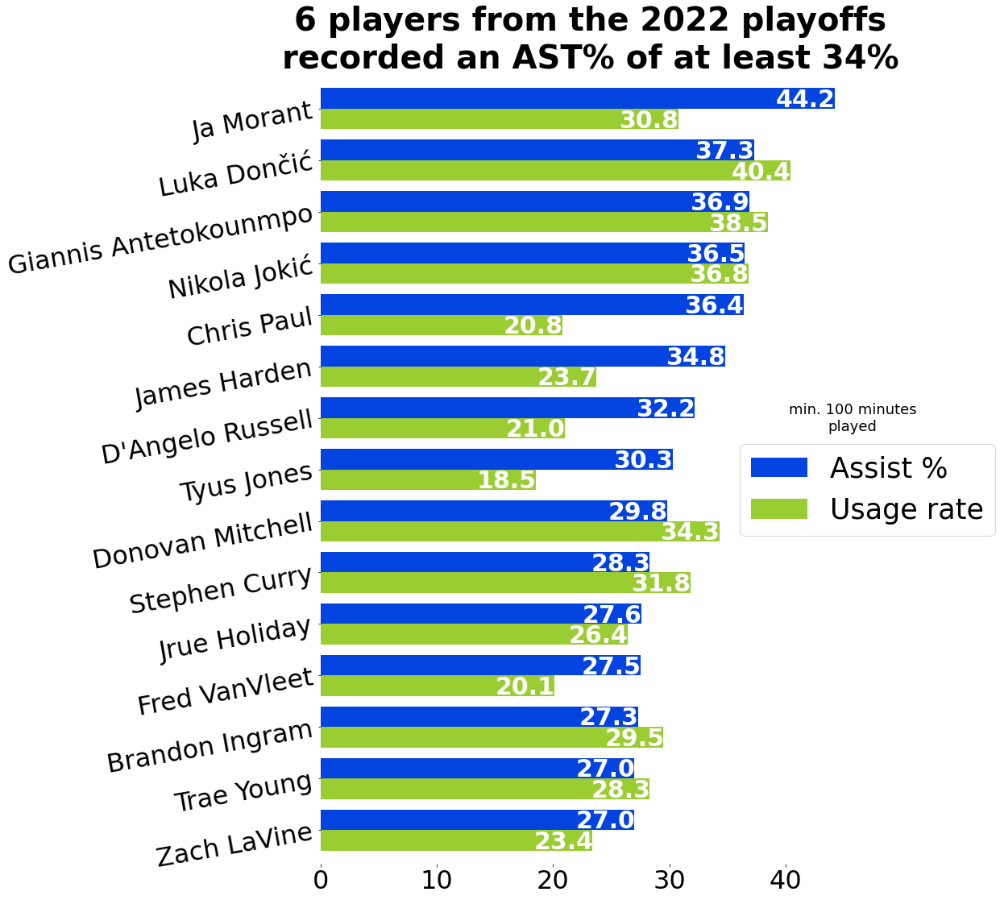

In [283]:
df1 = advanced22[(advanced22['MP']>=100) 
& (advanced22['AST%']>=21)][['PLAYER', 'USG%', 'AST%']].sort_values('AST%', ascending=False)

df1.set_index('PLAYER', inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title =
'''6 players from the 2022 playoffs
recorded an AST% of at least 34%''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.37, shiftupperbarleft=2.5, shiftlowerbarleft=2.5, textbarfontsize=30,
           textbarcolor='white', legend_labels= ['''Usage rate''', '''Assist %'''], legend_order=[1,0],
           legend_pos=[.75,.55], legend_size=35, width=.8, color=['yellowgreen', 'xkcd:blue']
          )
plt.text(45.75, 7.75, '''min. 100 minutes
played''', fontsize=18, ha='center')

#plt.savefig('bar highest AST% 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

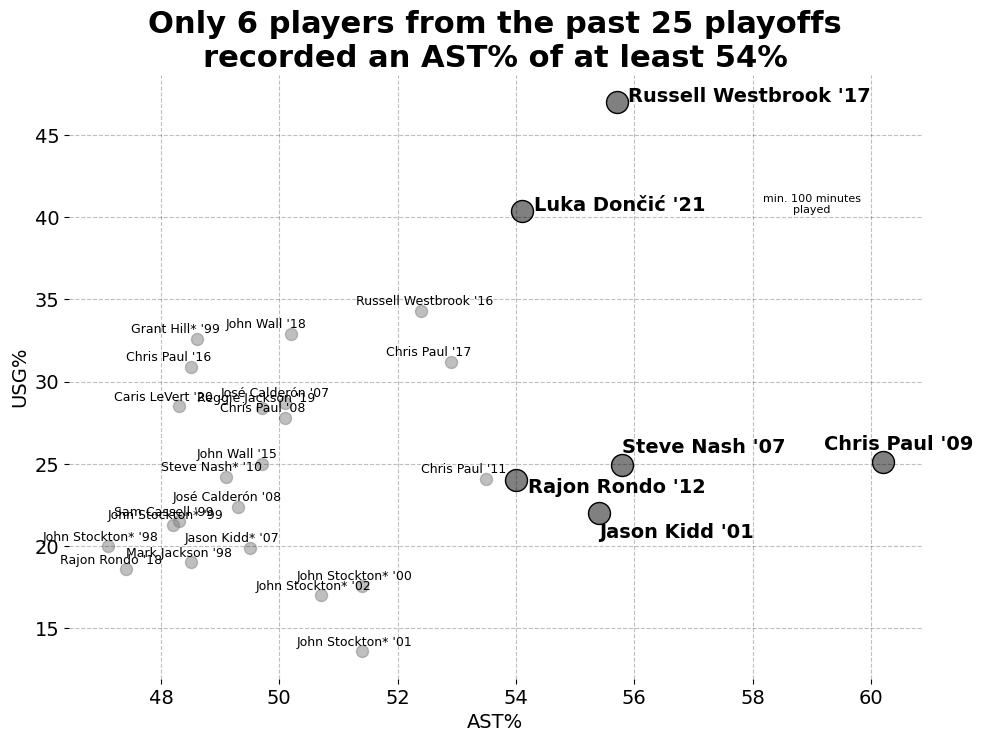

In [262]:
x = 2022
lst = []
for df in allADVANCED:
    variable = df[(df['AST%']>=47) & (df['MP']>=100)][['PLAYER','AST%', 'USG%']]
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_advanced = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_advanced)
df1 = new.sort_values('AST%', ascending=False)
df1.set_index('PLAYER',inplace=True)

names = [list(df1.index)[i] for i in range(len(df1.index)) if df1.iloc[i,0] >= 54]
x = [df1.iloc[i,0] for i in range(len(df1.index)) if df1.iloc[i,0] >= 54]
y = [df1.iloc[i,1] for i in range(len(df1.index)) if df1.iloc[i,0] >= 54]

df1.drop(names, inplace=True)

df2 = pd.DataFrame({
    "PLAYER":names, 'AST%': x, 'USG%':y
})
df2.set_index('PLAYER', inplace=True)

CreateScatter(df1, s1=75, alpha1=.5, figsize=(11,8), dpi=100, xlabel='AST%', xlabelsize=14, xticksize=14,
              ylabel='USG%', ylabelsize=14, yticksize=14, title = 
'''Only 6 players from the past 25 playoffs
recorded an AST% of at least 54%''', titlefontsize=22, marker='o', scattercolor='grey', df2=df2, 
              s2=250, y1=.35, x1=-1.1
             )

plt.text(60.2-1, 25.1+.75, "Chris Paul '09", fontsize=14, weight='bold')
plt.text(55.8, 24.9+.75, "Steve Nash '07", fontsize=14, weight='bold')
plt.text(55.7+.2, 47.0, "Russell Westbrook '17", fontsize=14, weight='bold')
plt.text(55.4, 22.0-1.5, "Jason Kidd '01", fontsize=14, weight='bold')
plt.text(54.1+.2, 40.4, "Luka Dončić '21", fontsize=14, weight='bold')
plt.text(54.0+.2, 24.0-.75, "Rajon Rondo '12", fontsize=14, weight='bold')
plt.text(59, 40.25, '''min. 100 minutes
played''', fontsize=8, ha='center')

#plt.savefig('scat highest AST% past 25 playoffs.pdf', bbox_inches='tight')
plt.show()

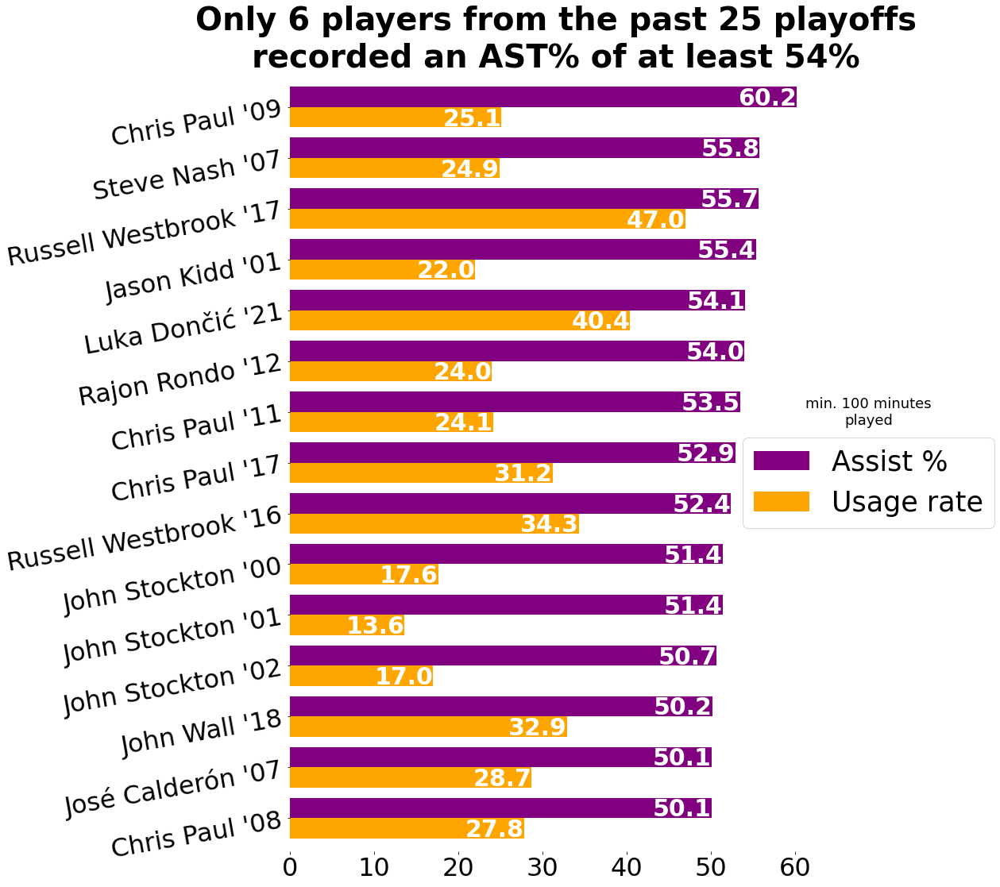

In [303]:
x = 2022
lst = []
for df in allADVANCED:
    variable = df[(df['AST%']>=47) & (df['MP']>=100)][['PLAYER','USG%', 'AST%']]
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_advanced = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_advanced)

collect = []
for i in range(len(new.index)):
    collect.append(new.iloc[i,0].replace('*', ''))

new['PLAYER'] = collect

df1 = new.sort_values('AST%', ascending=False)

df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title =
'''Only 6 players from the past 25 playoffs
recorded an AST% of at least 54%''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.37, shiftupperbarleft=3.5, shiftlowerbarleft=3.5, textbarfontsize=30,
           textbarcolor='white', legend_labels= ['''Usage rate''', '''Assist %'''], legend_order=[1,0],
           legend_pos=[.825,.55], legend_size=35, width=.8, color=['orange', 'purple']
          )
plt.text(68.75, 7.75, '''min. 100 minutes
played''', fontsize=18, ha='center')

#plt.savefig('bar highest AST% 2022 past 25 playoffs.pdf', bbox_inches='tight')
plt.show()

In [305]:
passing22 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='PASSING 2021-22')
passing21 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='PASSING 2020-21')
passing20 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='PASSING 2019-20')
passing19 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='PASSING 2018-19')
passing18 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='PASSING 2017-18')
passing17 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='PASSING 2016-17')
passing16 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='PASSING 2015-16')
passing15 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='PASSING 2014-15')
passing14 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='PASSING 2013-14')

In [306]:
allPASSING = [passing22, passing21, passing20, passing19, passing18, passing17, passing16, passing15, passing14]

In [313]:
for df in allPASSING:
    df['MP'] = df['GP'] * df['MIN']

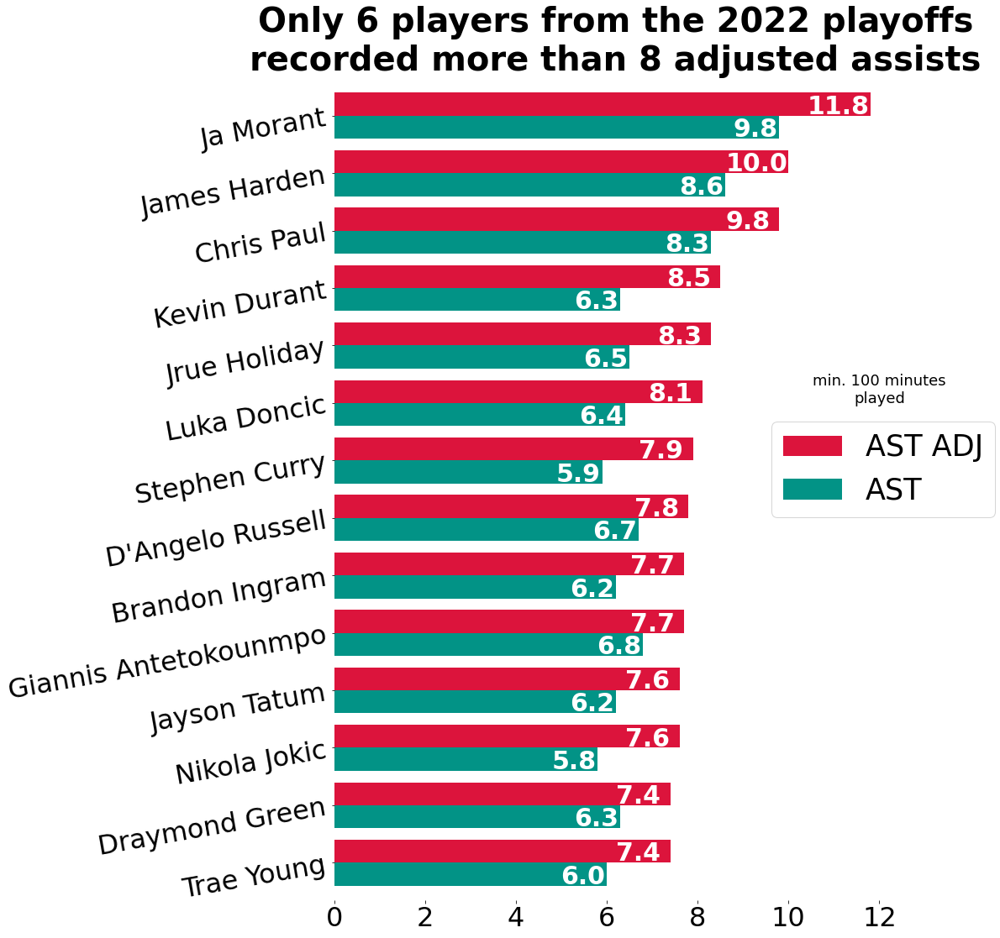

In [344]:
df1 = passing22[(passing22['AST ADJ']>=7)
& (passing22['MP']>=100)][['PLAYER', 'AST', 'AST ADJ']].sort_values('AST ADJ', ascending=False)

df1 = df1.set_index('PLAYER').head(14)
CreateBarH(df1, figsize=(12,18), title=
'''Only 6 players from the 2022 playoffs
recorded more than 8 adjusted assists''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.37, shiftupperbarleft=.7, shiftlowerbarleft=.525, textbarfontsize=30,
           textbarcolor='white', legend_labels=['AST', 'AST ADJ'], legend_order=[1,0], legend_pos=[.75,.6], 
           legend_size=35, width=.8, color=['xkcd:teal', 'crimson']
          )
plt.text(12, 8, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('highest ast adj 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

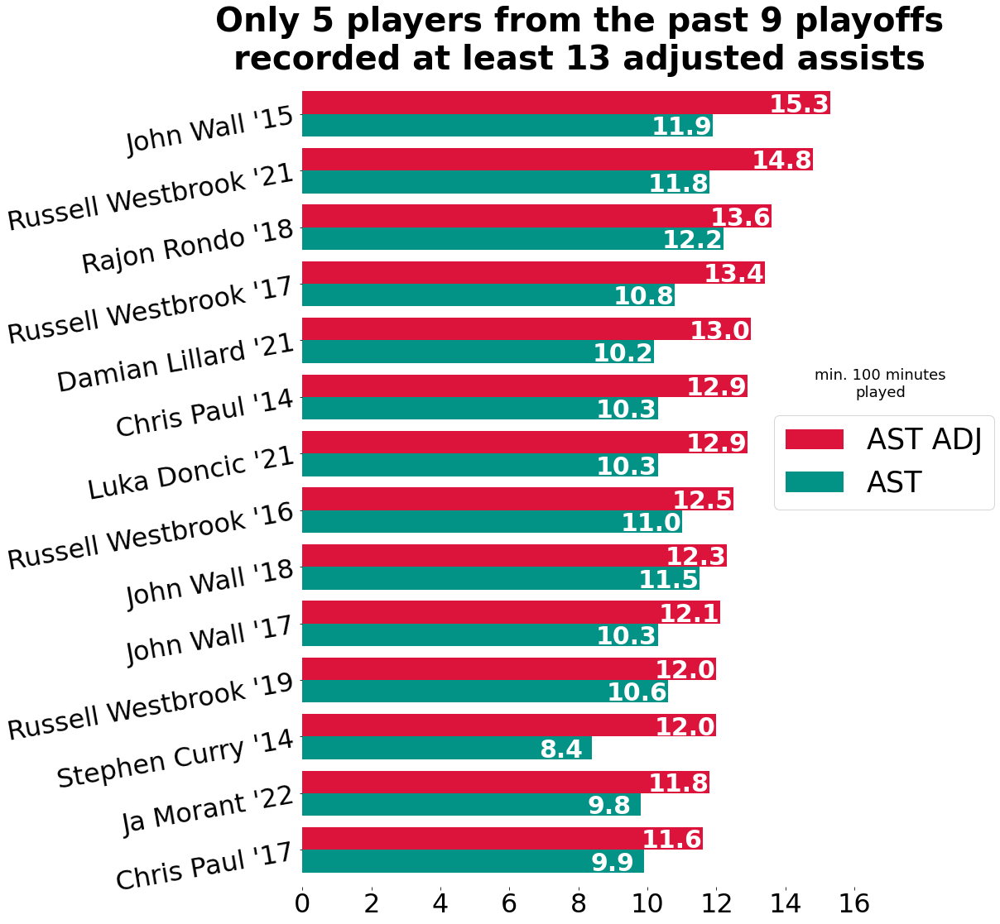

In [377]:
x = 2022
lst = []
for df in allPASSING:
    variable = df[(df['AST ADJ']>=10) & (df['MP']>=100)][['PLAYER','AST', 'AST ADJ']]
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_passing = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_passing)

df1 = new.sort_values('AST ADJ', ascending=False)

df1.set_index('PLAYER',inplace=True)

df1 = df1.head(14)

CreateBarH(df1, figsize=(12,18), title=
'''Only 5 players from the past 9 playoffs
recorded at least 13 adjusted assists''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.37, shiftupperbarleft=.9, shiftlowerbarleft=.9, textbarfontsize=30,
           textbarcolor='white', legend_labels=['AST', 'AST ADJ'], legend_order=[1,0], legend_pos=[.825,.6], 
           legend_size=35, width=.8, color=['xkcd:teal', 'crimson']
          )
           
plt.text(16.75, 8, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('highest ast adj past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

In [381]:
RAPTOR22 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='RAPTOR 2021-22')
RAPTOR21 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='RAPTOR 2020-21')
RAPTOR20 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='RAPTOR 2019-20')
RAPTOR19 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='RAPTOR 2018-19')
RAPTOR18 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='RAPTOR 2017-18')
RAPTOR17 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='RAPTOR 2016-17')
RAPTOR16 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='RAPTOR 2015-16')
RAPTOR15 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='RAPTOR 2014-15')
RAPTOR14 = pd.read_excel('nbaPlayoffs_PlayersStats.xlsx', sheet_name='RAPTOR 2013-14')

In [382]:
allRAPTOR = [RAPTOR22, RAPTOR21, RAPTOR20, RAPTOR19, RAPTOR18, RAPTOR17, RAPTOR16, RAPTOR15, RAPTOR14]

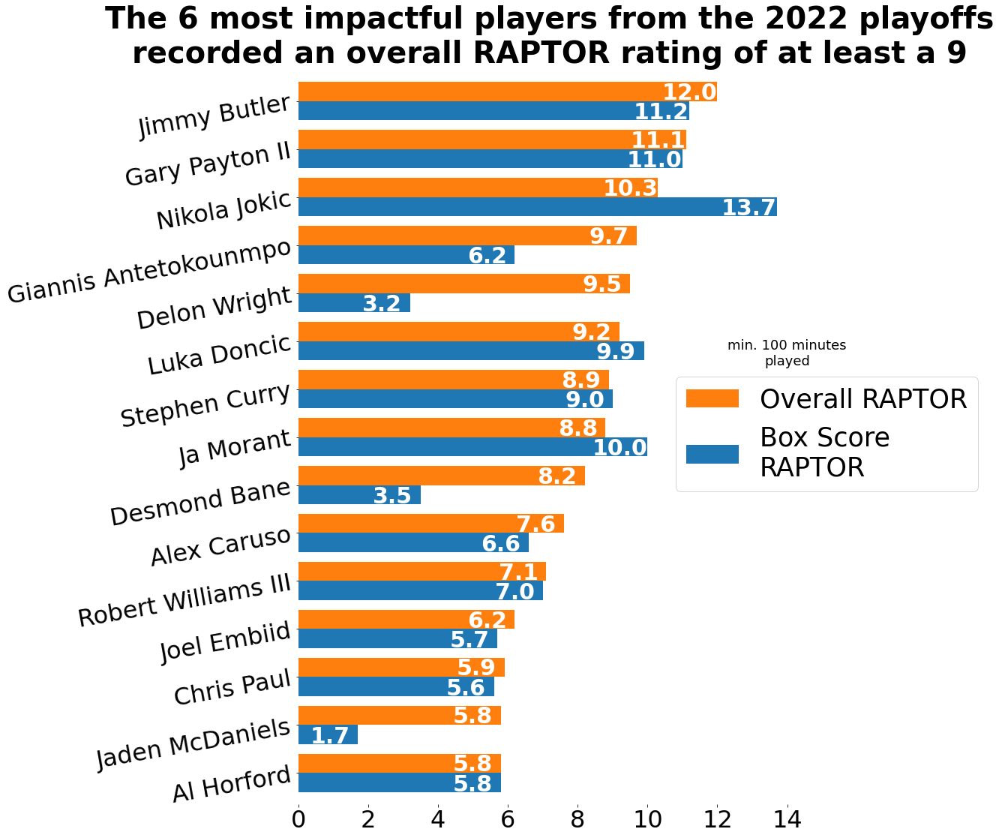

In [444]:
df1 = RAPTOR22[(RAPTOR22['MINUTES']>=100) 
& (RAPTOR22['TOT - OVERALL RAPTOR']>=5)][['PLAYER', 'TOT - BOX SCORE RAPTOR', 'TOT - OVERALL RAPTOR']].sort_values('TOT - OVERALL RAPTOR', ascending=False)

df1 = df1.set_index('PLAYER').head(15)

CreateBarH(df1, figsize=(12,18), title=
'''The 6 most impactful players from the 2022 playoffs
recorded an overall RAPTOR rating of at least a 9''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.38, shiftupperbarleft=.8, shiftlowerbarleft=.8, textbarfontsize=30,
           textbarcolor='white', legend_labels= 
['''Box Score 
RAPTOR''', '''Overall RAPTOR'''], legend_order=[1,0],
           legend_pos=[.725,.6], legend_size=35, width=.8
           
           
          )
plt.text(14, 8.5, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('highest overall raptor 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

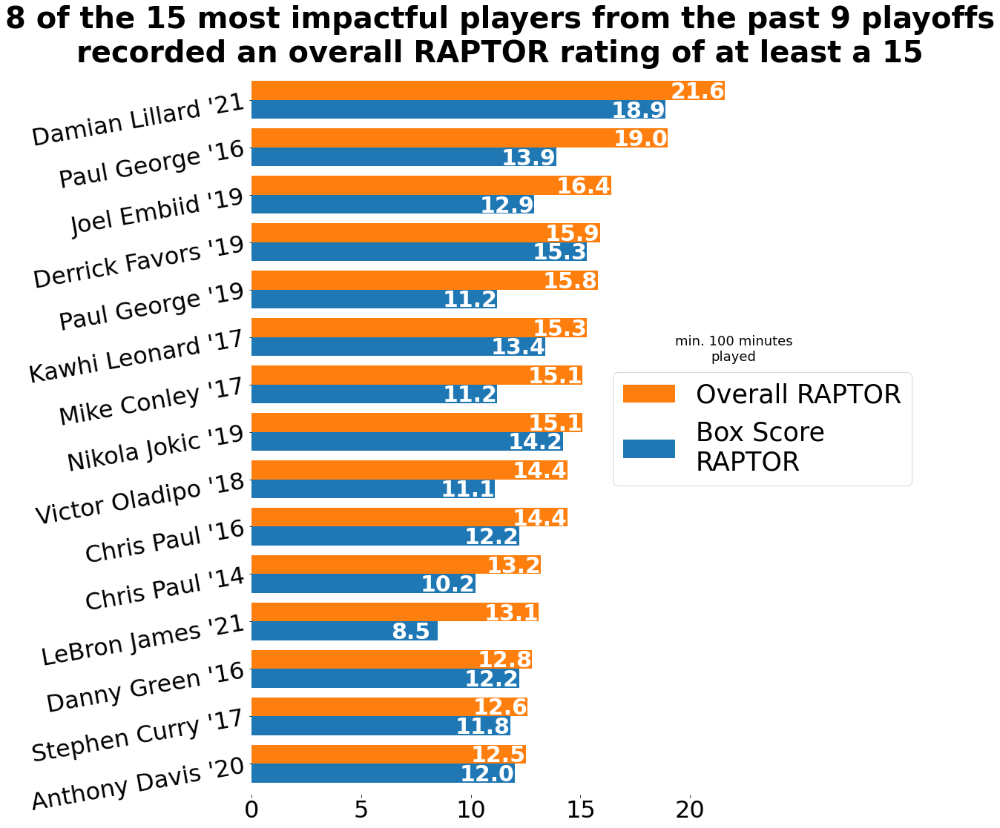

In [552]:
x = 2022
lst = []
for df in allRAPTOR:
    variable = df[(df['TOT - OVERALL RAPTOR']>=10) 
    & (df['MINUTES']>=100)][['PLAYER', 'TOT - BOX SCORE RAPTOR', 'TOT - OVERALL RAPTOR']]
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_RAPTOR = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_RAPTOR)

df1 = new.sort_values('TOT - OVERALL RAPTOR', ascending=False)

df1.set_index('PLAYER',inplace=True)

df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title=
'''8 of the 15 most impactful players from the past 9 playoffs
recorded an overall RAPTOR rating of at least a 15''', titlefontsize=40, xticksize=32, yticksize=32, ytickrotate=10, 
           upperbarshiftup=.03, lowerbarshiftdown=.37, shiftupperbarleft=1.25, shiftlowerbarleft=1.25,textbarfontsize=30,
           textbarcolor='white', legend_labels= 
['''Box Score 
RAPTOR''', '''Overall RAPTOR'''], legend_order=[1,0],
           legend_pos=[.7,.6], legend_size=35, width=.8
           
           
          )
plt.text(22, 8.5, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('highest overall raptor past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

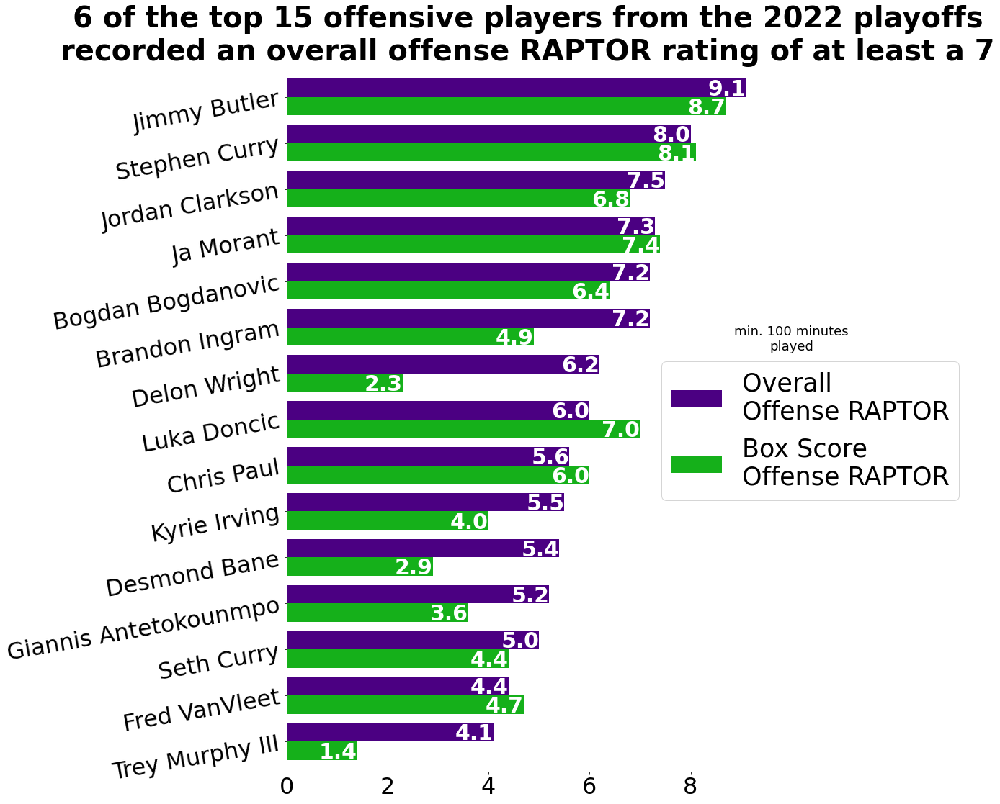

In [489]:
df1 = RAPTOR22[(RAPTOR22['MINUTES']>=100) 
& (RAPTOR22['OFF - OVERALL RAPTOR']>=4)][['PLAYER', 'OFF - BOX SCORE RAPTOR', 'OFF - OVERALL RAPTOR']].sort_values('OFF - OVERALL RAPTOR', ascending=False)
df1 = df1.set_index('PLAYER').head(15)
CreateBarH(df1, figsize=(12,18), title= 
'''6 of the top 15 offensive players from the 2022 playoffs
recorded an overall offense RAPTOR rating of at least a 7''', titlefontsize=40, xticksize=32, yticksize=32, 
           ytickrotate=10, upperbarshiftup=.03, lowerbarshiftdown=.375,
           shiftupperbarleft=.38, shiftlowerbarleft=.38, textbarfontsize=30, textbarcolor='white', legend_labels= 
['''Box Score
Offense RAPTOR''', '''Overall
Offense RAPTOR'''], legend_order=[1,0], legend_pos=[.75,.6], legend_size=35, 
           color=['xkcd:green', 'indigo'], width=.8
          )

plt.text(10, 8.5, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('highest offense raptor 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

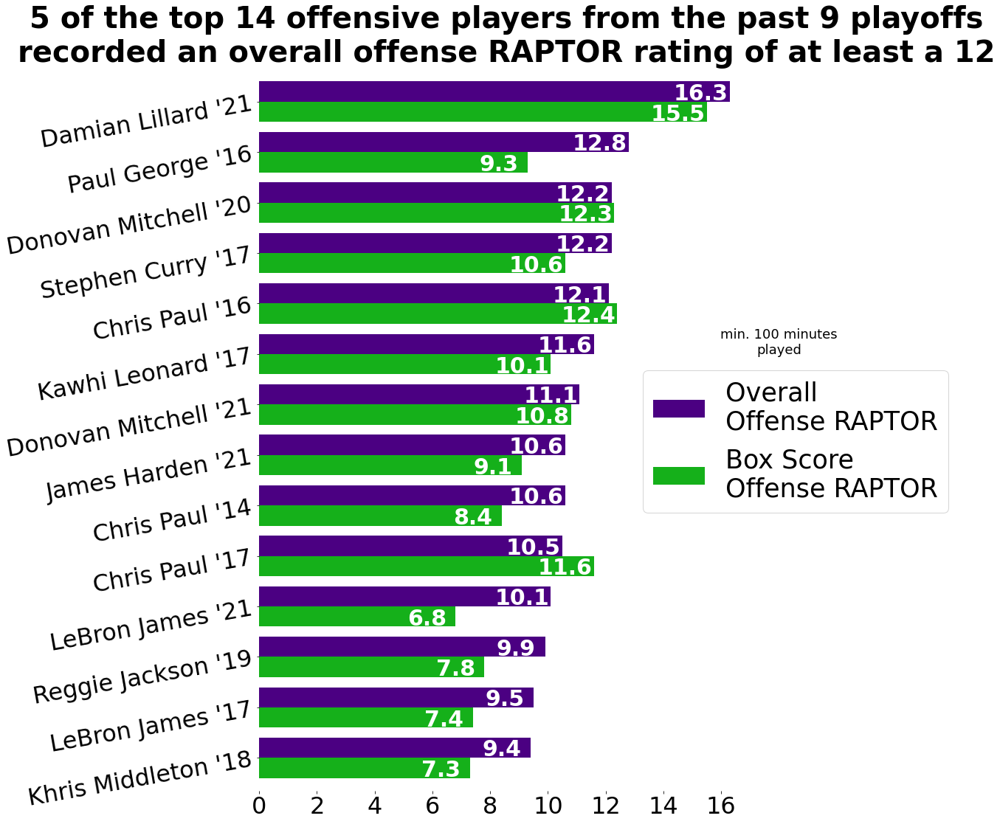

In [511]:
x = 2022
lst = []
for df in allRAPTOR:
    variable = df[(df['OFF - OVERALL RAPTOR']>=9) 
    & (df['MINUTES']>=100)][['PLAYER', 'OFF - BOX SCORE RAPTOR', 'OFF - OVERALL RAPTOR']]
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_RAPTOR = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_RAPTOR)

df1 = new.sort_values('OFF - OVERALL RAPTOR', ascending=False)

df1.set_index('PLAYER',inplace=True)

df1= df1.head(14)

CreateBarH(df1, figsize=(12,18), title= 
'''5 of the top 14 offensive players from the past 9 playoffs
recorded an overall offense RAPTOR rating of at least a 12''', titlefontsize=40, xticksize=32, yticksize=32, 
           ytickrotate=10, upperbarshiftup=.03, lowerbarshiftdown=.375,
           shiftupperbarleft=1, shiftlowerbarleft=1, textbarfontsize=30, textbarcolor='white', legend_labels= 
['''Box Score
Offense RAPTOR''', '''Overall
Offense RAPTOR'''], legend_order=[1,0], legend_pos=[.75,.6], legend_size=35, 
           color=['xkcd:green', 'indigo'], width=.8
          )

plt.text(18, 8, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('highest offense raptor past 9 playoffs.pdf', bbox_inches='tight')
plt.show()

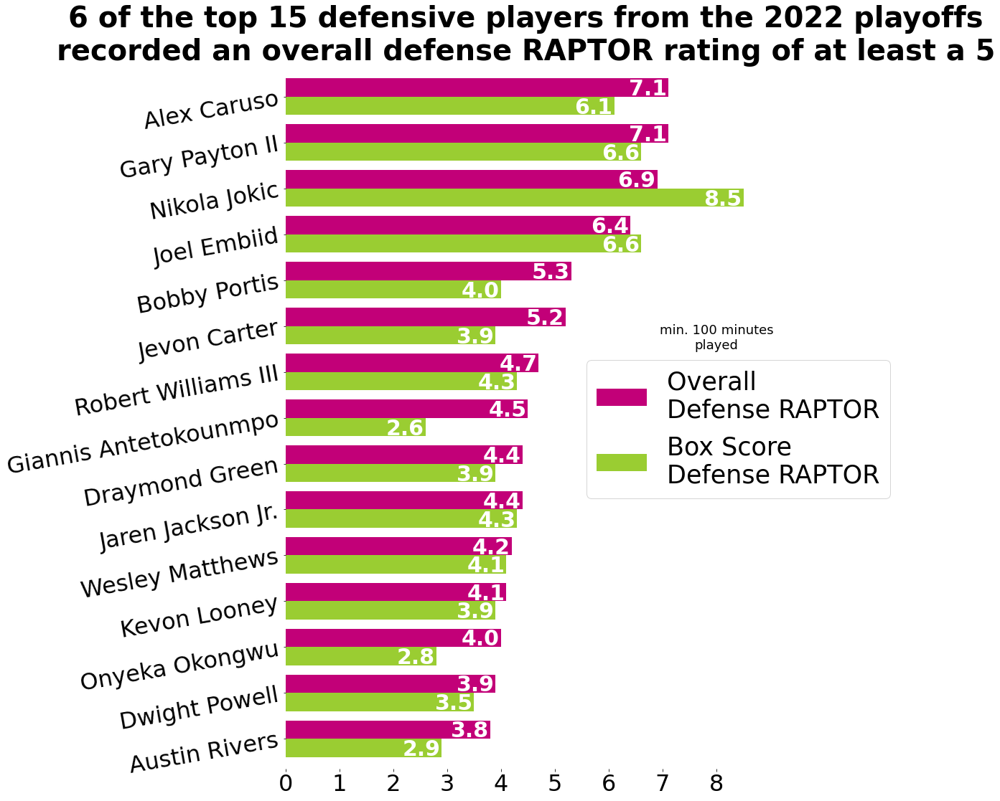

In [530]:
df1 = RAPTOR22[(RAPTOR22['MINUTES']>=100) 
& (RAPTOR22['DEF - OVERALL RAPTOR']>=3)][['PLAYER', 'DEF - BOX SCORE RAPTOR', 'DEF - OVERALL RAPTOR']].sort_values('DEF - OVERALL RAPTOR', ascending=False)
df1= df1.set_index('PLAYER').head(15)

CreateBarH(df1, figsize=(12,18), title= 
'''6 of the top 15 defensive players from the 2022 playoffs
recorded an overall defense RAPTOR rating of at least a 5''', titlefontsize=40, xticksize=32, yticksize=32, 
           ytickrotate=10, upperbarshiftup=.03, lowerbarshiftdown=.375,
           shiftupperbarleft=.38, shiftlowerbarleft=.38, textbarfontsize=30, textbarcolor='white', legend_labels= 
['''Box Score
Defense RAPTOR''', '''Overall
Defense RAPTOR'''], legend_order=[1,0], legend_pos=[.6,.6], legend_size=35, 
           color=['yellowgreen', 'xkcd:magenta'], width=.8
          )

plt.text(8, 8.5, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('highest defense raptor 2022 playoffs.pdf', bbox_inches='tight')
plt.show()

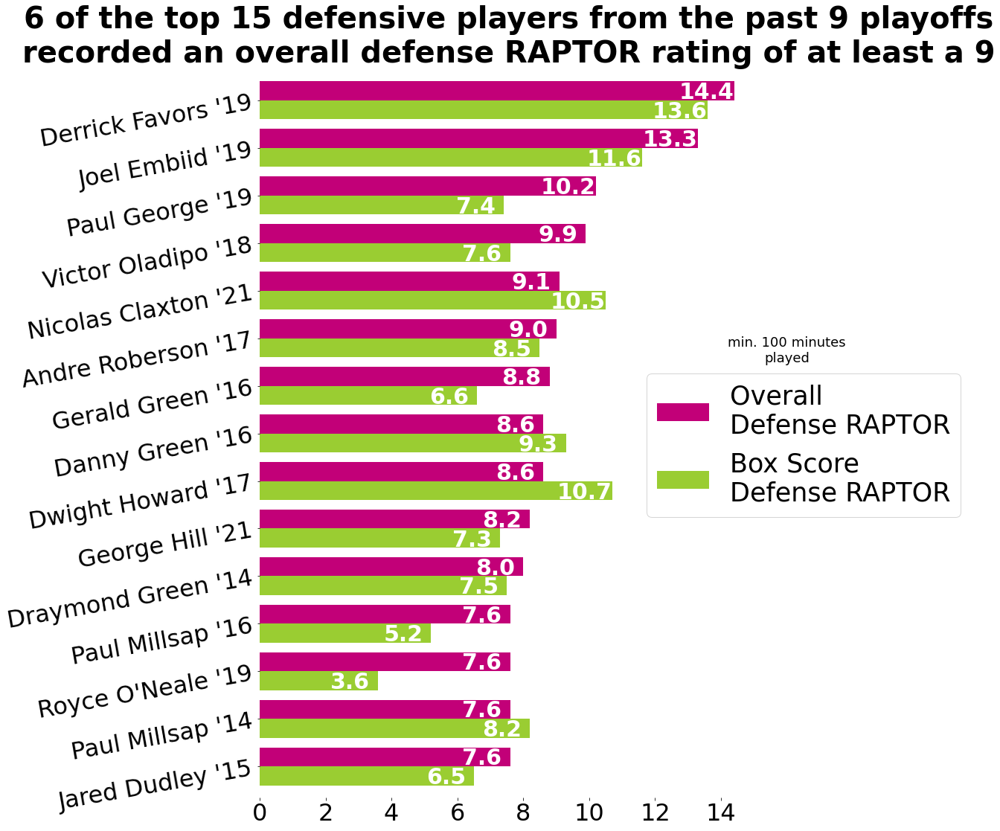

In [551]:
x = 2022
lst = []
for df in allRAPTOR:
    variable = df[(df['DEF - OVERALL RAPTOR']>=7) 
    & (df['MINUTES']>=100)][['PLAYER', 'DEF - BOX SCORE RAPTOR', 'DEF - OVERALL RAPTOR']]
    variable['PLAYER'] = variable['PLAYER'] + ' \'' + str(x)[-2:]
    lst.append(variable)
    x -= 1

new_RAPTOR = [lst[i] for i in range(len(lst))]

new = reduce(lambda left, right: pd.merge(left, right, how='outer'), new_RAPTOR)

df1 = new.sort_values('DEF - OVERALL RAPTOR', ascending=False)

df1.set_index('PLAYER',inplace=True)
df1 = df1.head(15)

CreateBarH(df1, figsize=(12,18), title= 
'''6 of the top 15 defensive players from the past 9 playoffs
recorded an overall defense RAPTOR rating of at least a 9''', titlefontsize=40, xticksize=32, yticksize=32, 
           ytickrotate=10, upperbarshiftup=.03, lowerbarshiftdown=.375,
           shiftupperbarleft=.85, shiftlowerbarleft=.85, textbarfontsize=30, textbarcolor='white', legend_labels= 
['''Box Score
Defense RAPTOR''', '''Overall
Defense RAPTOR'''], legend_order=[1,0], legend_pos=[.75,.6], legend_size=35, 
           color=['yellowgreen', 'xkcd:magenta'], width=.8
          )

plt.text(16, 8.5, '''min. 100 minutes
played''', ha='center', fontsize=18)

#plt.savefig('highest defense raptor past 9 playoffs.pdf', bbox_inches='tight')
plt.show()